### Table of contents:


1.0 Business Problem

2.0 Preparing Dev Environment and Importing Libraries

3.0 Data Preparation

4.0 Train-test Data Split

5.0 Exploratory Data Analysis

6.0 Data Preprocessing - Cleaning and Transformation

7.0 Conclusion

8.0 Data Exporting


# 2.0 Preparing Dev Environment and Importing Libraries

In [165]:
# setting logging to print only error messages from Sklearnex
import logging
import time
logging.basicConfig()
logging.getLogger("SKLEARNEX").setLevel(logging.ERROR)

!pip install imblearn
#importing libraries for importing data and data computation
import pandas as pd
import numpy as np
import seaborn as sns
#importing library for data visualisation
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings(action='ignore')
#importing libraries to carry out data cleaning and transformation
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# Modules and Libraries Importation

import statsmodels.api as sm
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_fscore_support
import matplotlib.pyplot as plt
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier
from warnings import filterwarnings

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error as mae
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error



filterwarnings("ignore")

In [5]:
sns.set(style ='whitegrid', color_codes=True)
#sns.set_palette("cubehelix")
#sns.set_theme(palette="crest")
#sns.set_theme(palette="plasma")
#sns.cubehelix_palette(start=2, rot=0, dark=0, light=.95, reverse=True, as_cmap=True)



In [167]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000





# 3.0 - Data Preparation

In [170]:
#Load datasets
stocks_df = pd.read_excel("/Users/SIMISOLA3/Documents/StockData Merged & Final for EDA.xlsx")
stocks_df.head()


,Date,Open,High,Low,Previous Day Price,Close,Adj Close,Volume,Ticker,Price Change,Company Name,Market Capitalization,Industry,Sector,cashAndCashEquivalents,netReceivables,inventory,totalCurrentAssets,propertyPlantEquipmentNet,goodwill,totalNonCurrentAssets,totalAssets,accountPayables,totalCurrentLiabilities,totalLiabilities,retainedEarnings,totalEquity,totalDebt,netDebt,revenue,costOfRevenue,grossProfit,grossProfitRatio,operatingExpenses,interestIncome,interestExpense,depreciationAndAmortization,ebitda,ebitdaratio,operatingIncome,operatingIncomeRatio,netIncome,netIncomeRatio,eps,numberOfShares,marketCapitalization,minusCashAndCashEquivalents,addTotalDebt,enterpriseValue,changeInWorkingCapital,accountsReceivables,accountsPayables,debtRepayment,dividendsPaid,operatingCashFlow,capitalExpenditure,freeCashFlow,InflationRate,Federal Reserve Fund rates,Value - T,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,AvgTotScore,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),IsCovidYear,Day,Day of Week,Year,Month,Quarter,QuarterID,MonthID,MonthYear,DateID
0,2023-03-17,156.080,156.740,154.28,155.85,155.00,155.00,98944633,AAPL,Decrease,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,17,Friday,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,17/03/2023AAPL
1,2023-03-16,152.160,156.460,151.64,152.99,155.85,155.85,76254419,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,16,Thursday,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,16/03/2023AAPL
2,2023-03-15,151.190,153.245,149.92,152.59,152.99,152.99,77167866,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,15,Wednesday,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,15/03/2023AAPL
3,2023-03-14,151.280,153.400,150.10,150.47,152.59,152.59,73695893,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,14,Tuesday,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,14/03/2023AAPL
4,2023-03-13,147.805,153.140,147.70,148.50,150.47,150.47,84457122,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,13,Monday,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,13/03/2023AAPL


In [7]:
#check info of dataset, entries, no of columns, datatype etc
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64511 entries, 0 to 64510
Data columns (total 92 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          64511 non-null  datetime64[ns]
 1   Open                          64511 non-null  float64       
 2   High                          64511 non-null  float64       
 3   Low                           64511 non-null  float64       
 4   Previous Day Price            64511 non-null  float64       
 5   Close                         64511 non-null  float64       
 6   Adj Close                     64511 non-null  float64       
 7   Volume                        64511 non-null  int64         
 8   Ticker                        64511 non-null  object        
 9   Price Change                  64511 non-null  object        
 10  Company Name                  64511 non-null  object        
 11  Market Capitalization       

In [168]:
#check for null values
stocks_df.notnull().sum()

Date                            64511
Open                            64511
High                            64511
Low                             64511
Previous Day Price              64511
Close                           64511
Adj Close                       64511
Volume                          64511
Ticker                          64511
Price Change                    64511
Company Name                    64511
Market Capitalization           64511
Industry                        64511
Sector                          64511
cashAndCashEquivalents          60063
netReceivables                  60063
inventory                       60063
totalCurrentAssets              60063
propertyPlantEquipmentNet       60063
goodwill                        60063
totalNonCurrentAssets           60063
totalAssets                     60063
accountPayables                 60063
totalCurrentLiabilities         60063
totalLiabilities                60063
retainedEarnings                60063
totalEquity 

In [169]:
# Check percentage of Nulls in each field 

(stocks_df.isnull().sum()/(len(stocks_df)))*100

Date                             0.000000
Open                             0.000000
High                             0.000000
Low                              0.000000
Previous Day Price               0.000000
Close                            0.000000
Adj Close                        0.000000
Volume                           0.000000
Ticker                           0.000000
Price Change                     0.000000
Company Name                     0.000000
Market Capitalization            0.000000
Industry                         0.000000
Sector                           0.000000
cashAndCashEquivalents           6.894948
netReceivables                   6.894948
inventory                        6.894948
totalCurrentAssets               6.894948
propertyPlantEquipmentNet        6.894948
goodwill                         6.894948
totalNonCurrentAssets            6.894948
totalAssets                      6.894948
accountPayables                  6.894948
totalCurrentLiabilities          6

In [10]:
# Data Reduction - reduce numeric columns using correlation
stocks_df.corr()

,Open,High,Low,Previous Day Price,Close,Adj Close,Volume,cashAndCashEquivalents,netReceivables,inventory,...,Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),Day,Year,Quarter
Open,1.000000,0.999974,0.999968,0.999158,0.999943,0.999902,-0.078670,0.040847,0.185965,0.243320,...,0.074480,0.058706,0.048381,0.246671,0.354701,0.354760,0.354638,-0.000789,0.002833,-0.018511
High,0.999974,1.000000,0.999955,0.999139,0.999968,0.999927,-0.078667,0.040506,0.185088,0.242709,...,0.074677,0.058880,0.048503,0.246503,0.355087,0.355146,0.355024,-0.000798,0.002904,-0.018562
Low,0.999968,0.999955,1.000000,0.999132,0.999971,0.999931,-0.078693,0.041224,0.186959,0.243893,...,0.074248,0.058031,0.047889,0.246422,0.353400,0.353459,0.353337,-0.000742,0.002609,-0.018416
Previous Day Price,0.999158,0.999139,0.999132,1.000000,0.999105,0.999087,-0.078673,0.008357,0.040093,0.053341,...,0.074434,0.058272,0.048070,0.245901,0.355126,0.355185,0.355062,-0.000782,0.002713,-0.018620
Close,0.999943,0.999968,0.999971,0.999105,1.000000,0.999959,-0.078680,0.040847,0.186017,0.243265,...,0.074491,0.058539,0.048259,0.246140,0.354498,0.354557,0.354435,-0.000781,0.002767,-0.018494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
min price (Acquired),0.354760,0.355146,0.353459,0.355185,0.354557,0.354557,-0.027449,0.145626,0.255290,0.159856,...,0.038290,0.411489,0.301596,-0.010279,0.999999,1.000000,0.999997,0.006302,0.010606,0.008312
Max Price (Acquired),0.354638,0.355024,0.353337,0.355062,0.354435,0.354435,-0.027636,0.084423,0.183549,0.235689,...,0.038910,0.412018,0.302187,-0.010400,0.999999,0.999997,1.000000,0.006289,0.010605,0.008435
Day,-0.000789,-0.000798,-0.000742,-0.000782,-0.000781,-0.000790,-0.006035,-0.000876,-0.000546,-0.000901,...,0.005506,-0.011505,0.010626,0.008690,0.006296,0.006302,0.006289,1.000000,-0.023329,0.018688
Year,0.002833,0.002904,0.002609,0.002713,0.002767,0.002749,0.107280,0.008938,0.049939,0.034231,...,-0.093696,0.147001,0.033355,-0.123173,0.010623,0.010606,0.010605,-0.023329,1.000000,-0.026884


In [11]:
# reduced columns 
newstocks_df= stocks_df[[
'Close','Previous Day Price','Price Change','Volume','Ticker','Market Capitalization','Industry','Sector','netReceivables',
'inventory','propertyPlantEquipmentNet','totalCurrentAssets','totalLiabilities','totalEquity','totalDebt','totalCurrentLiabilities',
'revenue','grossProfit','operatingExpenses','ebitda','operatingIncome','netIncome','eps','accountsReceivables','accountsPayables',
'dividendsPaid','operatingCashFlow','capitalExpenditure','numberOfShares','marketCapitalization','addTotalDebt','enterpriseValue',
'EnvironmentScore','SocialScore','GovernanceScore','ESGscore', 'No of mentions',  'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions','TotNegativeMentions',     
'Count transaction (disposed)','Total Amount (disposed)','No of shares (disposed)','Avg Share Price (disposed) ',
'Min price (disposed)','Max Price (disposed)','Count Acquired','Total Amount(Acquired)','No of Shares(Acquired)','Avg Share Price (Acquired)','min price (Acquired)','Max Price (Acquired)','InflationRate','Value - T',
'IsCovidYear','Date','Year','Quarter','Month','Day','Day of Week']]

In [12]:
newstocks_df= pd.DataFrame(newstocks_df)
newstocks_df

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,...,Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
0,155.00,155.85,Decrease,98944633,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,...,NaN,NaN,NaN,Covid,2023-03-17,2023,1,March,17,Friday
1,155.85,152.99,Increase,76254419,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,...,NaN,NaN,NaN,Covid,2023-03-16,2023,1,March,16,Thursday
2,152.99,152.59,Increase,77167866,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,...,NaN,NaN,NaN,Covid,2023-03-15,2023,1,March,15,Wednesday
3,152.59,150.47,Increase,73695893,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,...,NaN,NaN,NaN,Covid,2023-03-14,2023,1,March,14,Tuesday
4,150.47,148.50,Increase,84457122,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,...,NaN,NaN,NaN,Covid,2023-03-13,2023,1,March,13,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,2.03,1.99,Increase,12975,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.0,0.0,...,0.2,2.1,20.83,NonCovid,2018-01-08,2018,1,January,8,Monday
64507,1.99,1.85,Increase,33562,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.0,0.0,...,0.2,2.1,20.83,NonCovid,2018-01-05,2018,1,January,5,Friday
64508,1.85,1.88,Decrease,6242,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.0,0.0,...,0.2,2.1,20.83,NonCovid,2018-01-04,2018,1,January,4,Thursday
64509,1.88,1.90,Decrease,14555,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.0,0.0,...,0.2,2.1,20.83,NonCovid,2018-01-03,2018,1,January,3,Wednesday


### Use info and shape to check the new status of the new table with the reductions 

## 3.1 Univariate Visualization - InDependent Variable 
### 3.1.1 Price Change and Price

#### Price Change

In [58]:
#proportion of categories of accident severity variable
newstocks_df["Price Change"].value_counts(normalize=True)

Increase    0.437290
Decrease    0.432484
Constant    0.130226
Name: Price Change, dtype: float64

<AxesSubplot:>

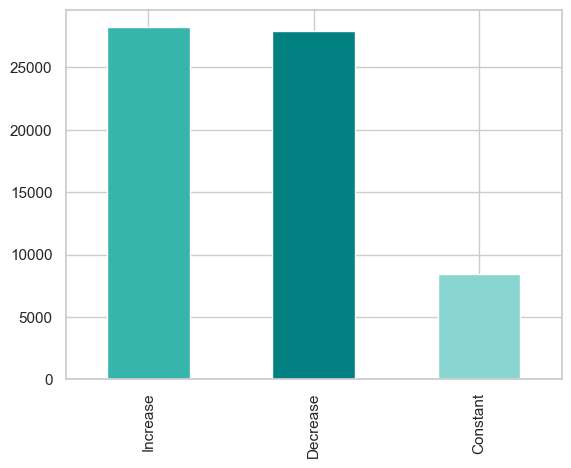

In [59]:
#Visualisaion of accident severity categories' frequencies
newstocks_df["Price Change"].value_counts().plot(kind="bar", color = custom_palette)

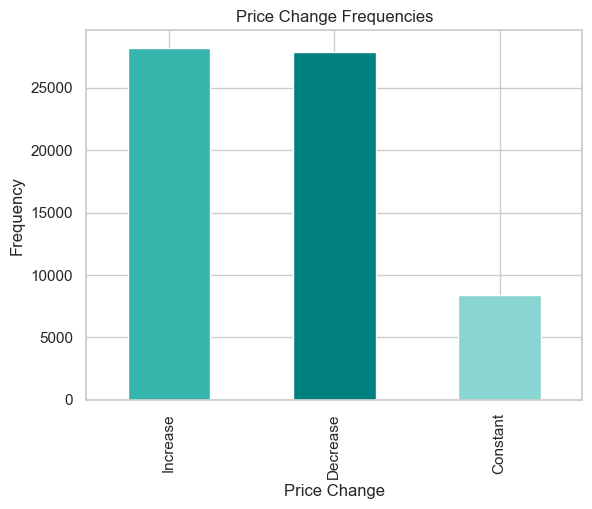

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the pastel color palette
#pastel_colors = sns.color_palette('crest')

# Visualisation of Price Change categories' frequencies
ax = newstocks_df["Price Change"].value_counts().plot(kind="bar", color= custom_palette)

# Set the plot labels
ax.set_title("Price Change Frequencies")
ax.set_xlabel("Price Change")
ax.set_ylabel("Frequency")

# Show the plot
plt.show()


In [60]:
#Importing Library for Data Cleaning and Processing
from sklearn.model_selection import train_test_split

trainset, testset = train_test_split(newstocks_df, test_size=0.2,
                                     stratify=newstocks_df["Price Change"], random_state=7)

In [61]:
#proportion of categories of accident severity variable
trainset["Price Change"].value_counts(normalize=True)

Increase    0.437277
Decrease    0.432491
Constant    0.130232
Name: Price Change, dtype: float64

In [62]:
testset["Price Change"].value_counts(normalize=True)

Increase    0.437340
Decrease    0.432458
Constant    0.130202
Name: Price Change, dtype: float64

<AxesSubplot:>

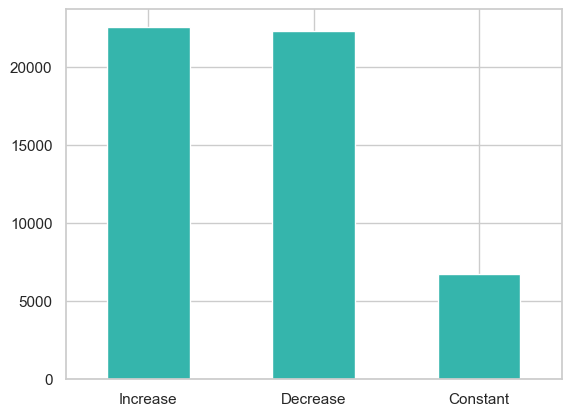

In [63]:
#Visualisaion of accident severity categories' frequencies
trainset["Price Change"].value_counts().plot(kind="bar", rot=0)

<AxesSubplot:>

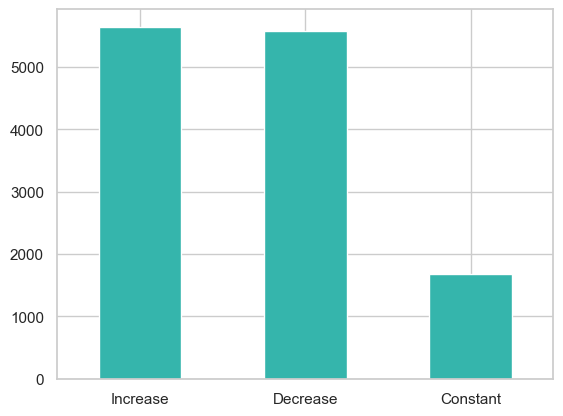

In [64]:
#Visualisaion of accident severity categories' frequencies
testset["Price Change"].value_counts().plot(kind="bar", rot=0)

In [65]:
cat_cols=newstocks_df.select_dtypes(include=['object']).columns
num_cols = newstocks_df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['Price Change', 'Ticker', 'Market Capitalization', 'Industry', 'Sector',
       'IsCovidYear', 'Month', 'Day of Week'],
      dtype='object')
Numerical Variables:
['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)

#### Price

In [ ]:
import seaborn as sns

# Define the six colors as a list of RGB values
verdigris = (53/255, 181/255, 172/255)
teal = (0/255, 128/255, 128/255)
middle_blue_green = (137/255, 213/255, 210/255)
pale_blue = (187/255, 241/255, 241/255)
rosy_brown = (192/255, 149/255, 145/255)
Green =(194/255, 218/255, 206/255)
crane = (229/255, 222/255, 210/255)
hibiscus = (231/255, 185/255, 180/255)

# Create a color palette using the six colors
custom_palette = sns.color_palette([verdigris, teal, middle_blue_green, pale_blue,Green, crane, hibiscus, rosy_brown, deep_puce])

# Set the color palette as the default for all visualizations
sns.set_palette(custom_palette)


In [29]:
import seaborn as sns
import matplotlib.colors as mcolors

# Define the color codes
color_codes = ['#142459', '#176BA0', '#19AADE', '#1AC9E6', '#1BE4BD', '#6DF0D2', '#C7F9EE']

# Convert color codes to RGB values
rgb_values = [mcolors.hex2color(code) for code in color_codes]

# Define the RGB values
verdigris = (20/255, 36/255, 89/255)
teal = (23/255, 107/255, 160/255)
middle_blue_green = (25/255, 170/255, 222/255)
pale_blue = (26/255, 201/255, 230/255)
rosy_brown = (27/255, 228/255, 189/255)
deep_puce = (109/255, 240/255, 210/255)

# Combine the RGB values and converted RGB values
custom_palette = sns.color_palette([verdigris, teal, middle_blue_green, pale_blue, rosy_brown, deep_puce] + rgb_values)

# Set the color palette as the default for all visualizations
sns.set_palette(custom_palette)


In [22]:
import seaborn as sns

# Define the nine colors as a list of RGB values
teal = (0/255, 128/255, 128/255)
verdigris = (53/255, 181/255, 172/255)
middle_blue_green = (137/255, 213/255, 210/255)
pale_blue = (187/255, 241/255, 241/255)
rosy_brown = (192/255, 149/255, 145/255)
deep_puce = (168/255, 101/255, 97/255)
deep_carmine_pink = (203/255, 65/255, 84/255)
dark_cyan = (18/255, 148/255, 144/255)
navy_blue = (0/255, 0/255, 128/255)
dark_blue = (19/255, 53/255, 105/255)

# Create a color palette using the ten colors
custom_palette_bar = sns.color_palette([navy_blue, dark_blue, teal, verdigris, middle_blue_green, pale_blue, rosy_brown, deep_puce, deep_carmine_pink, dark_cyan])
custom_palette_single = sns.color_palette([verdigris])

# Set the color palette as the default for all visualizations  
sns.set_palette(custom_palette_bar)



## 3.1 Univariate Visualization - Dependent Variable 
### 3.1.1 Volume

Close
Skew : 7.2


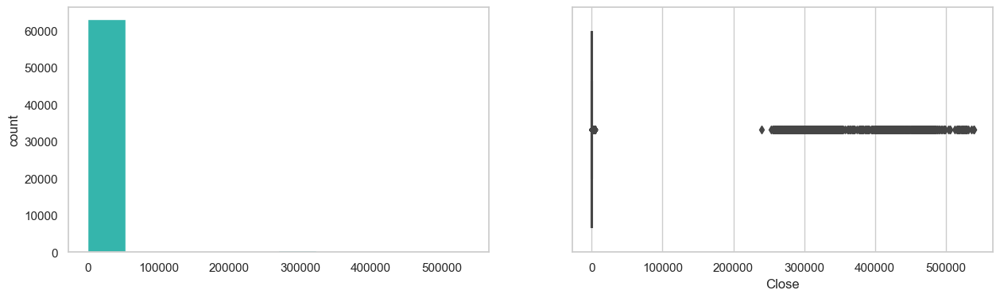

Previous Day Price
Skew : 7.2


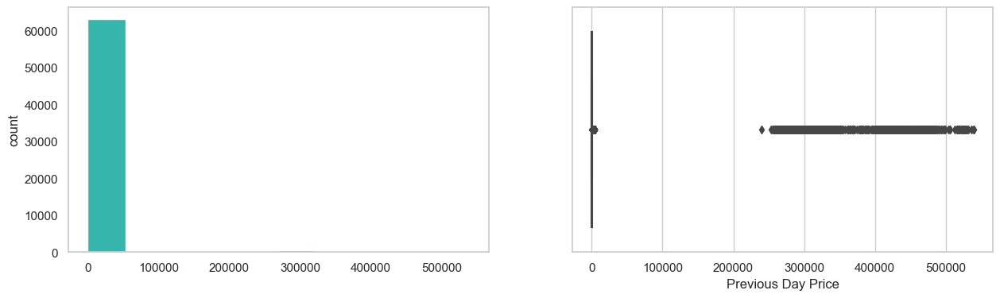

Volume
Skew : 10.28


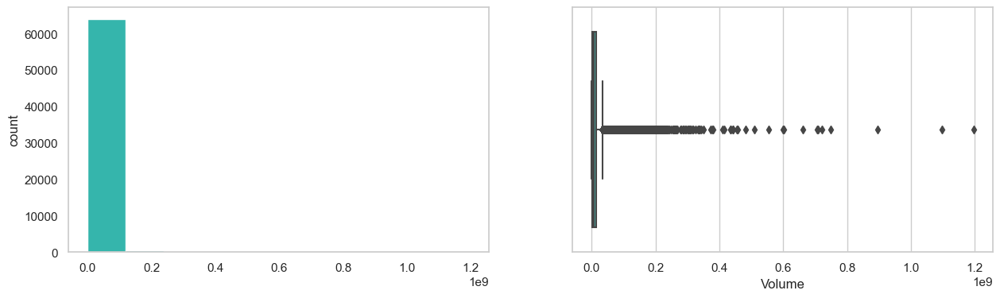

netReceivables
Skew : 4.76


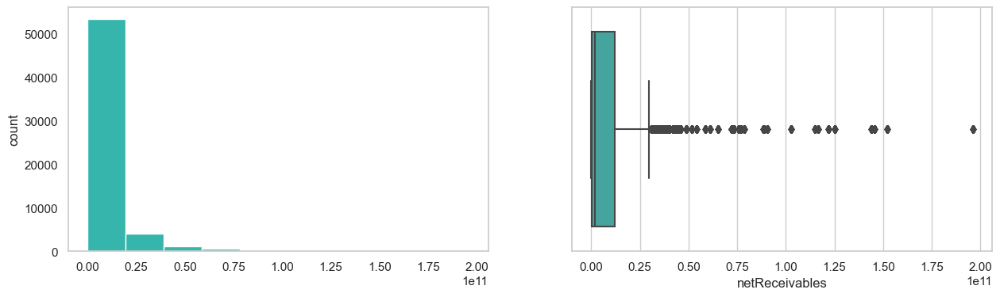

inventory
Skew : 4.42


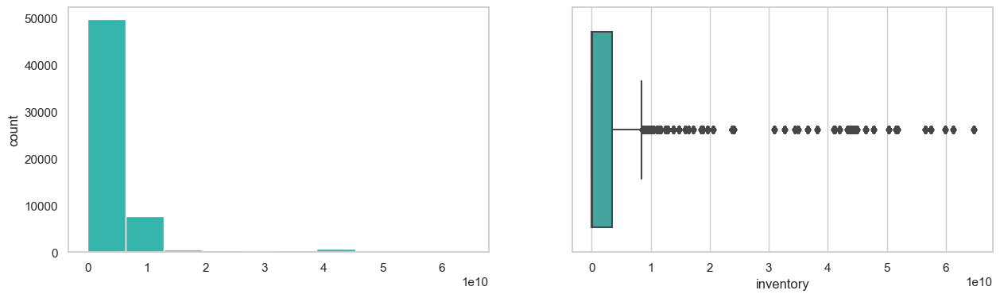

propertyPlantEquipmentNet
Skew : 3.48


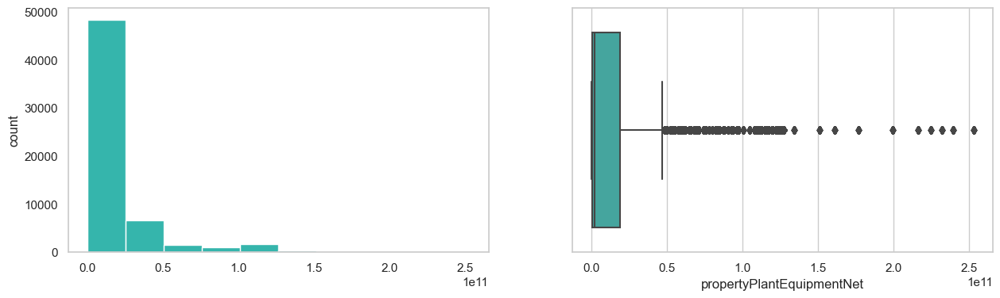

totalCurrentAssets
Skew : 2.08


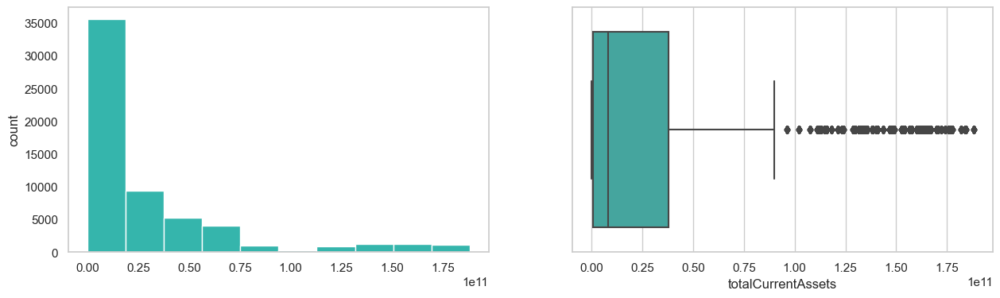

totalLiabilities
Skew : 6.75


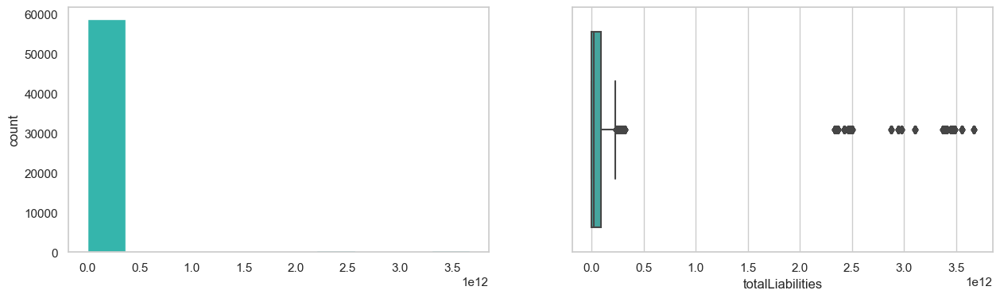

totalEquity
Skew : 2.29


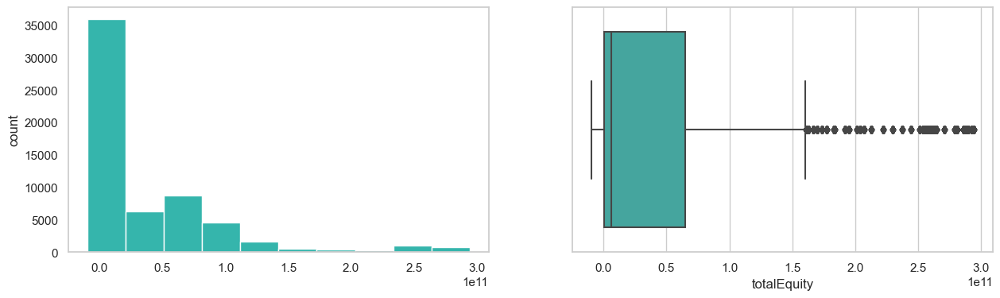

totalDebt
Skew : 4.63


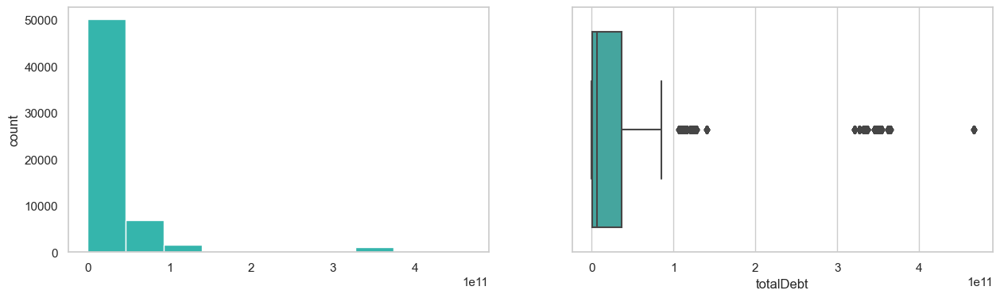

totalCurrentLiabilities
Skew : 2.11


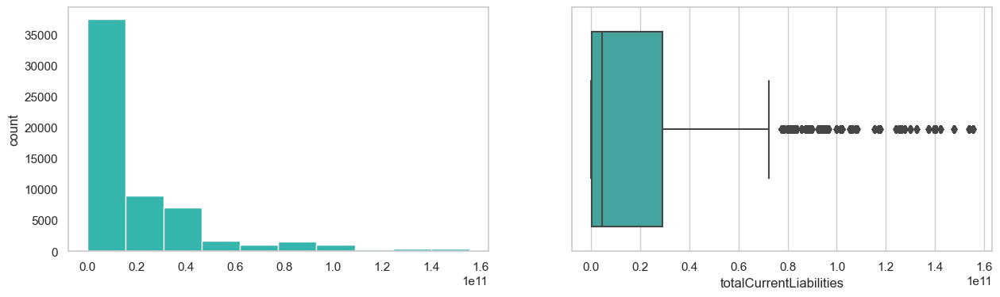

revenue
Skew : 3.15


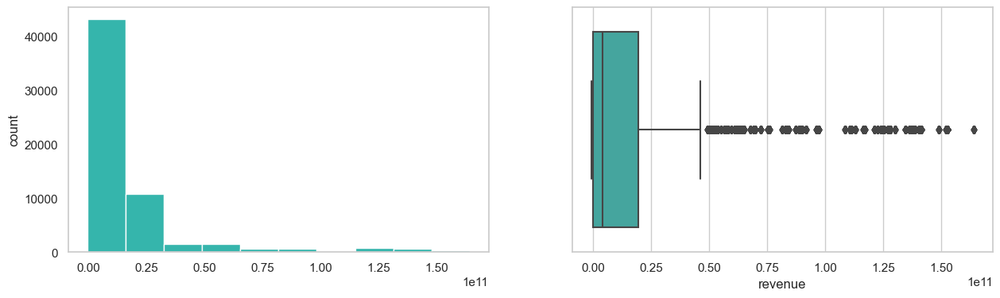

grossProfit
Skew : 1.95


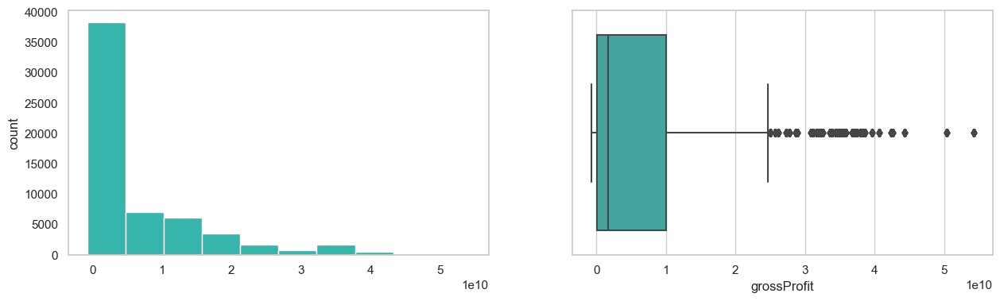

operatingExpenses
Skew : 2.41


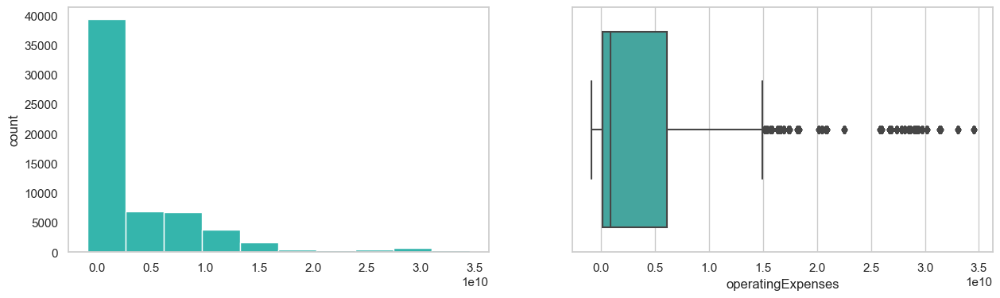

ebitda
Skew : 2.44


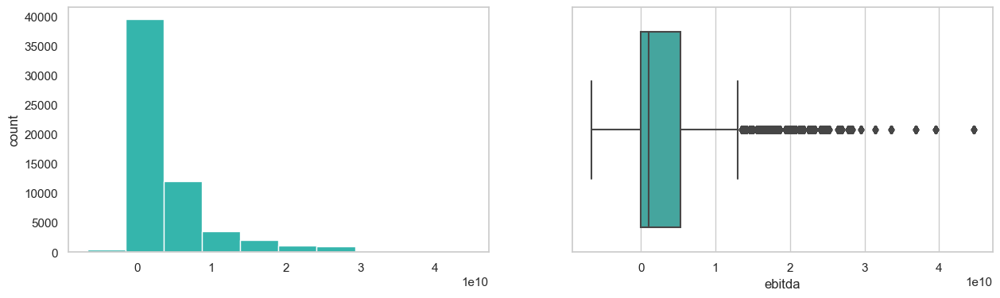

operatingIncome
Skew : 3.3


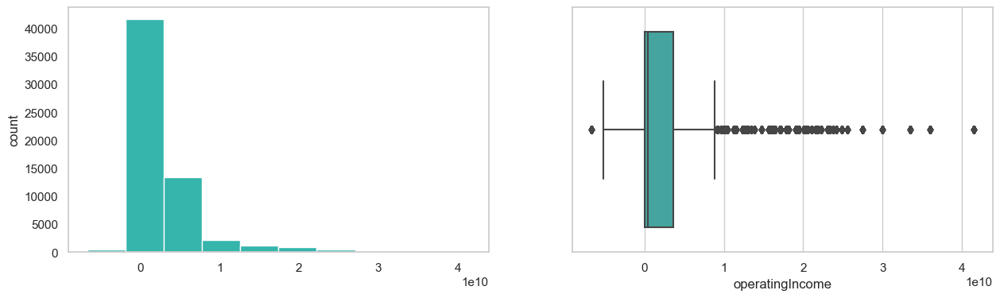

netIncome
Skew : 2.88


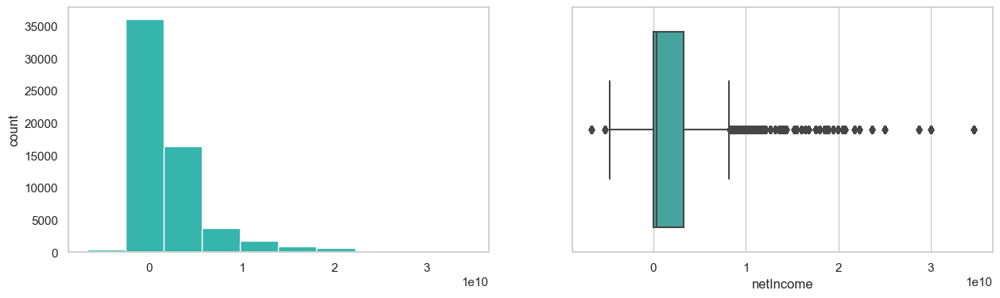

eps
Skew : -10.45


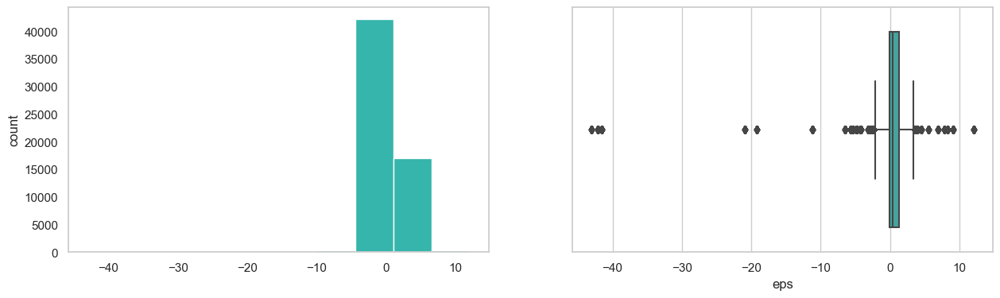

accountsReceivables
Skew : -2.9


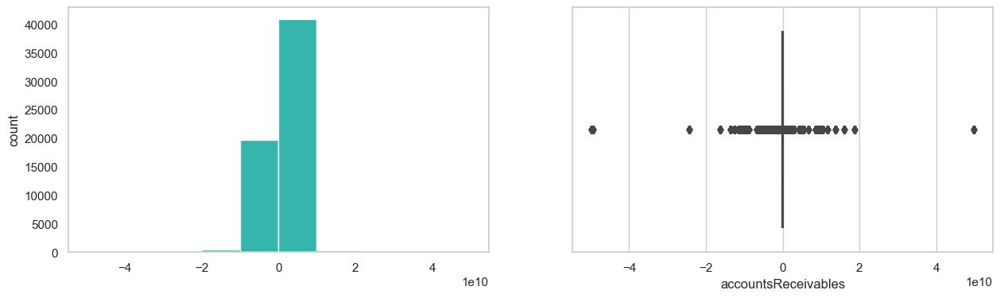

accountsPayables
Skew : 5.74


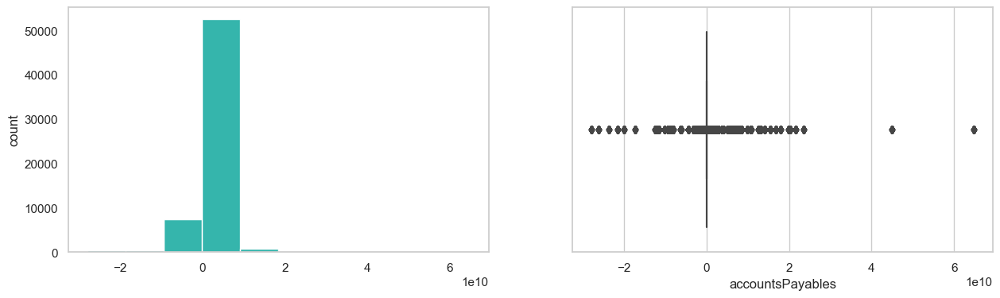

dividendsPaid
Skew : -1.5


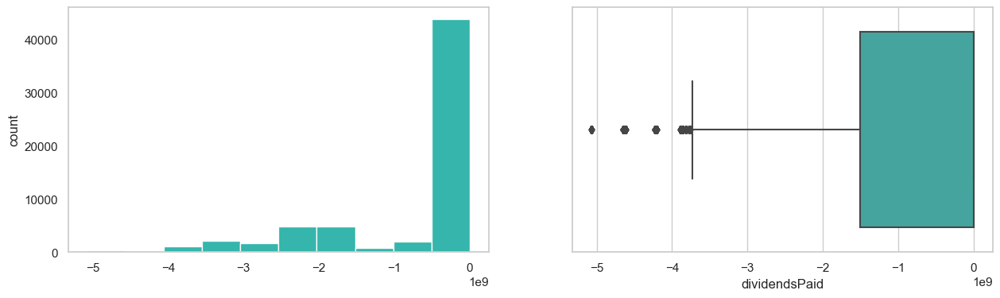

operatingCashFlow
Skew : 0.55


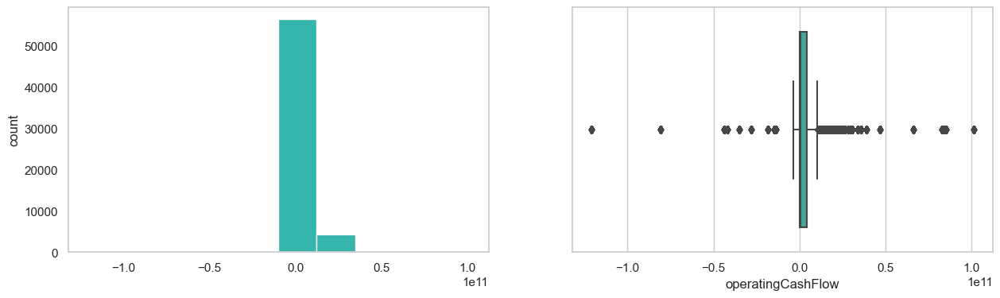

capitalExpenditure
Skew : -4.23


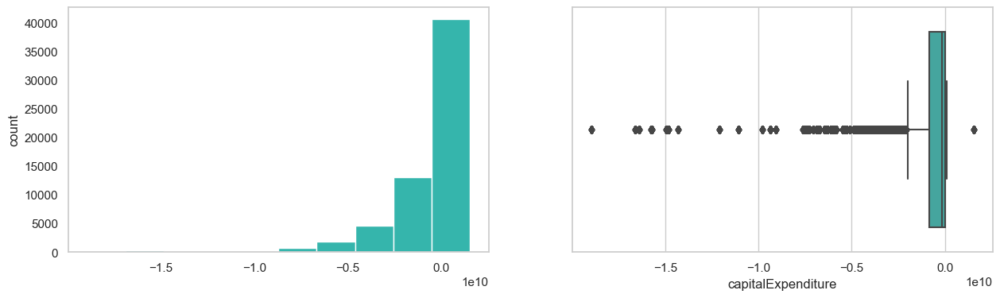

numberOfShares
Skew : 2.51


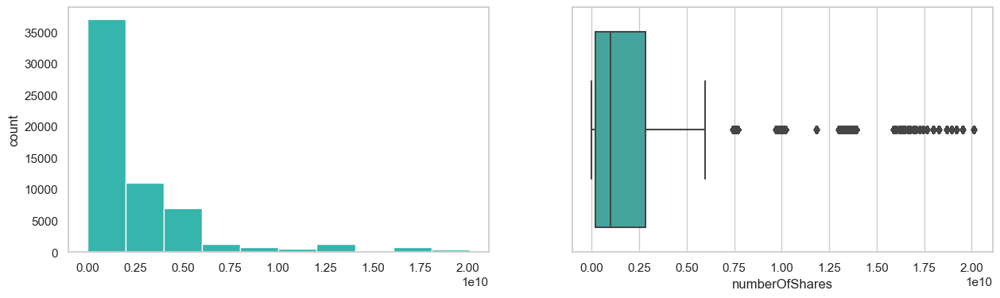

marketCapitalization
Skew : 3.07


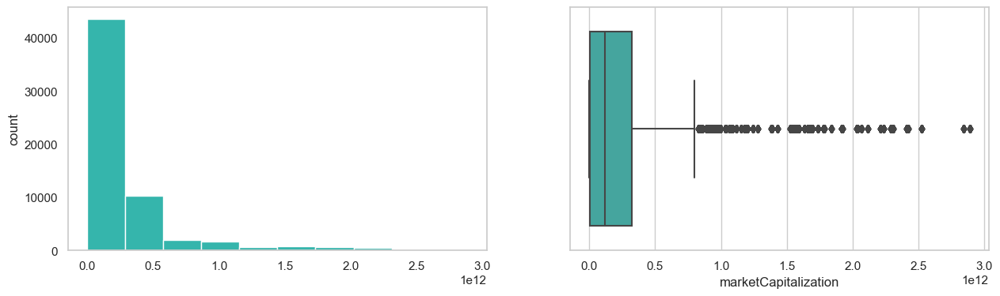

addTotalDebt
Skew : 4.63


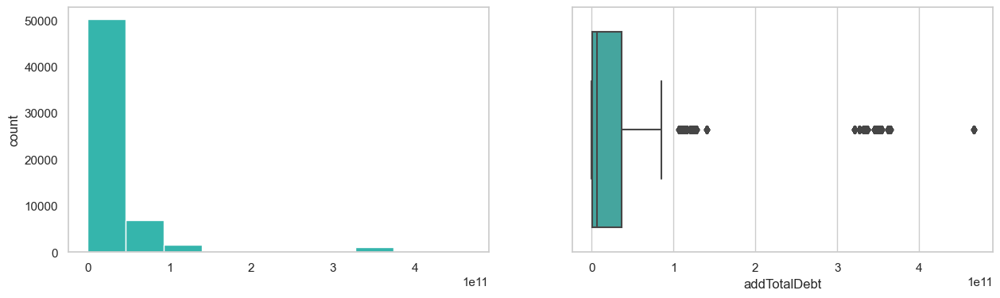

enterpriseValue
Skew : 3.04


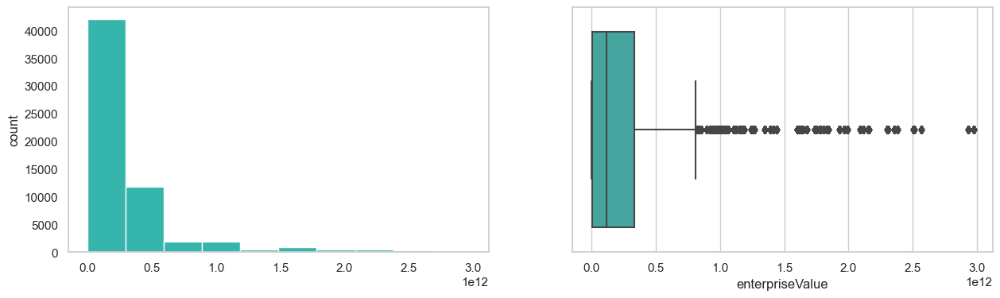

EnvironmentScore
Skew : -0.57


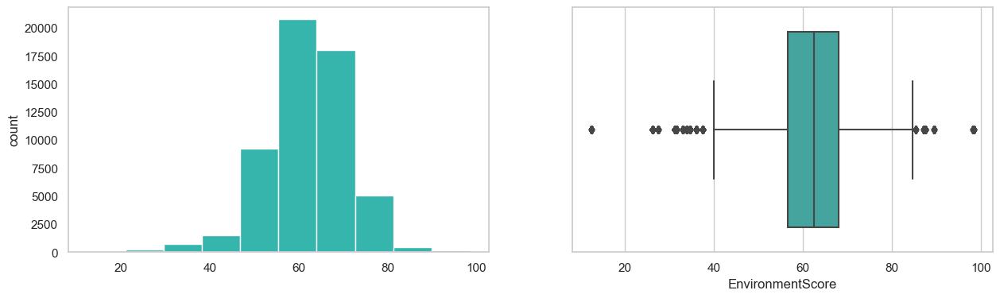

SocialScore
Skew : 0.71


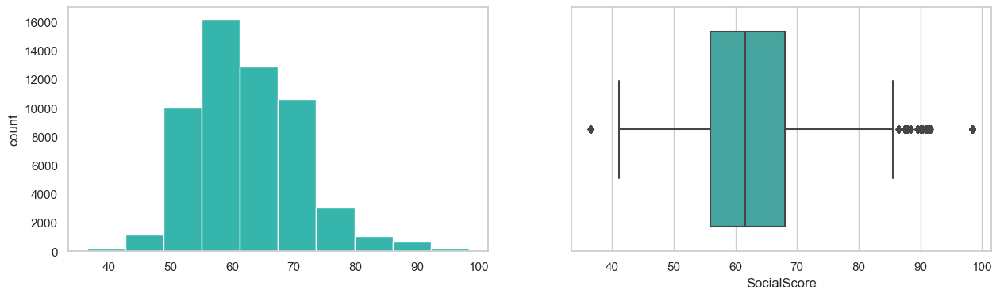

GovernanceScore
Skew : -0.07


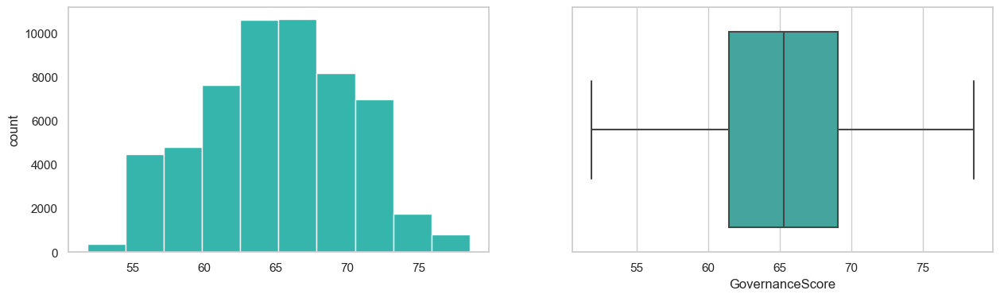

ESGscore
Skew : 0.2


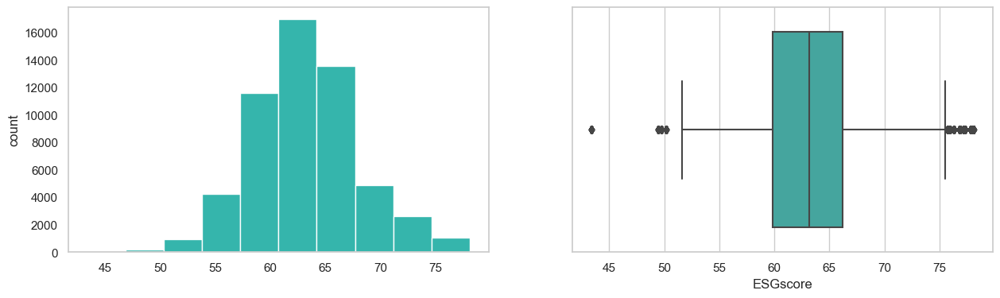

No of mentions
Skew : 17.58


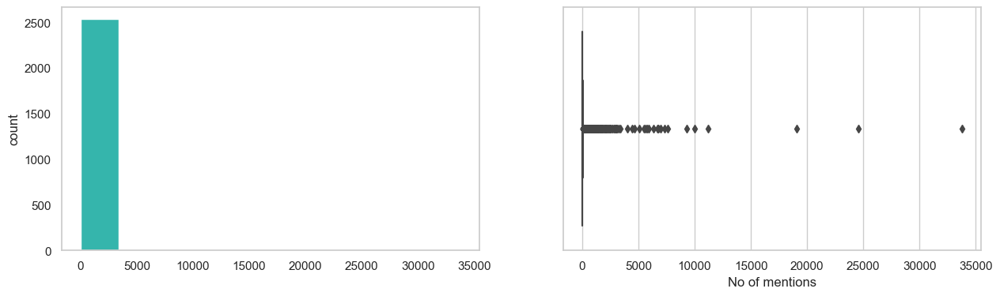

AvgPositiveScore
Skew : 0.55


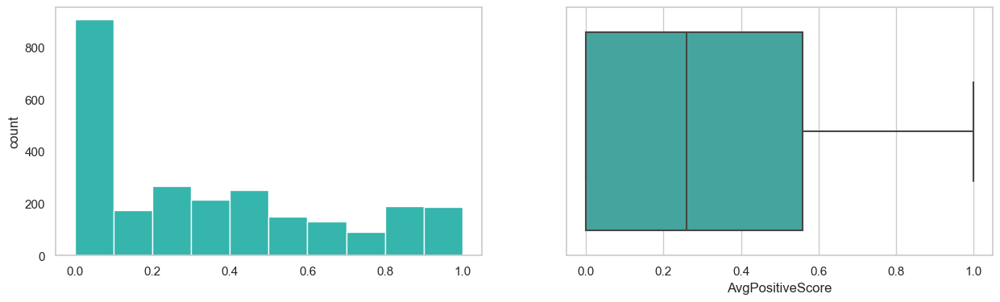

AvgNegativeScore
Skew : 0.55


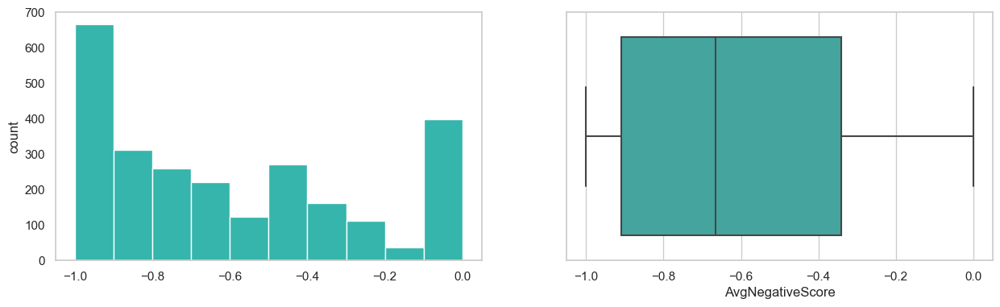

TotPositiveMentions
Skew : 12.5


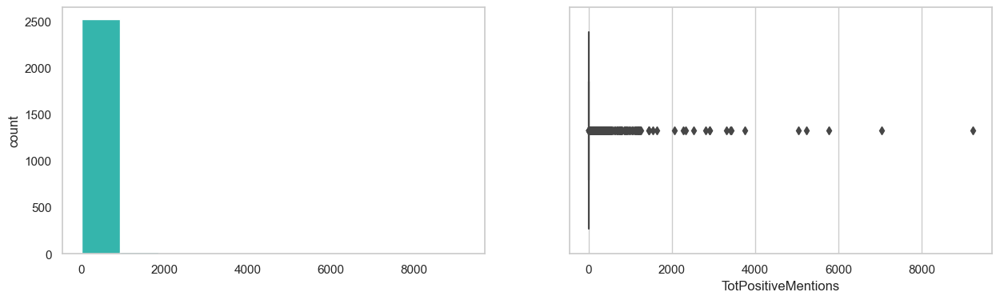

TotNegativeMentions
Skew : 23.04


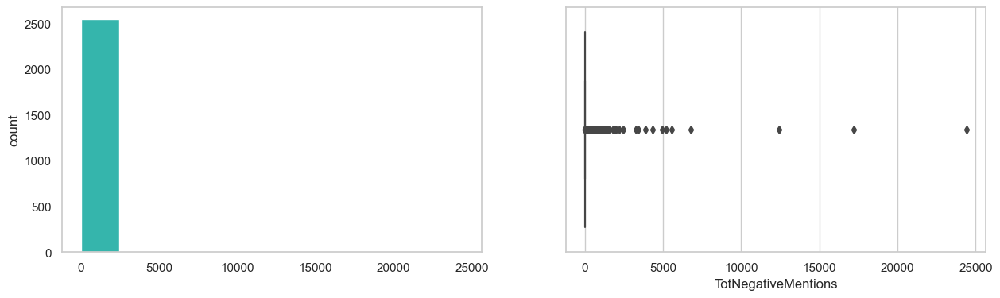

Count transaction (disposed)
Skew : 4.83


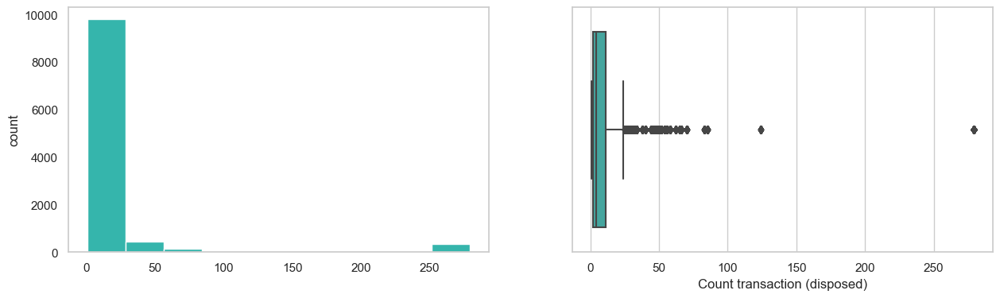

Total Amount (disposed)
Skew : 13.01


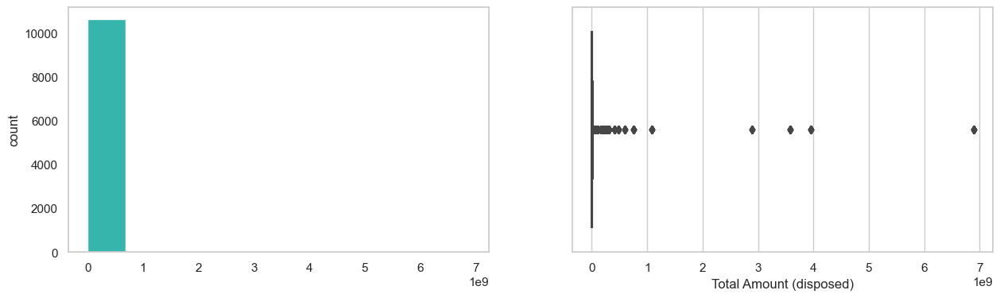

No of shares (disposed)
Skew : 7.74


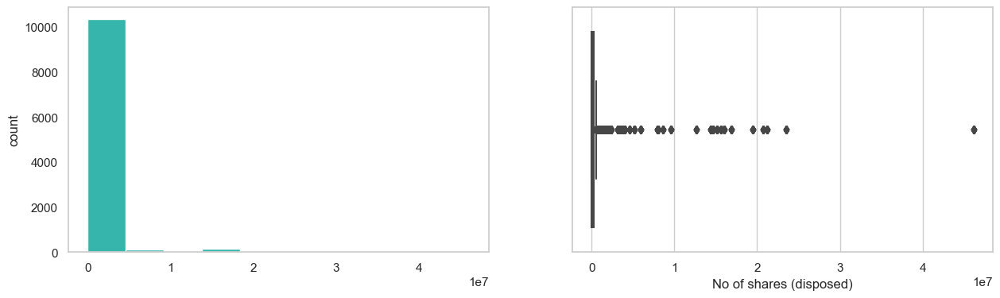

Avg Share Price (disposed) 
Skew : 2.97


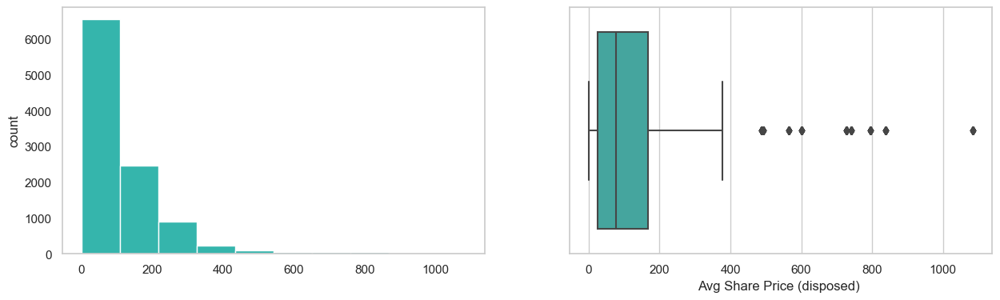

Min price (disposed)
Skew : 2.52


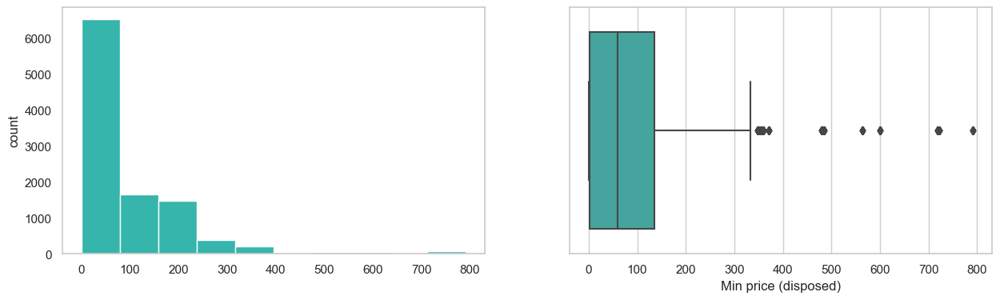

Max Price (disposed)
Skew : 5.3


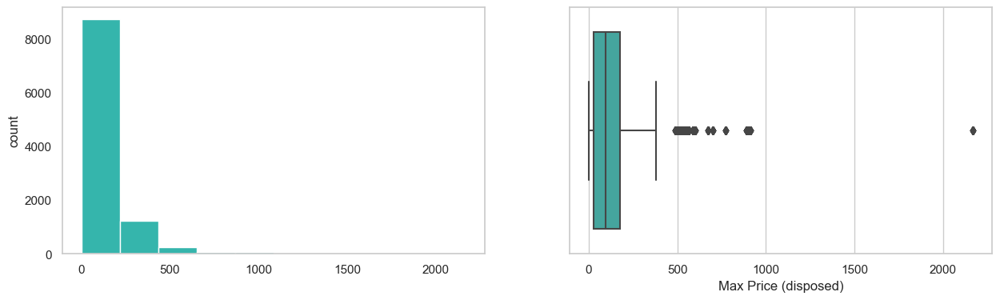

Count Acquired
Skew : 4.46


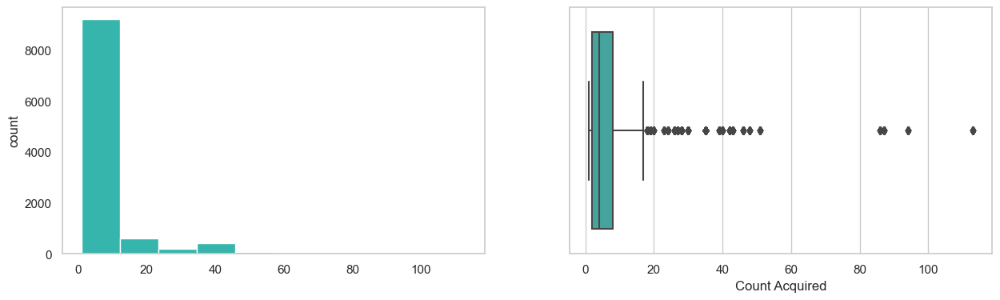

Total Amount(Acquired)
Skew : 8.09


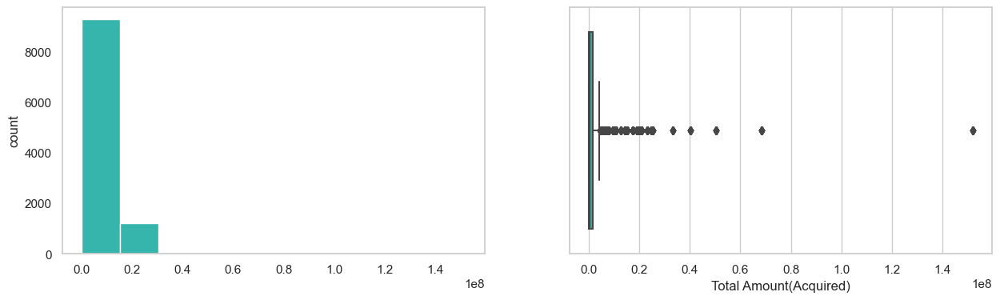

No of Shares(Acquired)
Skew : 12.32


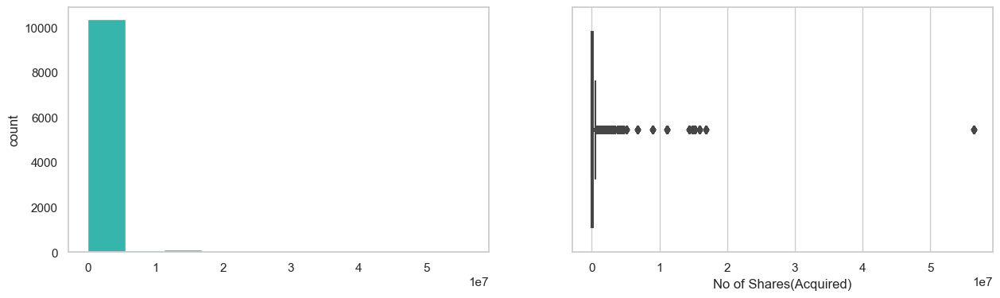

Avg Share Price (Acquired)
Skew : 21.59


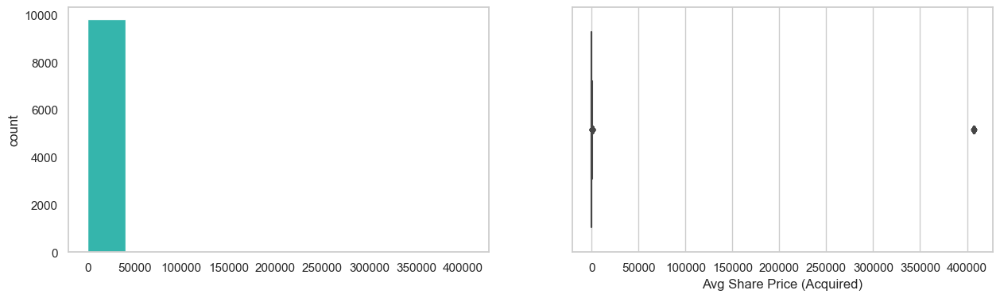

min price (Acquired)
Skew : 21.59


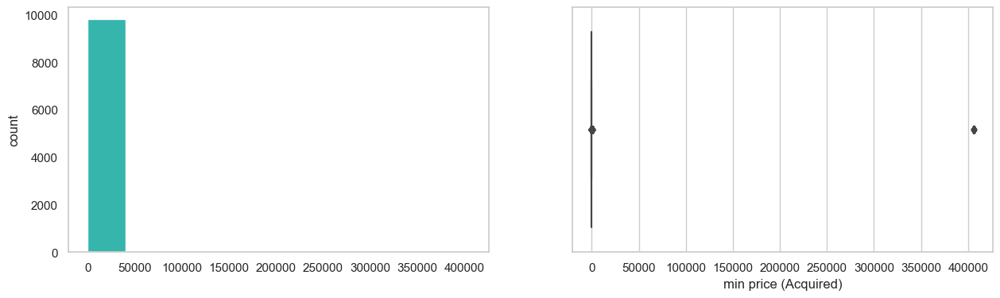

Max Price (Acquired)
Skew : 21.59


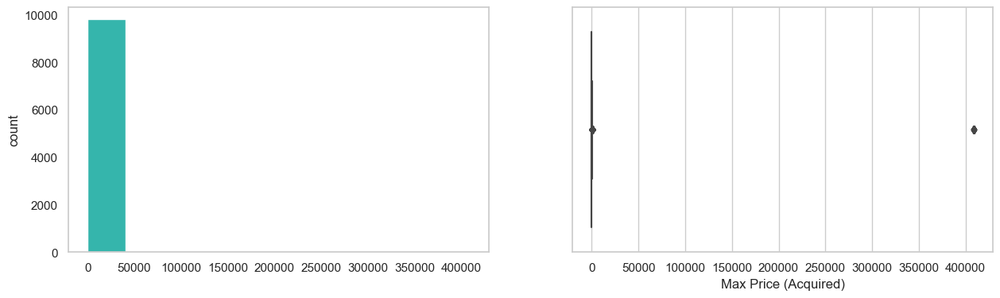

InflationRate
Skew : 0.33


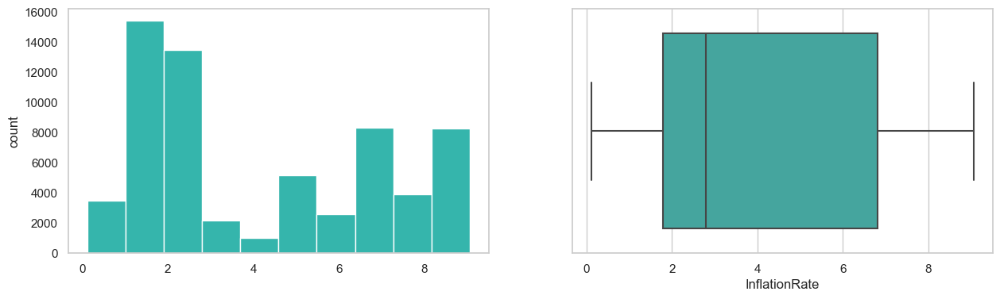

Value - T
Skew : -0.03


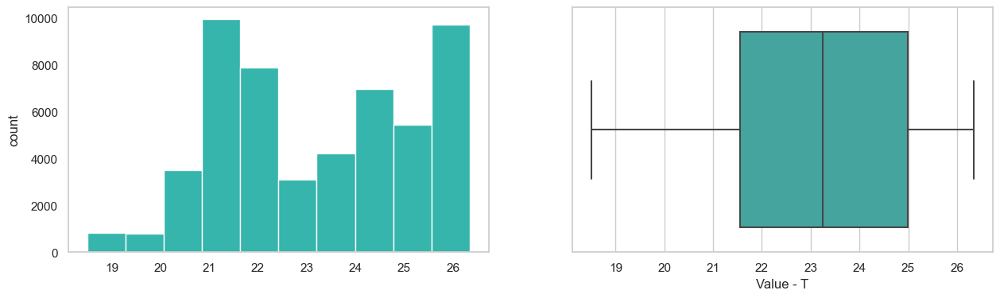

Year
Skew : -0.18


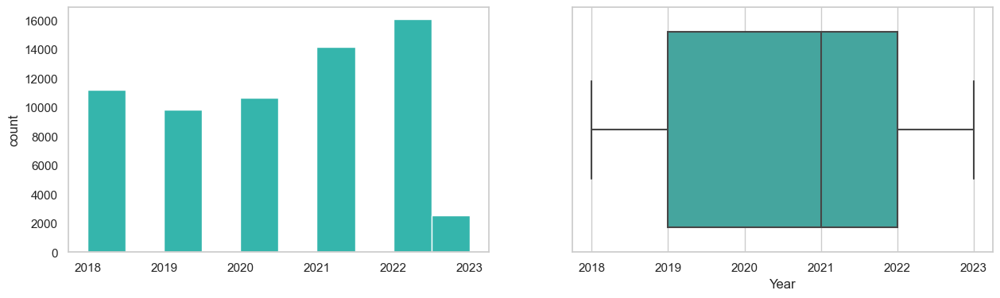

Quarter
Skew : -0.14


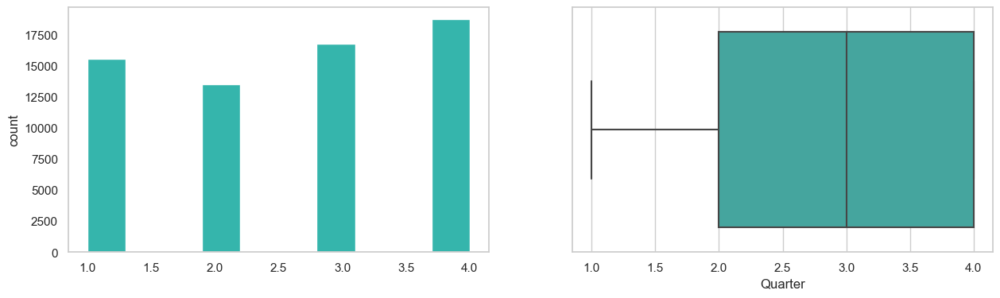

Day
Skew : 0.03


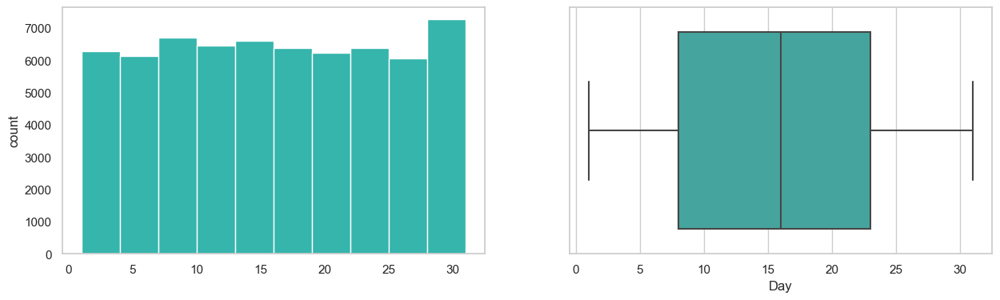

In [66]:
for col in num_cols:
    print(col)
    print('Skew :', round(newstocks_df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    newstocks_df[col].hist(grid=False, color = custom_palette_single)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=newstocks_df[col])
    plt.show()

In [ ]:
fig, axes = plt.subplots(4, 2, figsize = (40, 40))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'Price Change', data = newstocks_df,
              order = newstocks_df['Price Change'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'Ticker', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Ticker'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'Market Capitalization', data = newstocks_df,
              order = newstocks_df['Market Capitalization'].value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'Industry', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Industry'].value_counts().index);
sns.countplot(ax = axes[2, 0], x = 'Sector', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Sector'].value_counts().index);
sns.countplot(ax = axes[2, 1], x = 'IsCovidYear', data = newstocks_df,
              order = newstocks_df['IsCovidYear'].value_counts().index);
sns.countplot(ax = axes[3, 0], x = 'Month', data = newstocks_df,palette = custom_palette,
              order = newstocks_df['Month'].value_counts().index);
sns.countplot(ax = axes[3, 1], x = 'Day of Week', data = newstocks_df, 
              order = newstocks_df['Day of Week'].value_counts().index);


axes[0][1].tick_params(labelrotation=90);
axes[1][1].tick_params(labelrotation=45);
axes[2][0].tick_params(labelrotation=90);
axes[2][1].tick_params(labelrotation=90);

BIVARIATE VISUALIZATION CATEGORICAL & NUMERICAL 

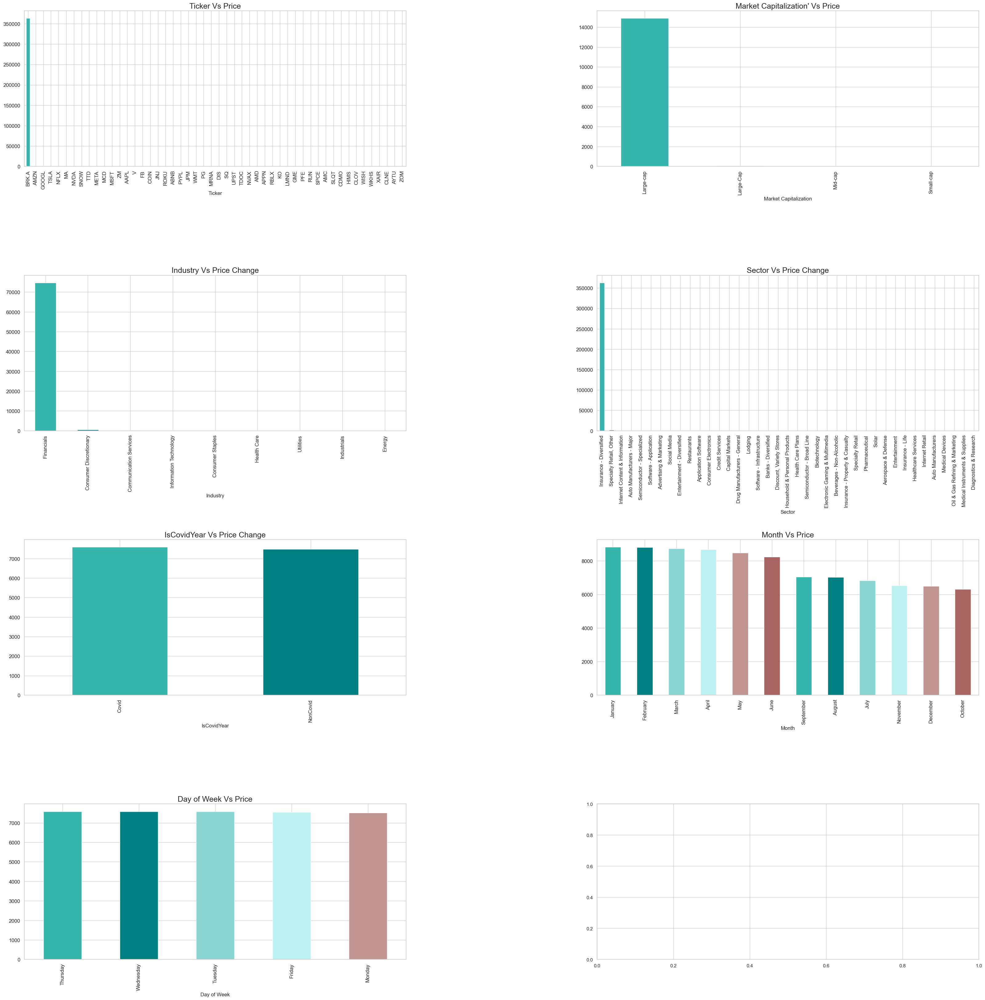

In [69]:
fig, axarr = plt.subplots(4, 2, figsize=(40, 40))
newstocks_df.groupby('Ticker')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][0], fontsize=12, color = custom_palette)
axarr[0][0].set_title("Ticker Vs Price", fontsize=18)
newstocks_df.groupby('Market Capitalization')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][1], fontsize=12, color = custom_palette)
axarr[0][1].set_title("Market Capitalization' Vs Price", fontsize=18)
newstocks_df.groupby('Industry')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][0], fontsize=12, color = custom_palette)
axarr[1][0].set_title("Industry Vs Price Change", fontsize=18)
newstocks_df.groupby('Sector')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][1], fontsize=12, color = custom_palette)
axarr[1][1].set_title("Sector Vs Price Change", fontsize=18)
newstocks_df.groupby('IsCovidYear')['Close'].mean().sort_values(ascending=False).head(10).plot.bar(ax=axarr[2][0], fontsize=12, color = custom_palette)
axarr[2][0].set_title("IsCovidYear Vs Price Change", fontsize=18)
newstocks_df.groupby('Month')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[2][1], fontsize=12, color = custom_palette )
axarr[2][1].set_title("Month Vs Price", fontsize=18)
newstocks_df.groupby('Day of Week')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[3][0], fontsize=12 , color = custom_palette)
axarr[3][0].set_title("Day of Week Vs Price", fontsize=18)

plt.subplots_adjust(hspace=0.7)
plt.subplots_adjust(wspace=0.5)
#sns.despine(palette = custom_palette)

                  



### statistical analysis for categorical variables 

In [70]:
Freq_df =(pd.DataFrame((newstocks_df[['Price Change','Ticker', 'Market Capitalization','Sector','Industry','IsCovidYear', 'Month', 'Day of Week']].describe())))

Freq_df

,Price Change,Ticker,Market Capitalization,Sector,Industry,IsCovidYear,Month,Day of Week
count,64511,64511,64511,64511,64511,64511,64511,64511
unique,3,50,4,39,9,2,12,5
top,Increase,PFE,Large-cap,Credit Services,Health Care,Covid,October,Tuesday
freq,28210,4161,32662,5810,17869,44292,6372,13283


In [71]:
#Getting the value counts of the light_conditions variable
values = pd.DataFrame(trainset.loc[:,'Day of Week'].value_counts())
values.columns = ['Day of Week']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(trainset.loc[:,'Day of Week'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Day of Week %']
values.join(percentages)

,Day of Week,Day of Week %
Tuesday,10678,20.69%
Wednesday,10517,20.38%
Thursday,10447,20.24%
Friday,10391,20.13%
Monday,9575,18.55%


In [72]:
#Getting the value counts of the price change variable
values = pd.DataFrame(trainset.loc[:,'Price Change'].value_counts())
values.columns = ['Price Change']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(trainset.loc[:,'Price Change'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Price Change %']
values.join(percentages)

,Price Change,Price Change %
Increase,22567,43.73%
Decrease,22320,43.25%
Constant,6721,13.02%


In [73]:
#Getting the value counts of the Ticker variable
values = pd.DataFrame(trainset.loc[:,'Ticker'].value_counts())
values.columns = ['Ticker']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(trainset.loc[:,'Ticker'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Ticker %']
values.join(percentages)

,Ticker,Ticker %
PFE,3355,6.5%
KO,2598,5.03%
JNJ,2516,4.88%
DIS,1782,3.45%
JPM,1078,2.09%
GME,1077,2.09%
CDMO,1073,2.08%
MCD,1072,2.08%
AMC,1067,2.07%
SQ,1065,2.06%


In [74]:
#Getting the value counts of the Sector variable
values = pd.DataFrame(trainset.loc[:,'Sector'].value_counts())
values.columns = ['Sector']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(trainset.loc[:,'Sector'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Sector %']
values.join(percentages)

,Sector,Sector %
Credit Services,4669,9.05%
Pharmaceutical,3355,6.5%
Biotechnology,2966,5.75%
Entertainment - Diversified,2831,5.49%
Beverages - Non-Alcoholic,2598,5.03%
Drug Manufacturers - General,2516,4.88%
Internet Content & Information,2129,4.13%
Software - Infrastructure,2101,4.07%
Healthcare Services,1241,2.4%
Banks - Diversified,1078,2.09%


In [75]:
#Getting the value counts of the Industry variable
values = pd.DataFrame(trainset.loc[:,'Industry'].value_counts())
values.columns = ['Industry']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(trainset.loc[:,'Industry'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Industry %']
values.join(percentages)

,Industry,Industry %
Health Care,14252,27.62%
Information Technology,9672,18.74%
Communication Services,8541,16.55%
Consumer Discretionary,6160,11.94%
Financials,5168,10.01%
Consumer Staples,4679,9.07%
Utilities,1058,2.05%
Industrials,1043,2.02%
Energy,1035,2.01%


In [76]:
#Getting the value counts of the Market Capitalization variable
values = pd.DataFrame(trainset.loc[:,'Market Capitalization'].value_counts())
values.columns = ['Market Capitalization']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(trainset.loc[:,'Market Capitalization'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Market Capitalization %']
values.join(percentages)

,Market Capitalization,Market Capitalization %
Large-cap,26053,50.48%
Small-cap,20095,38.94%
Large-Cap,4407,8.54%
Mid-cap,1053,2.04%


In [77]:
#Getting the value counts of the IsCovidYear variable
values = pd.DataFrame(trainset.loc[:,'IsCovidYear'].value_counts())
values.columns = ['IsCovidYear']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(trainset.loc[:,'IsCovidYear'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['IsCovidYear %']
values.join(percentages)

,IsCovidYear,IsCovidYear %
Covid,35394,68.58%
NonCovid,16214,31.42%


In [78]:
#Getting the value counts of the Month variable
values = pd.DataFrame(trainset.loc[:,'Month'].value_counts())
values.columns = ['Month']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(trainset.loc[:,'Month'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Month %']
values.join(percentages)

,Month,Month %
October,5104,9.89%
December,5012,9.71%
November,4856,9.41%
August,4685,9.08%
July,4404,8.53%
September,4283,8.3%
March,4204,8.15%
January,4203,8.14%
February,4014,7.78%
June,3684,7.14%


### Feature selection for categorical using CHISQUARE TO CHECK ASSOCIATIOn

In [80]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(trainset['Price Change'], trainset['Industry'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


In [81]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(trainset['Price Change'], trainset['Sector'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


In [82]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(trainset['Price Change'], trainset['IsCovidYear'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 1.5606916502539764e-15


In [83]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(trainset['Price Change'], trainset['Day of Week'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.09737751402259569


In [84]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(trainset['Price Change'], trainset['Market Capitalization'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


### Statistical Analysis for Numerical Variables

In [85]:
newstocks_df.describe()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,...,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
count,64511.000000,64511.000000,6.451100e+04,6.006300e+04,6.006300e+04,6.006300e+04,6.006300e+04,6.006300e+04,6.006300e+04,6.006300e+04,...,1.059700e+04,1.059700e+04,9852.000000,9852.000000,9852.000000,63874.000000,52498.000000,64511.000000,64511.000000,64511.000000
mean,7562.917507,7562.915104,1.358810e+07,8.706708e+09,3.421197e+09,1.659984e+10,2.769208e+10,1.069321e+11,3.702732e+10,2.673685e+10,...,3.618551e+06,6.696320e+05,900.495090,888.943780,913.491086,4.206389,23.249750,2020.336346,2.598844,15.671374
std,52195.145771,52195.146115,2.457487e+07,1.795265e+10,8.320384e+09,3.165480e+10,4.138861e+10,4.261764e+11,5.747579e+10,5.438080e+10,...,9.580114e+06,3.070688e+06,18768.487739,18715.155977,18839.510737,2.730111,2.029616,1.519317,1.141836,8.752785
min,0.067000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.226844e+06,-9.463100e+09,0.000000e+00,...,0.000000e+00,2.000000e+01,0.000000,0.000000,0.000000,0.120000,18.510000,2018.000000,1.000000,1.000000
25%,25.350000,25.340000,2.448391e+06,9.900000e+07,0.000000e+00,1.264060e+08,5.659000e+08,7.589830e+08,5.610870e+08,1.836060e+08,...,0.000000e+00,1.279100e+04,0.018975,0.000000,0.075900,1.790000,21.550000,2019.000000,2.000000,8.000000
50%,91.050000,91.050000,6.692690e+06,1.962000e+09,4.340000e+07,1.902000e+09,8.098015e+09,1.719200e+10,6.356000e+09,6.542373e+09,...,2.237560e+05,9.765900e+04,9.867500,1.375000,19.100000,2.800000,23.240000,2021.000000,3.000000,16.000000
75%,178.740000,178.740000,1.523158e+07,1.208800e+10,3.414000e+09,1.876600e+10,3.774800e+10,9.247600e+10,6.462600e+10,3.629200e+10,...,1.776001e+06,2.480000e+05,62.290000,37.610000,76.167500,6.810000,24.990000,2022.000000,4.000000,23.000000
max,539180.000000,539180.000000,1.196005e+09,1.960690e+11,6.470600e+10,2.528380e+11,1.881430e+11,3.668788e+12,2.941270e+11,4.667270e+11,...,1.520000e+08,5.640000e+07,406965.184093,405800.000000,408514.010000,9.060000,26.340000,2023.000000,4.000000,31.000000


In [86]:
result = newstocks_df[newstocks_df['Close'] == 0.067]
result

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,...,Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
63796,0.067,0.07,Decrease,14251951,ZOM,Small-cap,Health Care,Diagnostics & Research,0.0,0.0,...,NaN,1.18,21.59,Covid,2020-11-02,2020,4,November,2,Monday


### Treating Missing Values with Imputation

#### Insights from this for numerical variable  - Take screenshot 


KNN was used because it is the most appropriate algorithm for this type of imputation. for fundamentals, picking the nearest neighbor for missing data would work better than using its mean or median or just deleting the figures. 

We must need business knowledge or common insights about the data. Due to domain knowledge we went for KNN Imputations. 

- Price information is right as the lowest is 0.06 for 'Ticker' and highest price is 'ticker' which traded at 539,180 at the said date.

- Fundamental information had missing values and KNN imputation was used to impute this records. 

- For ESG data, based on domain knowledge, KNN was better for this imputation than using median, or mean because it gives the performance per period so the missing details would be closer to their nearest neighbors.

- For Sentiments data, which had the highest number of missing information; having just 2 years data, 2021 and 2022; this dataset would be removed from the analysis and another analysis would be done to narrow on just those two years. Imputation would not be the best line of action due to high volatility of news. 

- For insider trading information, KNN was used to impute this. 





### We have broken the samples into the below datasets

All Imputed Data 

df_imputed - imputed all, did not treat outliers, log transform, scaled, dummies

Imputed Data - without tweet data - df_impute_drop

Imputed Data - leaving some data as 0  - df_imputed_some


2 years Data - df_sentiments


Fundamental Only - df_fundamentals


df_numerical_imputed_trainset - Imputed both missing values and outliers, log transformation and scaled.



#### write comments about this table 

### Imputation of missing values with KNN

In [87]:
#Code for imputing all

import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

# create sample dataframe with missing values and categorical columns
df = pd.DataFrame(newstocks_df)

# select only the numerical columns
df_numerical = df.select_dtypes(include=np.number)

# replace zeros with NaN
df_numerical = df_numerical.replace(0, np.nan)

# instantiate KNN imputer with k=3
imputer = KNNImputer(n_neighbors=3)

# impute missing and zero values in the numerical columns
df_numerical_imputed = pd.DataFrame(imputer.fit_transform(df_numerical), columns=df_numerical.columns)

# replace NaN back to zeros
df_numerical_imputed = df_numerical_imputed.replace(np.nan, 0)

# combine the imputed numerical columns with the original categorical columns
df_imputed = pd.concat([df.select_dtypes(exclude=np.number), df_numerical_imputed], axis=1)

# display the resulting dataframe
print(df_imputed)


      Price Change Ticker Market Capitalization                Industry  \
0         Decrease   AAPL             Large-cap  Information Technology   
1         Increase   AAPL             Large-cap  Information Technology   
2         Increase   AAPL             Large-cap  Information Technology   
3         Increase   AAPL             Large-cap  Information Technology   
4         Increase   AAPL             Large-cap  Information Technology   
...            ...    ...                   ...                     ...   
64506     Increase    ZOM             Small-cap             Health Care   
64507     Increase    ZOM             Small-cap             Health Care   
64508     Decrease    ZOM             Small-cap             Health Care   
64509     Decrease    ZOM             Small-cap             Health Care   
64510     Constant    ZOM             Small-cap             Health Care   

                       Sector IsCovidYear       Date    Month Day of Week  \
0        Consumer Elec

In [88]:
#All the Nulls have been treated as seen below, none of the categorical variables were null
df_imputed.isnull().sum()

Price Change             0
Ticker                   0
Market Capitalization    0
Industry                 0
Sector                   0
                        ..
InflationRate            0
Value - T                0
Year                     0
Quarter                  0
Day                      0
Length: 62, dtype: int64

### Rerun Analysis 

In [89]:
df_imputed.describe()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,...,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
count,64511.000000,64511.000000,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,...,6.451100e+04,6.451100e+04,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000
mean,7562.917507,7562.915257,1.360951e+07,9.693370e+09,4.076660e+09,1.812470e+10,3.136110e+10,1.259974e+11,3.921187e+10,2.919060e+10,...,5.319462e+06,6.920754e+05,177.721835,177.830703,192.962751,4.200799,22.985653,2020.336346,2.598844,15.671374
std,52195.145771,52195.146093,2.459511e+07,1.920077e+10,8.514235e+09,3.462326e+10,4.475626e+10,4.669607e+11,6.013789e+10,5.824818e+10,...,8.437915e+06,1.792796e+06,7513.788245,7492.237688,7542.166282,2.724230,1.951360,1.519317,1.141836,8.752785
min,0.067000,0.067000,1.000000e+00,3.774200e+04,3.096580e+05,1.870000e+05,1.227470e+05,-1.226844e+06,-9.463100e+09,3.300000e+04,...,1.250000e+02,2.000000e+01,0.018975,0.110000,0.075900,0.120000,18.510000,2018.000000,1.000000,1.000000
25%,25.350000,25.340000,2.460154e+06,1.216300e+08,3.130200e+07,1.071560e+08,7.883530e+08,6.179010e+08,6.125170e+08,2.438670e+08,...,5.052990e+05,6.073333e+04,6.907778,16.515000,18.280000,1.790000,21.550000,2019.000000,2.000000,8.000000
50%,91.050000,91.050000,6.700469e+06,2.229000e+09,1.015000e+09,1.907000e+09,1.062900e+10,1.721300e+10,6.361000e+09,7.210000e+09,...,1.592591e+06,1.799160e+05,23.508271,28.760000,34.995000,2.800000,22.030000,2021.000000,3.000000,16.000000
75%,178.740000,178.740000,1.524190e+07,1.351600e+10,4.454000e+09,1.984500e+10,4.543800e+10,9.520200e+10,6.917800e+10,3.840800e+10,...,5.786113e+06,5.313240e+05,38.410000,41.810000,57.159167,6.810000,24.730000,2022.000000,4.000000,23.000000
max,539180.000000,539180.000000,1.196005e+09,1.960690e+11,6.470600e+10,2.528380e+11,1.881430e+11,3.668788e+12,2.941270e+11,4.667270e+11,...,1.520000e+08,5.640000e+07,406965.184093,405800.000000,408514.010000,9.060000,26.340000,2023.000000,4.000000,31.000000


In [126]:
result = df_imputed[df_imputed['netReceivables'] == 0]
result

,Price Change,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
3244,Decrease,AMD,Mid-cap,Information Technology,Semiconductor - Broad Line,Covid,2022-12-30,December,Friday,64.7700,64.8200,37126975.0,0.0,33804000.0,49183000.0,1.010160e+09,617901000.0,650575000.0,414563000.0,156874000.0,357000.0,357000.0,110077000.0,-104626000.0,0.0,-110721000.0,-0.43000,210000000.0,120000000.0,0.0,567000000.0,-124000000.0,258589270.0,1.556707e+09,414563000.0,1.641413e+09,68.04,61.68,68.82,66.18,1702.000000,0.749880,-0.820180,860.0,591.000000,6.000000,1.613074e+07,313961.000000,48.643333,0.000000,74.980000,1.000000,1.543095e+06,528457.000000,2.920000,2.920000,2.920000,6.45,26.09,2022.0,4.0,30.0
3245,Increase,AMD,Mid-cap,Information Technology,Semiconductor - Broad Line,Covid,2022-12-29,December,Thursday,64.8200,62.5700,41428481.0,0.0,33804000.0,49183000.0,1.010160e+09,617901000.0,650575000.0,414563000.0,156874000.0,357000.0,357000.0,110077000.0,-104626000.0,0.0,-110721000.0,-0.43000,210000000.0,120000000.0,0.0,567000000.0,-124000000.0,258589270.0,1.556707e+09,414563000.0,1.641413e+09,68.04,61.68,68.82,66.18,1654.000000,0.709254,-0.893395,771.0,615.000000,6.000000,1.613074e+07,313961.000000,48.643333,0.000000,74.980000,1.000000,1.543095e+06,528457.000000,2.920000,2.920000,2.920000,6.45,26.09,2022.0,4.0,29.0
3246,Decrease,AMD,Mid-cap,Information Technology,Semiconductor - Broad Line,Covid,2022-12-28,December,Wednesday,62.5700,63.2700,39526483.0,0.0,33804000.0,49183000.0,1.010160e+09,617901000.0,650575000.0,414563000.0,156874000.0,357000.0,357000.0,110077000.0,-104626000.0,0.0,-110721000.0,-0.43000,210000000.0,120000000.0,0.0,567000000.0,-124000000.0,258589270.0,1.556707e+09,414563000.0,1.641413e+09,68.04,61.68,68.82,66.18,2374.000000,0.592280,-0.929695,1158.0,927.000000,6.000000,1.613074e+07,313961.000000,48.643333,0.000000,74.980000,1.000000,1.543095e+06,528457.000000,2.920000,2.920000,2.920000,6.45,26.09,2022.0,4.0,28.0
3247,Decrease,AMD,Mid-cap,Information Technology,Semiconductor - Broad Line,Covid,2022-12-27,December,Tuesday,63.2700,64.5200,36085981.0,0.0,33804000.0,49183000.0,1.010160e+09,617901000.0,650575000.0,414563000.0,156874000.0,357000.0,357000.0,110077000.0,-104626000.0,0.0,-110721000.0,-0.43000,210000000.0,120000000.0,0.0,567000000.0,-124000000.0,258589270.0,1.556707e+09,414563000.0,1.641413e+09,68.04,61.68,68.82,66.18,1743.000000,0.724862,-0.918695,849.0,689.000000,6.000000,1.613074e+07,313961.000000,48.643333,0.000000,74.980000,1.000000,1.543095e+06,528457.000000,2.920000,2.920000,2.920000,6.45,26.09,2022.0,4.0,27.0
3248,Increase,AMD,Mid-cap,Information Technology,Semiconductor - Broad Line,Covid,2022-12-23,December,Friday,64.5200,63.8600,45923000.0,0.0,33804000.0,49183000.0,1.010160e+09,617901000.0,650575000.0,414563000.0,156874000.0,357000.0,357000.0,110077000.0,-104626000.0,0.0,-110721000.0,-0.43000,210000000.0,120000000.0,0.0,567000000.0,-124000000.0,258589270.0,1.556707e+09,414563000.0,1.641413e+09,68.04,61.68,68.82,66.18,18.000000,0.086319,-0.885321,1.0,16.000000,6.000000,1.613074e+07,313961.000000,48.643333,0.000000,74.980000,1.000000,1.543095e+06,528457.00

In [ ]:
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

# create sample dataframe with missing values and categorical columns
df = pd.DataFrame(newstocks_df)

# select specific numerical columns
num_cols = ['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 
'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 
'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 
'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 
'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 
'ESGscore', 'InflationRate', 'Value - T', 'Year',
'Quarter', 'Day']

# select only the selected numerical columns
df_numerical = df[num_cols]

# replace zeros with NaN
df_numerical = df_numerical.replace(0, np.nan)

# instantiate KNN imputer with k=3
imputer = KNNImputer(n_neighbors=3)

# impute missing and zero values in the selected numerical columns
df_numerical_imputed = pd.DataFrame(imputer.fit_transform(df_numerical), columns=df_numerical.columns)

# replace NaN back to zeros
df_numerical_imputed = df_numerical_imputed.replace(np.nan, 0)

# combine the imputed numerical columns with the original categorical columns
df_imputed_num = pd.concat([df.select_dtypes(exclude=np.number), df_numerical_imputed], axis=1)

# display the resulting dataframe
print(df_imputed_num)


In [132]:
df_imputed_num

,Price Change,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,InflationRate,Value - T,Year,Quarter,Day
0,Decrease,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-17,March,Friday,155.00,155.85,98944633.0,1.408124e+10,1.813811e+09,1.344517e+10,3.747707e+10,9.287224e+10,1.927880e+10,3.989801e+10,4.330475e+10,2.767304e+10,1.197541e+10,4.287558e+09,8.859461e+09,7.687855e+09,6.476645e+09,0.286667,1.097997e+09,-1.452217e+09,-2.526567e+09,7.627206e+09,-7.011500e+08,5.410722e+09,7.634450e+11,3.989801e+10,7.941583e+11,74.766667,68.260000,71.056667,71.360000,4.580000,23.120000,2023.0,1.0,17.0
1,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-16,March,Thursday,155.85,152.99,76254419.0,3.161362e+10,3.376072e+09,2.691075e+10,8.329920e+10,1.892835e+11,3.827224e+10,8.062050e+10,8.725221e+10,5.720335e+10,2.445687e+10,8.118946e+09,1.873640e+10,1.633793e+10,1.415299e+10,0.810000,-1.879333e+09,5.255891e+09,-2.490233e+09,1.507194e+10,-1.794242e+09,1.089812e+10,1.541777e+12,8.062050e+10,1.603157e+12,66.640000,62.186667,65.490000,64.773333,5.420000,23.543333,2023.0,1.0,16.0
2,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-15,March,Wednesday,152.99,152.59,77167866.0,8.590000e+05,4.217000e+06,2.886103e+05,6.960700e+07,2.073630e+08,-1.352930e+08,1.515000e+06,2.062200e+07,3.006300e+07,2.061900e+07,2.683700e+07,-5.808000e+06,-6.218000e+06,-6.033000e+06,-0.170000,3.585333e+09,6.740000e+05,-2.402000e+09,-5.191000e+06,-7.250000e+05,3.461006e+07,3.461006e+08,1.515000e+06,3.215076e+08,87.150000,77.390000,69.590000,78.040000,2.123333,21.483333,2023.0,1.0,15.0
3,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-14,March,Tuesday,152.59,150.47,73695893.0,8.590000e+05,4.217000e+06,2.886103e+05,6.960700e+07,2.073630e+08,-1.352930e+08,1.515000e+06,2.062200e+07,3.006300e+07,2.061900e+07,2.683700e+07,-5.808000e+06,-6.218000e+06,-6.033000e+06,-0.170000,-6.817333e+09,6.740000e+05,-3.121667e+09,-5.191000e+06,-7.250000e+05,3.461006e+07,3.461006e+08,1.515000e+06,3.215076e+08,87.150000,77.390000,69.590000,78.040000,2.123333,21.483333,2023.0,1.0,14.0
4,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-13,March,Monday,150.47,148.50,84457122.0,2.031124e+10,1.651478e+09,1.403920e+10,4.518140e+10,1.008326e+11,1.680047e+10,4.002401e+10,5.134108e+10,3.006871e+10,1.271208e+10,4.418225e+09,9.445795e+09,8.293855e+09,6.902978e+09,0.316667,-2.105332e+09,5.185783e+09,-3.603000e+09,8.038873e+09,-1.096817e+09,5.366534e+09,8.040475e+11,4.002401e+10,8.361721e+11,79.023333,69.116667,67.283333,71.806667,4.026667,22.823333,2023.0,1.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,Increase,ZOM,Small-cap,Health Care,Diagnostics & Research,NonCovid,2018-01-08,January,Monday,2.03,1.99,12975.0,6.938100e+04,8.660000e+06,2.448720e+05,4.015140e+06,1.266324e+06,3.629234e+06,2.981400e+05,1.266324e+06,7.724001e+06,2.050000e+06,2.169844e+06,-2.133943e+06,-2.169844e+06,-2.171328e+06,-0.020000,1.975400e+04,4.174770e+05,-1.082000e+06,-1.707794e+06,-1.321900e+04,9.051770e+07,1.991389e+08,9.300000e+04,1.960040e+08,58.540000,60.120000,67.740000,62.130000,2.100000,20.830000,2018.0,1.0,8.0
64507,Increase,ZOM,Small-cap,Health Care,Diagnostics & Research,NonCovid,2018-01-05,January,Friday,1.99,1.85,33562.0,6.938100e+04,8.660000e+06,2.448720e+05,

In [133]:
df_imputed_num.describe()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,InflationRate,Value - T,Year,Quarter,Day
count,64511.000000,64511.000000,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,64511.000000,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000
mean,7562.917507,7562.915257,1.360555e+07,9.730616e+09,4.060397e+09,1.815472e+10,3.158344e+10,1.258681e+11,3.923706e+10,2.921444e+10,2.186430e+10,1.578149e+10,6.707811e+09,3.763827e+09,4.058412e+09,2.778023e+09,2.470300e+09,0.358169,-4.314441e+08,4.353772e+08,-1.063189e+09,3.700289e+09,-1.142099e+09,2.501391e+09,2.694047e+11,2.921557e+10,2.795834e+11,64.054615,64.005108,65.534979,64.531579,4.202243,22.992123,2020.336346,2.598844,15.671374
std,52195.145771,52195.146093,2.459095e+07,1.937639e+10,8.461051e+09,3.464494e+10,4.495542e+10,4.673907e+11,6.015847e+10,5.835951e+10,3.129821e+10,2.854952e+10,9.768895e+09,5.726710e+09,6.415117e+09,4.820627e+09,4.373095e+09,2.825497,3.667249e+09,4.054363e+09,1.322868e+09,1.022220e+10,2.450559e+09,3.628040e+09,4.311529e+11,5.835895e+10,4.444630e+11,11.080171,9.348830,5.128368,6.286403,2.724181,1.951179,1.519317,1.141836,8.752785
min,0.067000,0.067000,1.000000e+00,3.774200e+04,3.096580e+05,1.870000e+05,1.227470e+05,-1.226844e+06,-9.463100e+09,3.300000e+04,4.432420e+05,-5.066550e+08,-6.865830e+08,-8.880000e+08,-6.605779e+09,-6.669379e+09,-6.674523e+09,-43.000000,-4.971900e+10,-2.780800e+10,-5.066000e+09,-1.207720e+11,-1.893500e+10,1.555150e+05,2.410360e+05,3.300000e+04,-1.574624e+08,12.470000,36.560000,51.860000,43.420000,0.120000,18.510000,2018.000000,1.000000,1.000000
25%,25.350000,25.340000,2.460154e+06,1.217000e+08,3.130200e+07,1.071560e+08,7.883530e+08,6.179010e+08,6.125170e+08,2.516580e+08,1.888620e+08,1.568100e+08,6.278800e+07,1.100770e+08,-5.514005e+06,-1.129400e+07,-1.235600e+07,-0.160000,-2.850000e+08,-3.228900e+06,-2.105000e+09,-4.046000e+06,-9.520000e+08,2.052330e+08,3.460559e+09,2.516580e+08,4.341534e+09,57.290000,56.600000,61.705000,60.220000,1.790000,21.550000,2019.000000,2.000000,8.000000
50%,91.050000,91.050000,6.700469e+06,2.229000e+09,1.015000e+09,1.909000e+09,1.062900e+10,1.750300e+10,6.381689e+09,7.210000e+09,6.359282e+09,4.313000e+09,1.892536e+09,8.440000e+08,1.124000e+09,5.700000e+08,3.909400e+08,0.367500,-1.930000e+07,4.740000e+06,-1.000000e+08,7.880000e+08,-1.730000e+08,9.770000e+08,1.217182e+11,7.210000e+09,1.125842e+11,63.370000,62.690000,65.670000,63.710000,2.800000,22.030000,2021.000000,3.000000,16.000000
75%,178.740000,178.740000,1.524190e+07,1.357600e+10,4.454000e+09,1.984500e+10,4.589200e+10,9.520200e+10,6.917800e+10,3.840800e+10,3.140110e+10,2.034800e+10,1.058800e+10,6.122000e+09,5.711000e+09,4.020000e+09,3.411000e+09,1.260000,2.507800e+07,7.830000e+08,-1.211000e+06,5.252000e+09,-6.897000e+06,2.885000e+09,3.316248e+11,3.840800e+10,3.406282e+11,69.510000,69.433333,70.020000,67.360000,6.810000,24.730000,2022.000000,4.000000,23.000000
max,539180.000000,539180.000000,1.196005e+09,1.960690e+11,6.470600e+10,2.528380e+11,1.881430e+11,3.668788e+12,2.941270e+11,4.667270e+11,1.553930e+11,1.640480e+11,5.424300e+10,3.450500e+10,4.463200e+10,4.148800e+10,3.463000e+10,12.030000,4.969700e+10,6.473800e+10,-2.000000e+05,1.012220e+11,1.535500e+09,2.009951e+10,2.889533e+12,4.667270e+11,2.975212e+12,98.410000,98.370000,78.550000,78.10000

In [90]:
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

# create sample dataframe with missing values and categorical columns
df = pd.DataFrame(newstocks_df)

# define numerical columns to skip
num_cols_to_skip = ['No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)']

# select only the numerical columns that are not in num_cols_to_skip
num_cols_to_include = [col for col in df.select_dtypes(include=np.number).columns if col not in num_cols_to_skip]

# select only the selected numerical columns
df_numerical = df[num_cols_to_include]

# replace zeros with NaN
df_numerical = df_numerical.replace(0, np.nan)

# instantiate KNN imputer with k=3
imputer = KNNImputer(n_neighbors=3)

# impute missing and zero values in the selected numerical columns
df_numerical_imputed = pd.DataFrame(imputer.fit_transform(df_numerical), columns=df_numerical.columns)

# replace NaN back to zeros
df_numerical_imputed = df_numerical_imputed.replace(np.nan, 0)

# combine the imputed numerical columns with the original categorical columns
df_imputed_some = pd.concat([df.select_dtypes(exclude=np.number), df_numerical_imputed[num_cols_to_include]], axis=1)

# add the skipped numerical columns back to the dataframe
df_imputed_some = pd.concat([df_imputed_some, df[num_cols_to_skip]], axis=1)

# display the resulting dataframe
print(df_imputed_some)


      Price Change Ticker Market Capitalization                Industry  \
0         Decrease   AAPL             Large-cap  Information Technology   
1         Increase   AAPL             Large-cap  Information Technology   
2         Increase   AAPL             Large-cap  Information Technology   
3         Increase   AAPL             Large-cap  Information Technology   
4         Increase   AAPL             Large-cap  Information Technology   
...            ...    ...                   ...                     ...   
64506     Increase    ZOM             Small-cap             Health Care   
64507     Increase    ZOM             Small-cap             Health Care   
64508     Decrease    ZOM             Small-cap             Health Care   
64509     Decrease    ZOM             Small-cap             Health Care   
64510     Constant    ZOM             Small-cap             Health Care   

                       Sector IsCovidYear       Date    Month Day of Week  \
0        Consumer Elec

In [176]:
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

# create sample dataframe with missing values and categorical columns
df = pd.DataFrame(newstocks_df)

# define numerical columns to skip
num_cols_to_skip = ['No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)']

# select only the numerical columns that are not in num_cols_to_skip
num_cols_to_include = [col for col in df.select_dtypes(include=np.number).columns if col not in num_cols_to_skip]


# select only the selected numerical columns
df_numerical = df[num_cols_to_include]

df_numerical_skip = df[num_cols_to_skip]

# replace zeros with NaN for all columns
df_numerical.replace(0, np.nan, inplace=True)

# replace NaN with 0 for the numerical columns to skip
for col in num_cols_to_skip:
    df_numerical_skip[col].fillna(0, inplace=True)

# instantiate KNN imputer with k=3
imputer = KNNImputer(n_neighbors=3)

# impute missing values in the remaining numerical columns
df_numerical_imputed = pd.DataFrame(imputer.fit_transform(df_numerical), columns=df_numerical.columns)

# combine the imputed numerical columns with the original categorical columns
df_imputed_some = pd.concat([df.select_dtypes(exclude=np.number), df_numerical_imputed[num_cols_to_include]], axis=1)

# add the skipped numerical columns back to the dataframe
df_imputed_some = pd.concat([df_imputed_some, df_numerical_skip], axis=1)

# display the resulting dataframe
print(df_imputed_some)


      Price Change Ticker Market Capitalization                Industry  \
0         Decrease   AAPL             Large-cap  Information Technology   
1         Increase   AAPL             Large-cap  Information Technology   
2         Increase   AAPL             Large-cap  Information Technology   
3         Increase   AAPL             Large-cap  Information Technology   
4         Increase   AAPL             Large-cap  Information Technology   
...            ...    ...                   ...                     ...   
64506     Increase    ZOM             Small-cap             Health Care   
64507     Increase    ZOM             Small-cap             Health Care   
64508     Decrease    ZOM             Small-cap             Health Care   
64509     Decrease    ZOM             Small-cap             Health Care   
64510     Constant    ZOM             Small-cap             Health Care   

                       Sector IsCovidYear       Date    Month Day of Week  \
0        Consumer Elec

In [151]:
newstocks_df

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
0,155.00,155.85,Decrease,98944633,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,2023-03-17,2023,1,March,17,Friday
1,155.85,152.99,Increase,76254419,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,2023-03-16,2023,1,March,16,Thursday
2,152.99,152.59,Increase,77167866,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,2023-03-15,2023,1,March,15,Wednesday
3,152.59,150.47,Increase,73695893,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,2023-03-14,2023,1,March,14,Tuesday
4,150.47,148.50,Increase,84457122,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Covid,2023-03-13,2023,1,March,13,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,2.03,1.99,Increase,12975,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.0,0.0,0.0,4015140.0,1266324.0,3629234.0,0.0,1266324.0,0.0,0.0,2169844.0,-2133943.0,-2169844.0,-2171328.0,-0.02,0.0,0.0,0.0,-1707794.0,-13219.0,90517702.0,199138944.4,0.0,196004024.4,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,44800.0,224000.0,0.2,0.2,0.2,2.1,20.83,NonCovid,2018-01-08,2018,1,January,8,Monday
64507,1.99,1.85,Increase,33562,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.0,0.0,0.0,4015140.0,1266324.0,3629234.0,0.0,1266324.0,0.0,0.0,2169844.0,-2133943.0,-2169844.0,-2171328.0,-0.02,0.0,0.0,0.0,-1707794.0,-13219.0,90517702.0,199138944.4,0.0,196004024.4,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,44800.0,224000.0,0.2,0.2,0.2,2.1,20.83,NonCovid,2018-01-05,2018,1,January,5,Friday
64508,1.85,1.88,Decrease,6242,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.0,0.0,0.0,4015140.0,1266324.0,3629234.0,0.0,1266324.0,0.0,0.0,2169844.0,-2133943.0,-2169844.0,-2171328.0,-0.02,0.0,0.0,0.0,-1707794.0,-13219.0,90517702.0,199138944.4,0.0,196004024.4,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,44800

In [150]:
Categorical Variables:
Index(['Price Change', 'Ticker', 'Market Capitalization', 'Industry', 'Sector',
       'IsCovidYear', 'Month', 'Day of Week'],
      dtype='object')
Numerical Variables:
['No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)']


SyntaxError: invalid syntax (2874723675.py, line 1)

In [209]:
df_imputed_drop = df_imputed_drop.drop(['No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions'], axis=1)



In [211]:
df_imputed_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64511 entries, 0 to 64510
Data columns (total 57 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Price Change                  64511 non-null  object        
 1   Ticker                        64511 non-null  object        
 2   Market Capitalization         64511 non-null  object        
 3   Industry                      64511 non-null  object        
 4   Sector                        64511 non-null  object        
 5   IsCovidYear                   64511 non-null  object        
 6   Date                          64511 non-null  datetime64[ns]
 7   Month                         64511 non-null  object        
 8   Day of Week                   64511 non-null  object        
 9   Close                         64511 non-null  float64       
 10  Previous Day Price            64511 non-null  float64       
 11  Volume                      

### All Data 

All Imputed Data df_imputed, imputed all, did not treat outliers, log transform, scaled, dummies


Imputed Data - without tweet data - df_impute_drop

Imputed Data - leaving some data as 0  - df_imputed_some


2 years Data - df_sentiments


Fundamental Only - df_fundamentals


df_numerical_imputed_trainset - Imputed, outliers, log transformation and scaled.

newstocks_df_pure -  delete missing records- no imputation




In [ ]:
rerun analysis 
feature engin\eering 

-label encoding
-scale normalize 
-PCA or select k best dimensionality reduction
-Baseline 
-SMOTE or NO SMOTE 
-Divide and model 


In [213]:
import pandas as pd

# create sample dataframe
df = df_imputed_some

# filter dataframe with dates between '2022-01-03' and '2022-01-07'
start_date = pd.to_datetime('2021-01-01')
end_date = pd.to_datetime('2022-12-31')
filtered_df = df.loc[(df['Date'] >= start_date) & (df['Date'] <= end_date)]


In [219]:
df_sentiments

,Price Change,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,InflationRate,Value - T,Year,Quarter,Day,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired)
52,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2022-12-30,December,Friday,129.930,129.6100,77034209.0,5.418000e+10,6.820000e+09,4.295100e+10,1.287770e+11,2.900200e+11,5.672700e+10,1.111100e+11,1.372860e+11,1.171540e+11,5.033200e+10,1.431600e+10,3.954200e+10,3.601600e+10,2.999800e+10,1.890000,4.275000e+09,-6.075000e+09,-3.768000e+09,3.400500e+10,-3.787000e+09,1.589272e+10,2.064941e+12,1.111100e+11,2.155516e+12,50.00,50.00,63.30,54.43,6.45,26.09,2022.0,4.0,30.0,5102.0,0.864201,-0.939757,2052.0,2470.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
53,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2022-12-29,December,Thursday,129.610,126.0400,75703710.0,5.418000e+10,6.820000e+09,4.295100e+10,1.287770e+11,2.900200e+11,5.672700e+10,1.111100e+11,1.372860e+11,1.171540e+11,5.033200e+10,1.431600e+10,3.954200e+10,3.601600e+10,2.999800e+10,1.890000,4.275000e+09,-6.075000e+09,-3.768000e+09,3.400500e+10,-3.787000e+09,1.589272e+10,2.064941e+12,1.111100e+11,2.155516e+12,50.00,50.00,63.30,54.43,6.45,26.09,2022.0,4.0,29.0,7331.0,0.756093,-0.965741,2331.0,4305.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54,Decrease,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2022-12-28,December,Wednesday,126.040,130.0300,85438391.0,5.418000e+10,6.820000e+09,4.295100e+10,1.287770e+11,2.900200e+11,5.672700e+10,1.111100e+11,1.372860e+11,1.171540e+11,5.033200e+10,1.431600e+10,3.954200e+10,3.601600e+10,2.999800e+10,1.890000,4.275000e+09,-6.075000e+09,-3.768000e+09,3.400500e+10,-3.787000e+09,1.589272e+10,2.064941e+12,1.111100e+11,2.155516e+12,50.00,50.00,63.30,54.43,6.45,26.09,2022.0,4.0,28.0,9282.0,0.720031,-0.960357,2903.0,5543.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
55,Decrease,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2022-12-27,December,Tuesday,130.030,131.8600,69007830.0,5.418000e+10,6.820000e+09,4.295100e+10,1.287770e+11,2.900200e+11,5.672700e+10,1.111100e+11,1.372860e+11,1.171540e+11,5.033200e+10,1.431600e+10,3.954200e+10,3.601600e+10,2.999800e+10,1.890000,4.275000e+09,-6.075000e+09,-3.768000e+09,3.400500e+10,-3.787000e+09,1.589272e+10,2.064941e+12,1.111100e+11,2.155516e+12,50.00,50.00,63.30,54.43,6.45,26.09,2022.0,4.0,27.0,6338.0,0.590649,-0.972285,2269.0,3436.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
56,Decrease,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2022-12-23,December,Friday,131.860,132.2300,63814893.0,5.418000e+10,6.820000e+09,4.295100e+10,1.287770e+11,2.900200e+11,5.672700e+10,1.111100e+11,1.372860e+11,1.171540e+11,5.033200e+10,1.431600e+10,3.954200e+10,3.601600e+10,2.999800e+10,1.890000,4.275000e+09,-6.075000e+09,-3.768000e+09,3.400500e+10,-3.787000e+09,1.589272e+10,2.064941e+12,1.111100e+11,2.155516e+12,50.00,50.00,63.30,54.43,6.45,26.09,2022.0,4.0,23.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [225]:
selected = ['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue','InflationRate', 'Value - T', 'Year', 'Quarter', 'Day']
df_fundamentals = df_imputed[selected]



In [226]:
df_fundamentals

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,InflationRate,Value - T,Year,Quarter,Day
0,155.00,155.85,98944633.0,1.408124e+10,1.813811e+09,1.344517e+10,3.747707e+10,9.287224e+10,1.927880e+10,3.989801e+10,4.330475e+10,2.767304e+10,1.197541e+10,4.287558e+09,8.859461e+09,7.687855e+09,6.476645e+09,0.286667,1.097997e+09,-1.452217e+09,-2.526567e+09,7.627206e+09,-7.011500e+08,5.410722e+09,7.634450e+11,3.989801e+10,7.941583e+11,4.580000,23.120000,2023.0,1.0,17.0
1,155.85,152.99,76254419.0,3.161362e+10,3.376072e+09,2.691075e+10,8.329920e+10,1.892835e+11,3.827224e+10,8.062050e+10,8.725221e+10,5.720335e+10,2.445687e+10,8.118946e+09,1.873640e+10,1.633793e+10,1.415299e+10,0.810000,-1.879333e+09,5.255891e+09,-2.490233e+09,1.507194e+10,-1.794242e+09,1.089812e+10,1.541777e+12,8.062050e+10,1.603157e+12,5.420000,23.543333,2023.0,1.0,16.0
2,152.99,152.59,77167866.0,8.590000e+05,4.217000e+06,2.886103e+05,6.960700e+07,2.073630e+08,-1.352930e+08,1.515000e+06,2.062200e+07,3.006300e+07,2.061900e+07,2.683700e+07,-5.808000e+06,-6.218000e+06,-6.033000e+06,-0.170000,3.585333e+09,6.740000e+05,-2.402000e+09,-5.191000e+06,-7.250000e+05,3.461006e+07,3.461006e+08,1.515000e+06,3.215076e+08,2.123333,21.483333,2023.0,1.0,15.0
3,152.59,150.47,73695893.0,8.590000e+05,4.217000e+06,2.886103e+05,6.960700e+07,2.073630e+08,-1.352930e+08,1.515000e+06,2.062200e+07,3.006300e+07,2.061900e+07,2.683700e+07,-5.808000e+06,-6.218000e+06,-6.033000e+06,-0.170000,-6.817333e+09,6.740000e+05,-3.121667e+09,-5.191000e+06,-7.250000e+05,3.461006e+07,3.461006e+08,1.515000e+06,3.215076e+08,2.123333,21.483333,2023.0,1.0,14.0
4,150.47,148.50,84457122.0,2.031124e+10,1.651478e+09,1.403920e+10,4.518140e+10,1.008326e+11,1.680047e+10,4.002401e+10,5.134108e+10,3.006871e+10,1.271208e+10,4.418225e+09,9.445795e+09,8.293855e+09,6.902978e+09,0.316667,-2.105332e+09,5.185783e+09,-3.603000e+09,8.038873e+09,-1.096817e+09,5.366534e+09,8.040475e+11,4.002401e+10,8.361721e+11,4.026667,22.823333,2023.0,1.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,2.03,1.99,12975.0,6.938100e+04,8.660000e+06,2.448720e+05,4.015140e+06,1.266324e+06,3.629234e+06,2.981400e+05,1.266324e+06,7.724001e+06,2.050000e+06,2.169844e+06,-2.133943e+06,-2.169844e+06,-2.171328e+06,-0.020000,1.975400e+04,4.174770e+05,-1.082000e+06,-1.707794e+06,-1.321900e+04,9.051770e+07,1.991389e+08,9.300000e+04,1.960040e+08,2.100000,20.830000,2018.0,1.0,8.0
64507,1.99,1.85,33562.0,6.938100e+04,8.660000e+06,2.448720e+05,4.015140e+06,1.266324e+06,3.629234e+06,2.981400e+05,1.266324e+06,7.724001e+06,2.050000e+06,2.169844e+06,-2.133943e+06,-2.169844e+06,-2.171328e+06,-0.020000,1.975400e+04,4.174770e+05,-1.082000e+06,-1.707794e+06,-1.321900e+04,9.051770e+07,1.991389e+08,9.300000e+04,1.960040e+08,2.100000,20.830000,2018.0,1.0,5.0
64508,1.85,1.88,6242.0,6.938100e+04,8.660000e+06,2.448720e+05,4.015140e+06,1.266324e+06,3.629234e+06,2.981400e+05,1.266324e+06,7.724001e+06,2.050000e+06,2.169844e+06,-2.133943e+06,-2.169844e+06,-2.171328e+06,-0.020000,1.975400e+04,4.174770e+05,-1.082000e+06,-1.707794e+06,-1.321900e+04,9.051770e+07,1.991389e+08,9.300000e+04,1.960040e+08,2.100000,20.830000,2018.0,1.0,4.0
64509,1.88,1.90,14555.0,6.938100e+04,8.660000e+06,2.448720e+05,4.015140e+06,1.266324e+06,3.629234e+06,2.981400e+05,1.266324e+06,7.724001e+06,2.050000e+06,2.169844e+06,-2.133943e+06,-2.169844e+06,-2.171328e+06,-0.020000,1.975400e+04,4.174770e+05,-1.082000e+06,-1.707794e+06,-1.321900e+04,9.051770e+07,1.991389e+08,9.300000e+04,1.960040e+08,2.100000,20.830000,2018.0,1.0,3.0


Close
Skew : 7.2


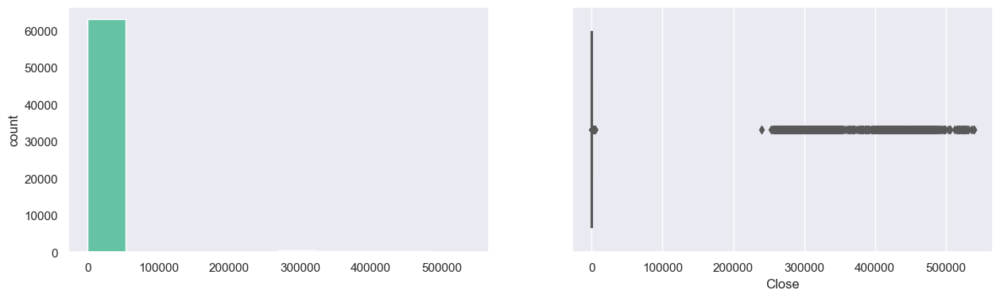

Previous Day Price
Skew : 7.2


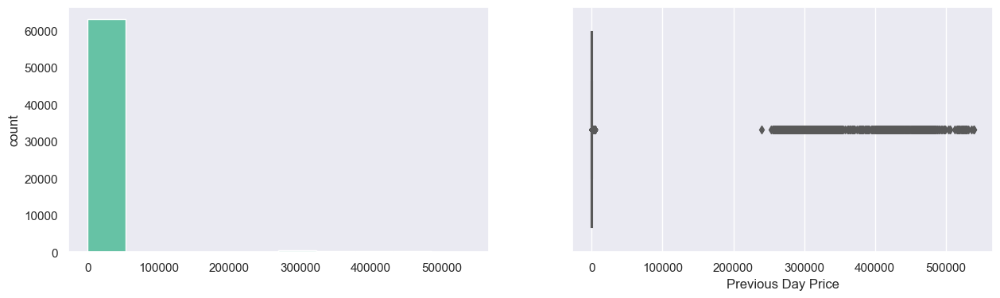

Volume
Skew : 10.26


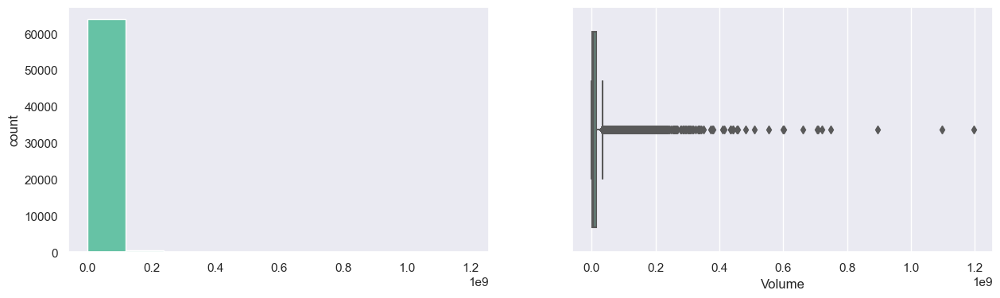

netReceivables
Skew : 4.3


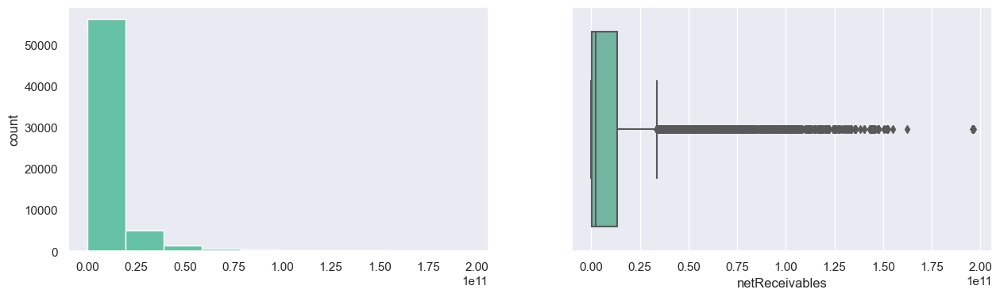

inventory
Skew : 4.05


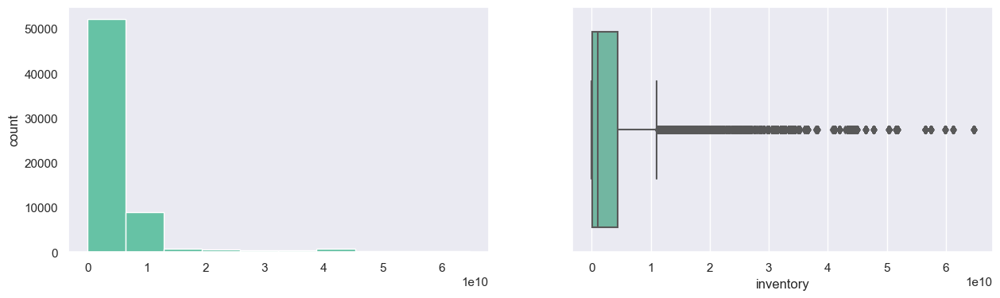

propertyPlantEquipmentNet
Skew : 3.3


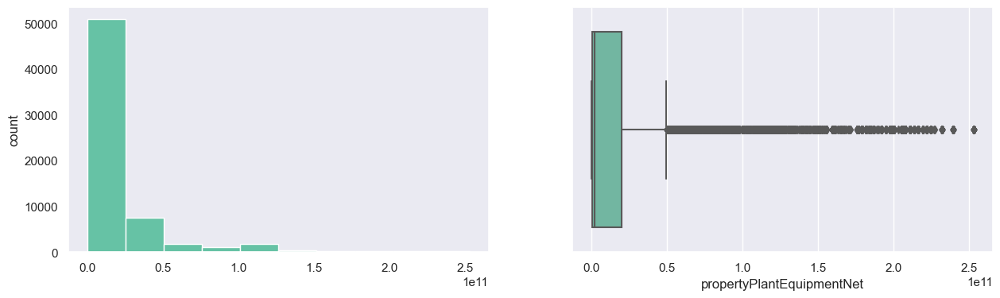

totalCurrentAssets
Skew : 1.79


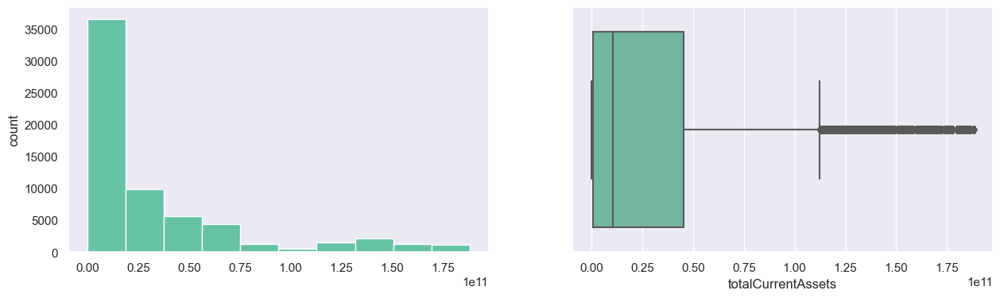

totalLiabilities
Skew : 5.9


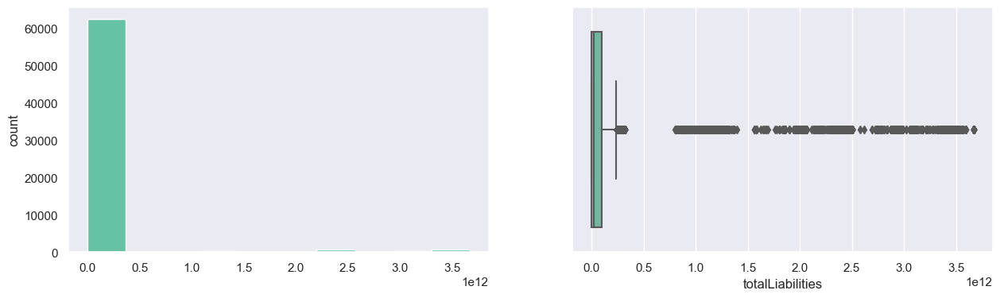

totalEquity
Skew : 2.16


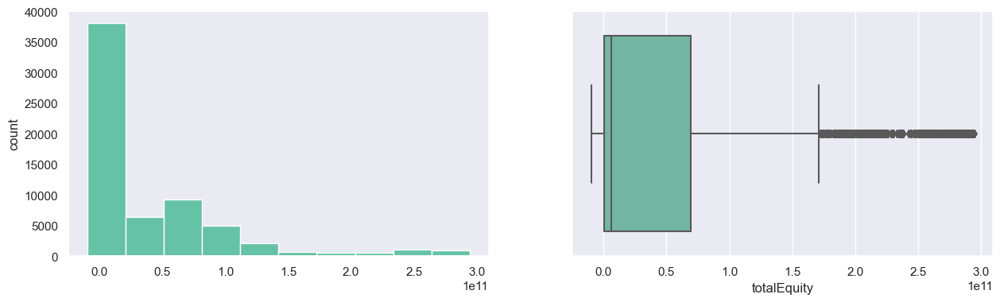

totalDebt
Skew : 4.15


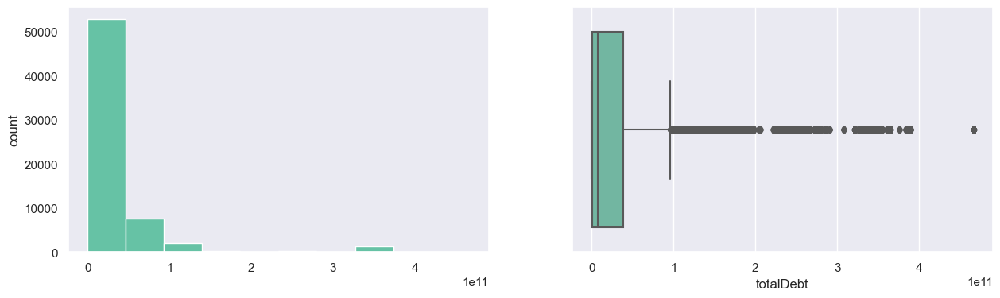

totalCurrentLiabilities
Skew : 1.86


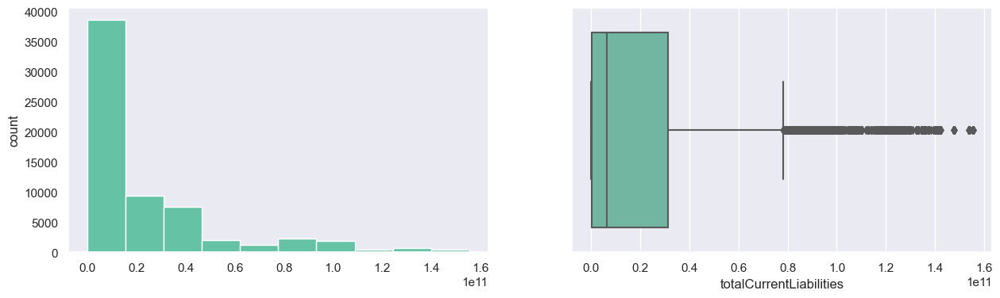

revenue
Skew : 2.91


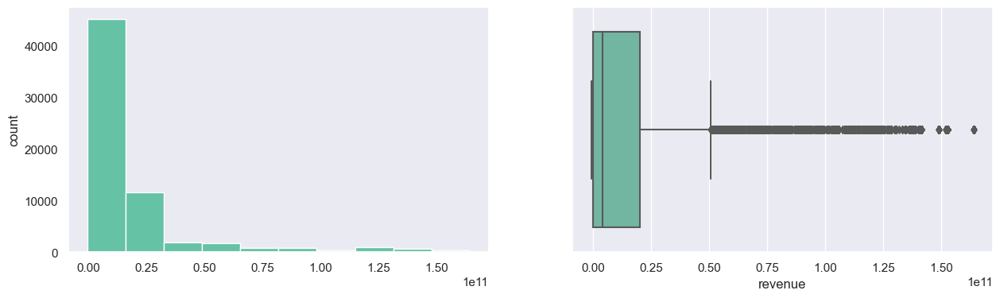

grossProfit
Skew : 1.82


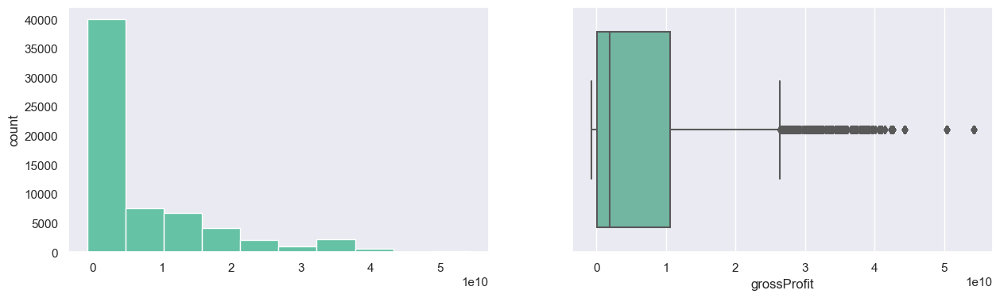

operatingExpenses
Skew : 2.29


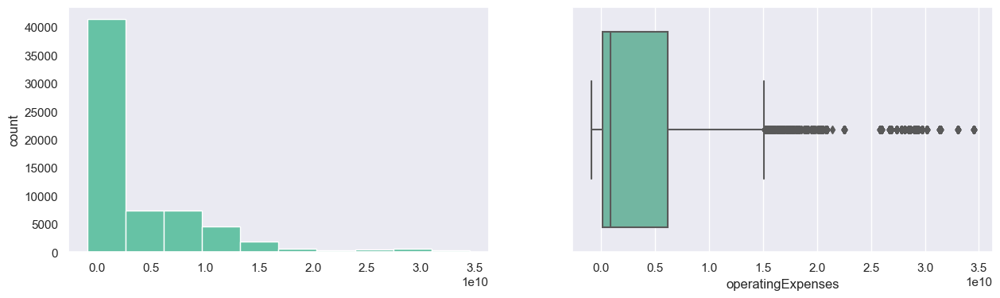

ebitda
Skew : 2.24


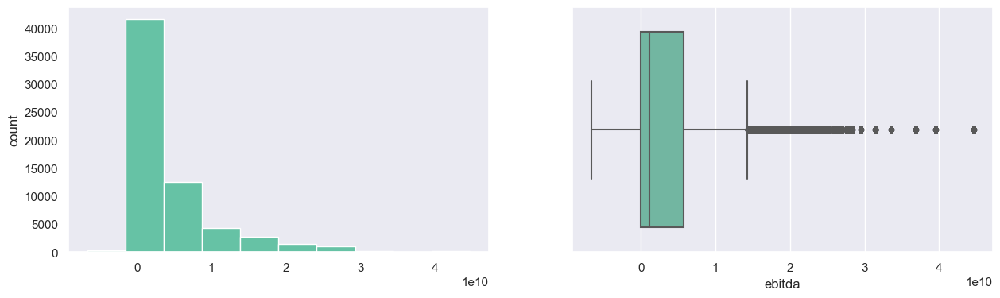

operatingIncome
Skew : 3.08


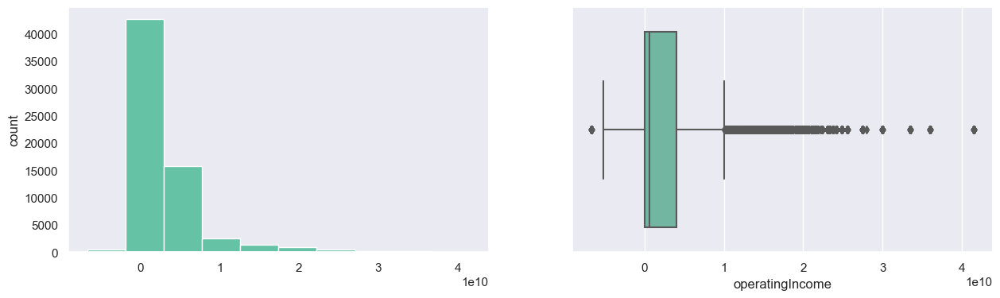

netIncome
Skew : 2.71


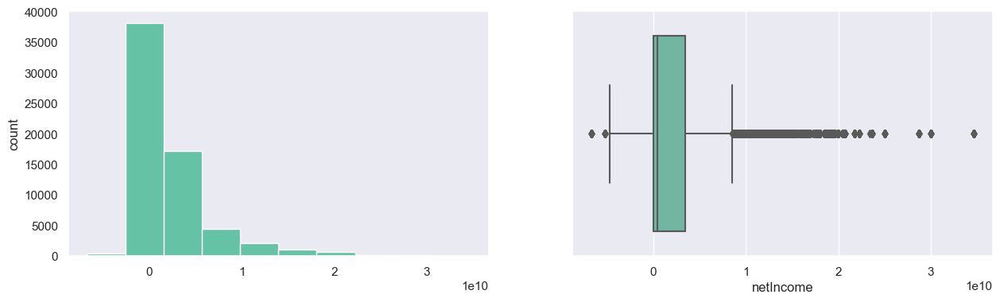

eps
Skew : -10.66


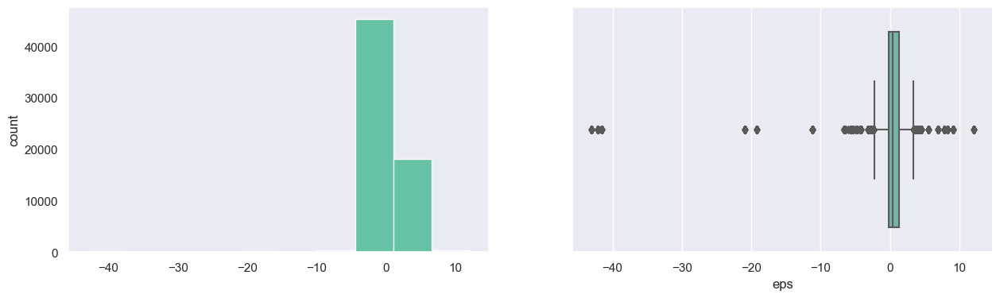

accountsReceivables
Skew : -2.33


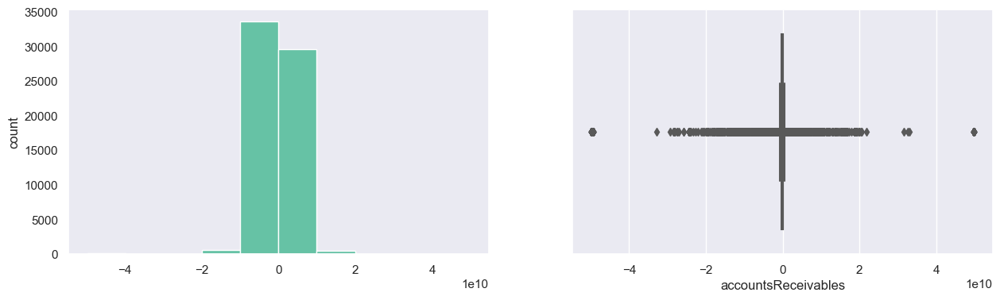

accountsPayables
Skew : 5.09


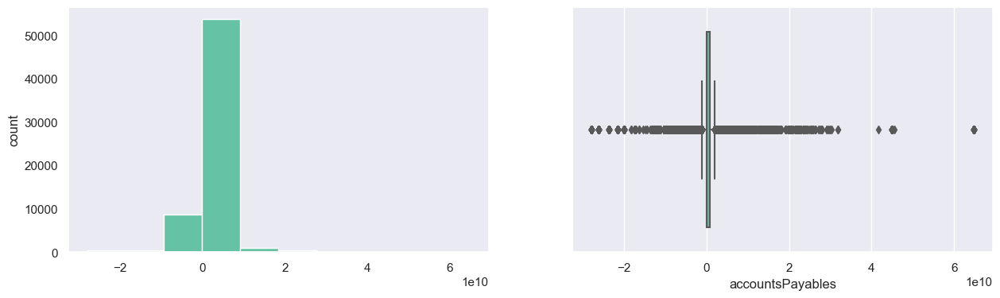

dividendsPaid
Skew : -0.93


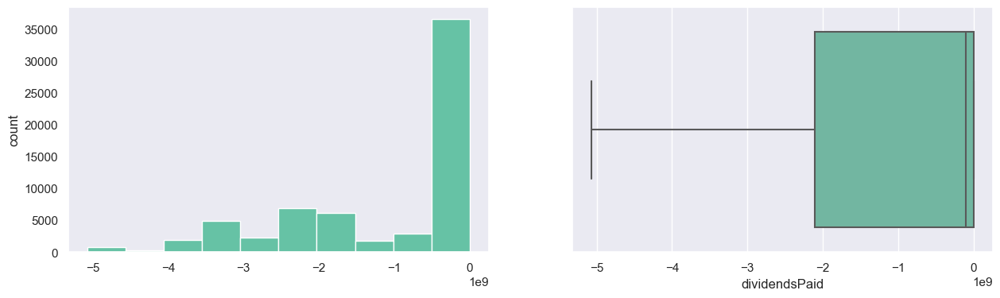

operatingCashFlow
Skew : 0.6


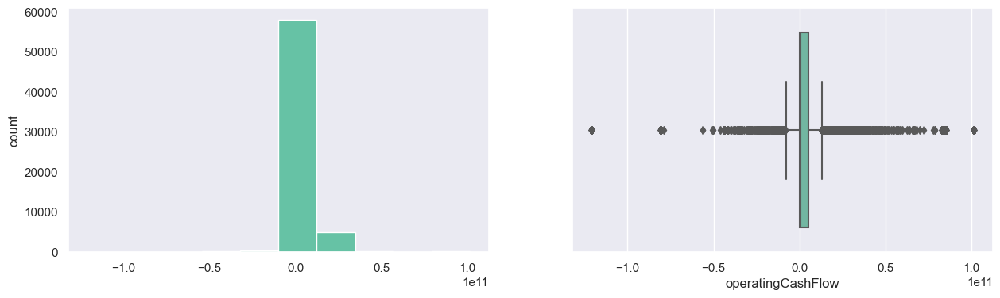

capitalExpenditure
Skew : -3.86


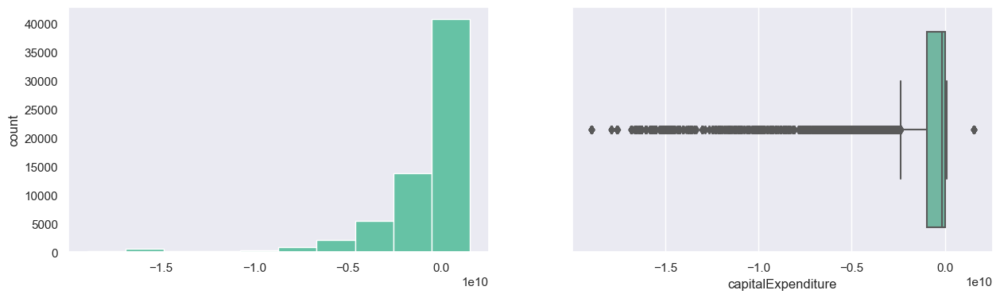

numberOfShares
Skew : 2.35


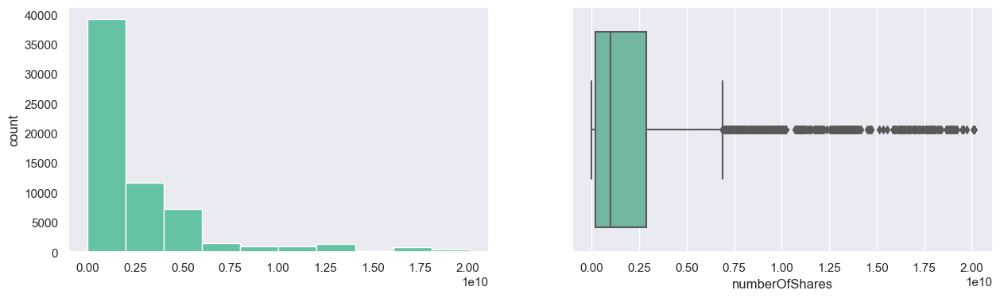

marketCapitalization
Skew : 2.79


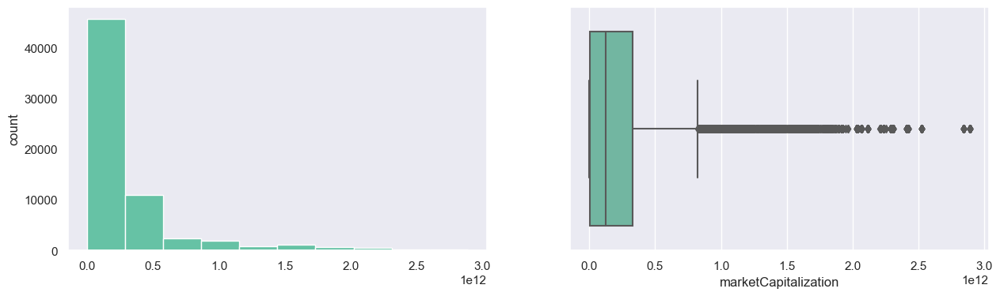

addTotalDebt
Skew : 4.15


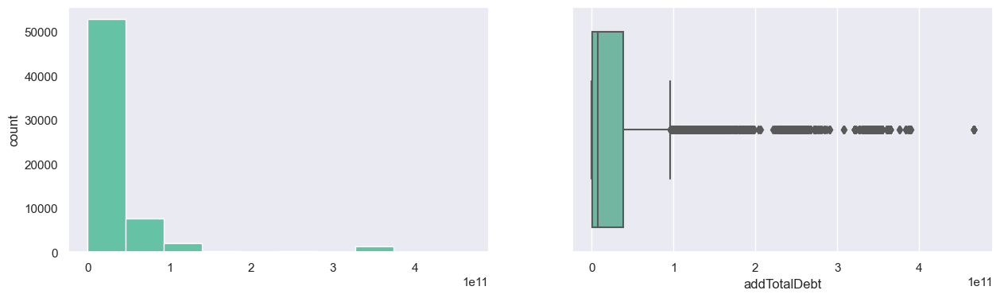

enterpriseValue
Skew : 2.78


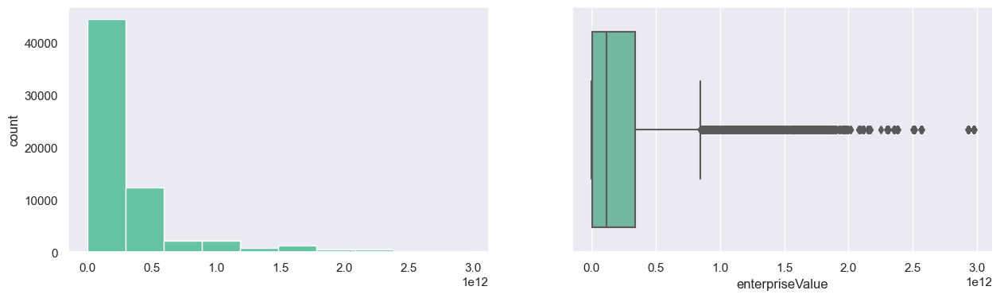

EnvironmentScore
Skew : -0.01


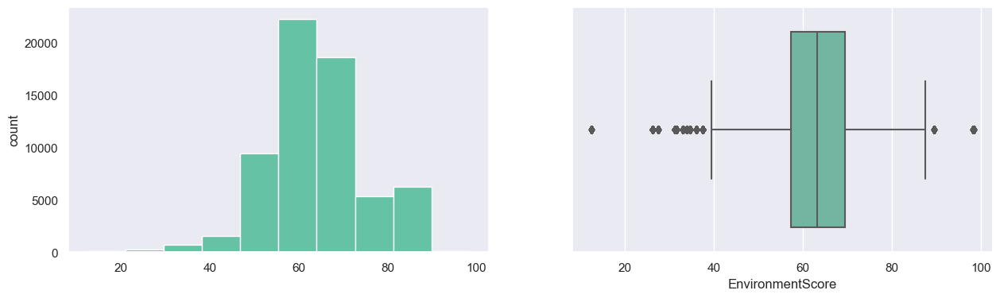

SocialScore
Skew : 0.48


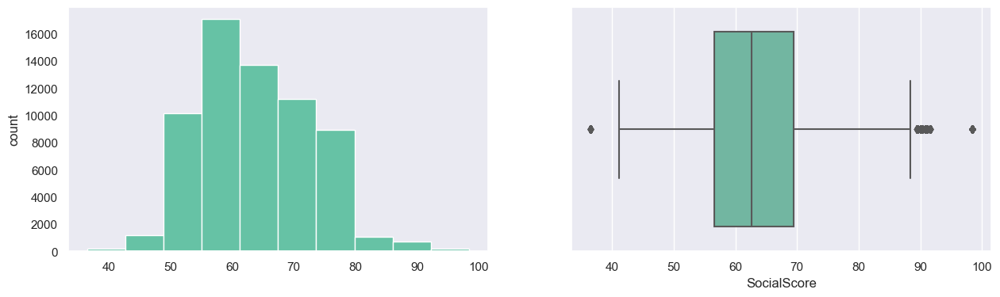

GovernanceScore
Skew : -0.21


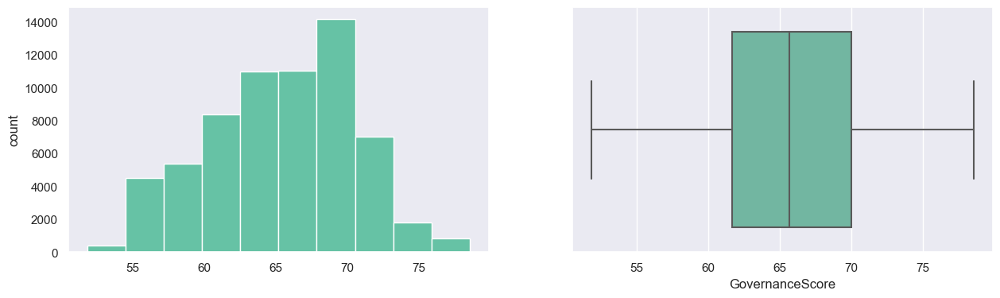

ESGscore
Skew : 0.64


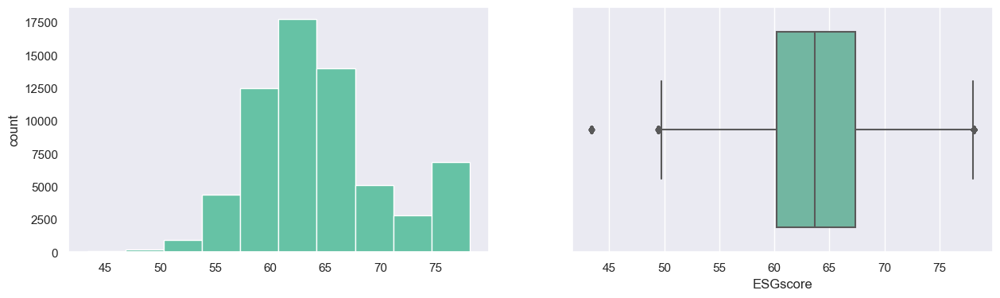

InflationRate
Skew : 0.34


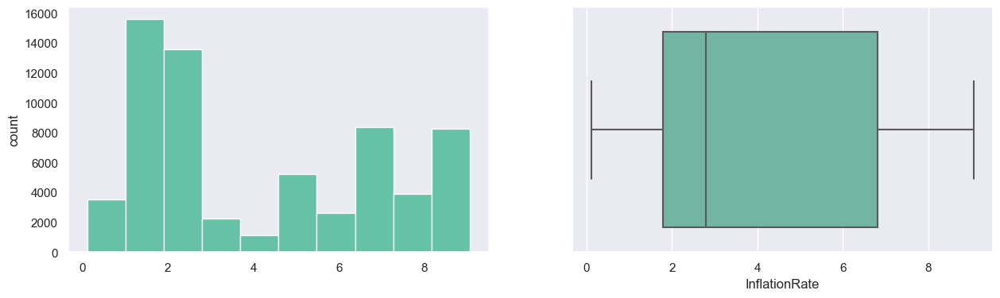

Value - T
Skew : 0.29


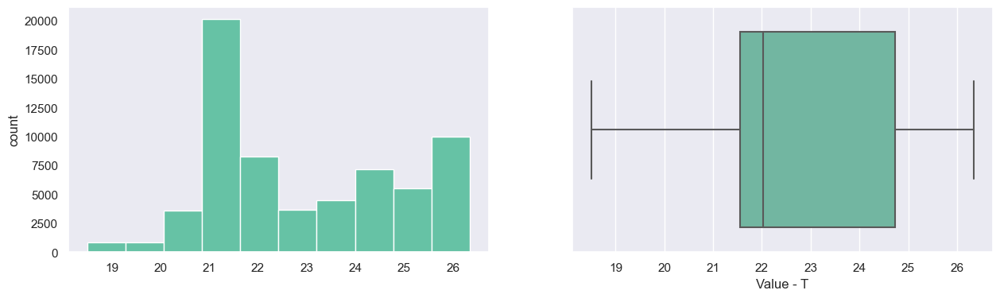

Year
Skew : -0.18


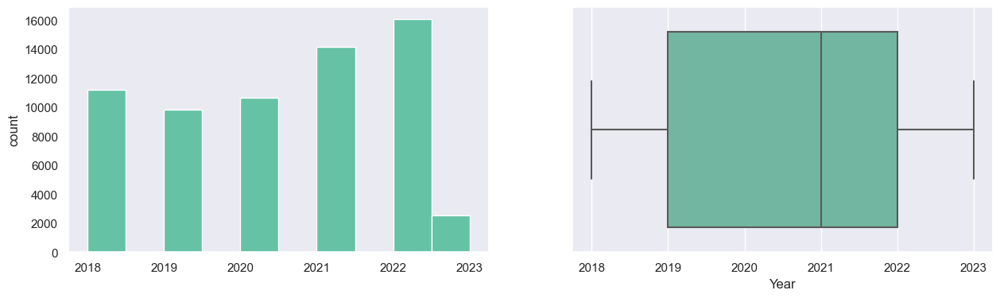

Quarter
Skew : -0.14


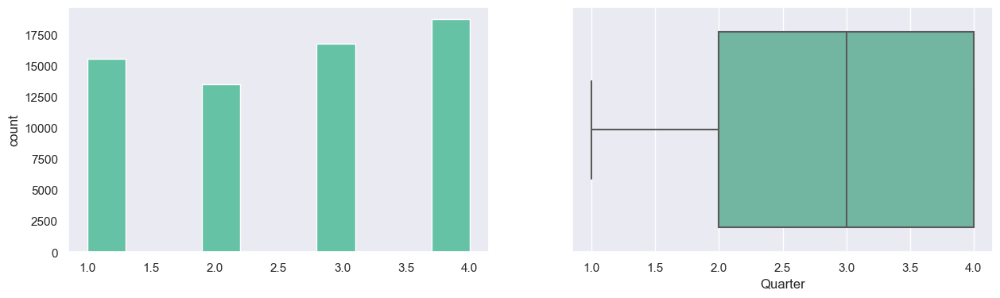

Day
Skew : 0.03


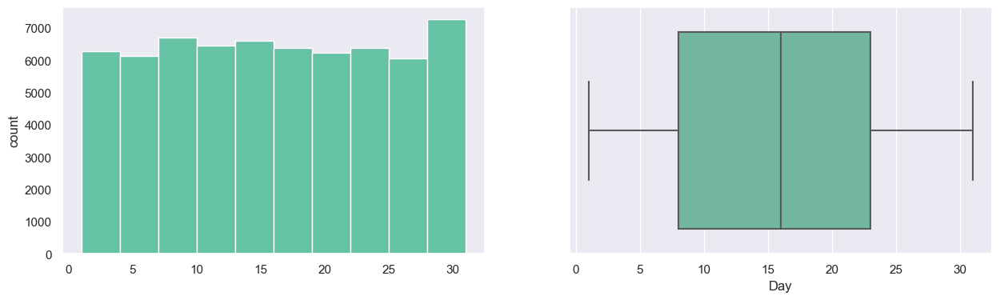

In [233]:
for col in num_cols:
    print(col)
    print('Skew :', round(df_imputed[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df_imputed[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_imputed[col])
    plt.show()

In [91]:
class OutlierHandler(TransformerMixin, BaseEstimator):

    """This class transforms all outliers into np.NaN that will be subsequently treated.
    Outliers < Q1-(1.5*IQR_Value) or > Q3+(1.5*IQR_Value)
    Note : the fit_transform method is inherited from the TransformerMixin super class
    """

    
    def __init__(self):
        self.fitted = False
        return None

    def fit(self, df):
        """
        Pre-condition: Unfitted DataFrame Object containing numerical outliers.
        Post-condition: Fitted DataFrame object with outliers transformed into null values.
        """
    # Outliers are selected for fields containing numerical variables only
        num_df = df.select_dtypes(include='float64')
        
    # Obtain values for Q1, Q3 and IQR ≡ Q3-Q1
        self.quantiles = pd.DataFrame(num_df.quantile([0.25, 0.75]))
        self.quantiles.loc['IQR',:] = self.quantiles.loc[0.75,:] - self.quantiles.loc[0.25,:]

    # Calculate upper and lower limits for outliers.
    # These bounds are calculated on the Train Dataset, then applied to the train and test datasets
        self.quantiles.loc['lower_limit',:] = self.quantiles.loc[0.25,:] - 1.5 * self.quantiles.loc['IQR',:]
        self.quantiles.loc['upper_limit',:] = self.quantiles.loc[0.75,:] + 1.5 * self.quantiles.loc['IQR',:]
    # Change fitting status
        self.fitted = True
        return self

    def transform(self, df):
        """
        Pre-condition: Fitted DataFrame object
        Post-condition: DataFrame object with outliers transformed into NaN.
        """
        if self.fitted == False:
            print('The transformer must be fitted before transformation.')
            return None
    # Make a copy of the dataframe object to prevent mutation.
        df_copy = df.copy()
    # Old number of NaNs to count number of outliers
        old_num_na = sum(df_copy.isnull().sum())
        for col in self.quantiles.columns:
    # Fill values < lower limit
            df_copy.loc[df_copy.loc[:,col] < self.quantiles.loc['lower_limit',col],col] = np.NaN
    # Fill values > upper limit
            df_copy.loc[df_copy.loc[:,col] > self.quantiles.loc['upper_limit',col],col] = np.NaN
    # Print Number of Outliers
        print(str(sum(df_copy.isna().sum()) - old_num_na) + ' Outliers are Identified.')
        return df_copy

In [92]:
#Identifying outliers
outlier_handler = OutlierHandler()
trainset = outlier_handler.fit_transform(df_imputed)

225730 Outliers are Identified.


In [ ]:
trainset

In [93]:
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

# create sample dataframe with missing values and categorical columns
df = pd.DataFrame(trainset)

# select only the numerical columns
df_numerical = df.select_dtypes(include=np.number)

# replace zeros with NaN
df_numerical = df_numerical.replace(0, np.nan)

# instantiate KNN imputer with k=3
imputer = KNNImputer(n_neighbors=3)

# impute missing and zero values in the numerical columns
df_numerical_imputed_trainset = pd.DataFrame(imputer.fit_transform(df_numerical), columns=df_numerical.columns)

# replace NaN back to zeros
df_numerical_imputed_trainset = df_numerical_imputed_trainset.replace(np.nan, 0)

# combine the imputed numerical columns with the original categorical columns
df_numerical_imputed_trainset = pd.concat([df.select_dtypes(exclude=np.number), df_numerical_imputed_trainset], axis=1)

# display the resulting dataframe
print(df_numerical_imputed_trainset)


      Price Change Ticker Market Capitalization                Industry  \
0         Decrease   AAPL             Large-cap  Information Technology   
1         Increase   AAPL             Large-cap  Information Technology   
2         Increase   AAPL             Large-cap  Information Technology   
3         Increase   AAPL             Large-cap  Information Technology   
4         Increase   AAPL             Large-cap  Information Technology   
...            ...    ...                   ...                     ...   
64506     Increase    ZOM             Small-cap             Health Care   
64507     Increase    ZOM             Small-cap             Health Care   
64508     Decrease    ZOM             Small-cap             Health Care   
64509     Decrease    ZOM             Small-cap             Health Care   
64510     Constant    ZOM             Small-cap             Health Care   

                       Sector IsCovidYear       Date    Month Day of Week  \
0        Consumer Elec

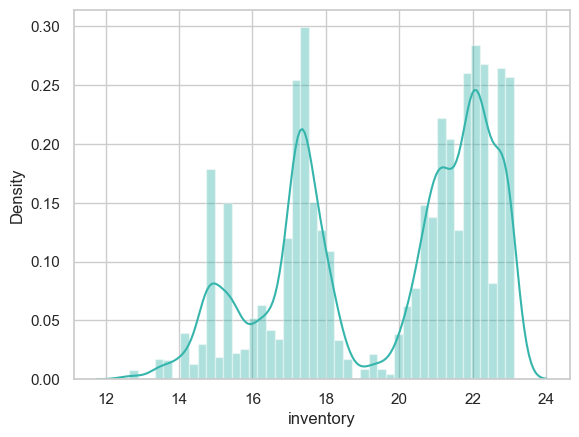

In [94]:
# Function for log and cube root transformation of the column
def log_cube_transform(data, col):
    for colname in col:
        # Log transform positive values
        data[colname][data[colname] > 0] = np.log(data[colname][data[colname] > 0] + 1e-10)
        # Cube root transform negative values
        data[colname][data[colname] < 0] = -1 * np.power(-1 * data[colname][data[colname] < 0], 1/3)
    
log_cube_transform(df_numerical_imputed_trainset, ['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)', 'InflationRate', 'Value - T', 'Year', 'Quarter', 'Day'])

# Plot the transformed feature 'inventory'
sns.distplot(df_numerical_imputed_trainset["inventory"], axlabel="inventory");


In [493]:
df_numerical_imputed_trainset

,Price Change,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
0,Decrease,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-17,March,Friday,5.04,5.05,17.01,23.37,21.32,23.32,24.35,25.25,23.68,24.41,24.49,24.04,23.21,22.18,22.90,22.76,22.59,-1.08,-707.55,-476.22,-1362.00,22.75,-888.39,22.41,27.36,24.41,27.40,4.31,4.22,4.26,4.27,2.44,-0.78,-0.90,7.17,6.20,2.51,15.12,11.09,4.60,4.96,4.76,2.04,12.67,13.97,2.12,2.68,2.29,1.52,3.14,7.61,0.00,2.83
1,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-16,March,Thursday,5.05,5.03,17.05,24.18,21.94,24.02,25.15,25.97,24.37,25.11,24.72,24.36,23.92,22.82,23.19,22.94,22.63,-0.60,-784.00,-1002.81,-1355.44,22.70,-1215.14,22.27,26.96,25.11,26.85,4.20,4.13,4.18,4.17,2.04,-0.64,-0.95,7.50,1.10,1.47,15.00,11.75,3.92,4.51,4.00,1.67,15.16,13.06,2.10,3.04,2.98,1.69,3.16,7.61,0.00,2.77
2,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-15,March,Wednesday,5.03,5.03,17.14,13.66,15.25,12.57,18.06,19.15,-513.36,14.23,16.84,17.22,16.84,17.11,-179.75,-183.89,-182.04,-0.55,15.94,13.42,-1339.24,-173.15,-89.84,17.36,19.66,14.23,19.59,4.47,4.35,4.24,4.36,1.30,-0.65,-0.95,7.49,0.29,1.30,14.91,10.18,4.61,4.56,4.74,1.67,13.02,13.16,2.65,3.04,3.39,0.75,3.07,7.61,0.00,2.71
3,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-14,March,Tuesday,5.03,5.01,17.16,13.66,15.25,12.57,18.06,19.15,-513.36,14.23,16.84,17.22,16.84,17.11,-179.75,-183.89,-182.04,-0.55,-587.48,13.42,-1461.49,-173.15,-89.84,17.36,19.66,14.23,19.59,4.47,4.35,4.24,4.36,2.87,-0.64,-0.95,7.50,4.86,3.06,15.95,12.60,4.47,4.68,4.93,1.47,14.57,12.74,1.87,1.00,2.21,0.75,3.07,7.61,0.00,2.64
4,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-13,March,Monday,5.01,5.00,16.95,23.73,21.22,23.37,24.53,25.34,23.54,24.41,24.66,24.13,23.27,22.21,22.97,22.84,22.66,-1.05,18.77,-476.22,-1533.04,22.81,-1031.28,22.40,27.41,24.41,27.45,4.37,4.24,4.21,4.27,2.73,-0.78,-0.90,7.17,6.19,2.56,15.12,11.24,3.14,3.89,4.19,2.12,13.15,13.82,1.52,-0.71,1.98,1.39,3.13,7.61,0.00,2.56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,Increase,ZOM,Small-cap,Health Care,Diagnostics & Research,NonCovid,2018-01-08,January,Monday,0.71,0.69,9.47,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,-0.27,9.89,12.94,-102.66,-119.53,-23.64,18.32,19.11,11.44,19.09,4.07,4.10,4.22,4.13,0.51,-0.52,-0.90,0.00,0.51,0.00,12.60,10.79,1.81,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,-1.17,0.74,3.04,7.61,0.00,2.08
64507,Increase,ZOM,Small-cap,Health Care,Diagnostics & Research,NonCovid,2018-01-05,January,Friday,0.69,0.62,10.42,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,-0.27,9.89,12.94,-102.66,-119.53,-23.64,18.32,19.11,11.44,19.09,4.07,4.10,4.22,4.13,0.51,-0.52,-0.90,0.00,0.51,0.00,12.60,10.79,1.81,1.81,1.81,0

Close
Skew : 1.04


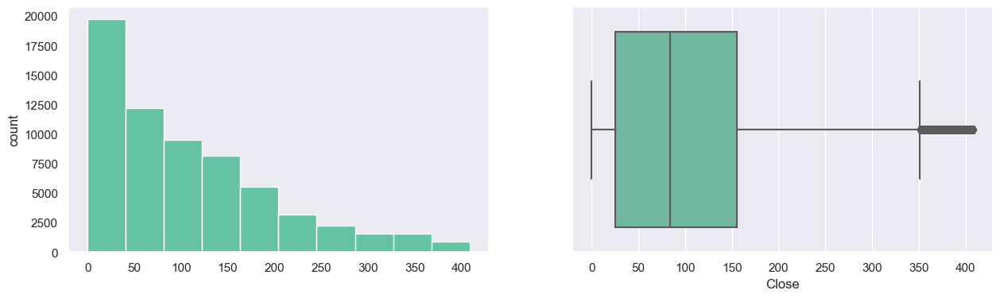

Previous Day Price
Skew : 1.05


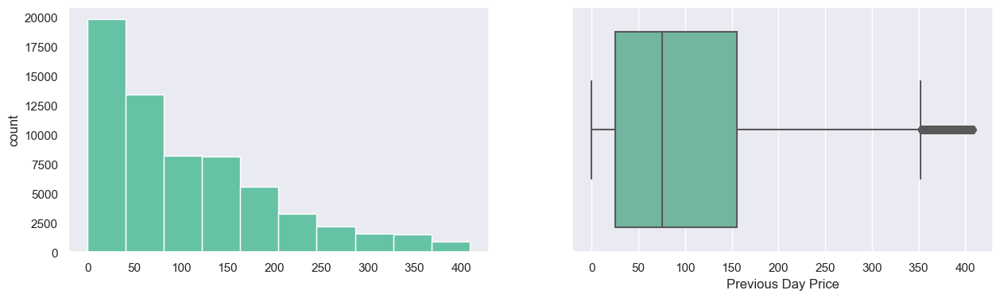

Volume
Skew : 1.03


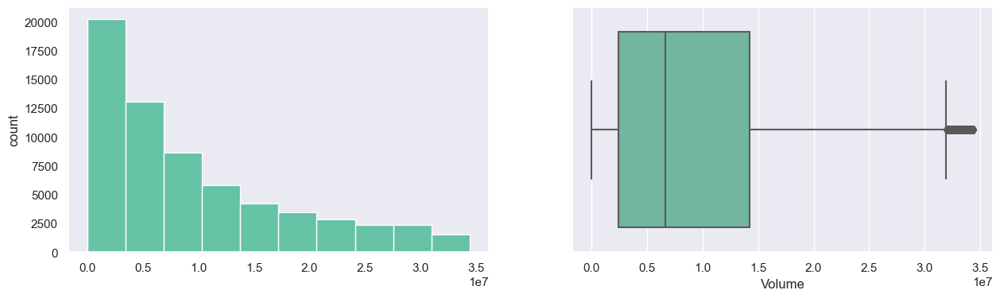

netReceivables
Skew : 1.31


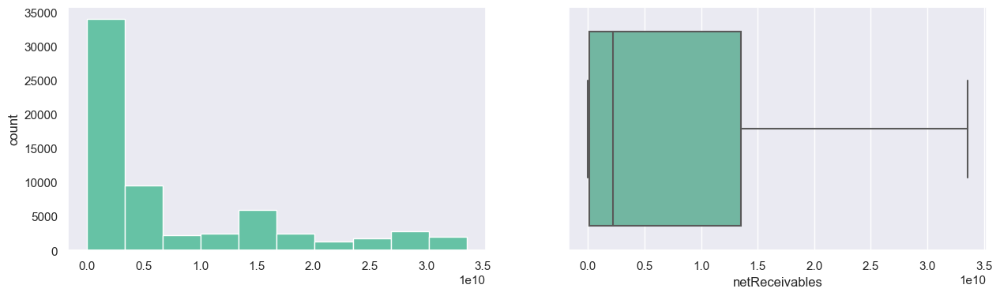

inventory
Skew : 1.29


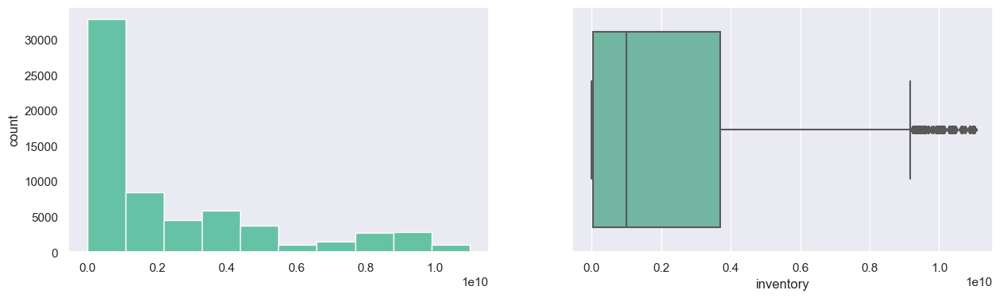

propertyPlantEquipmentNet
Skew : 0.97


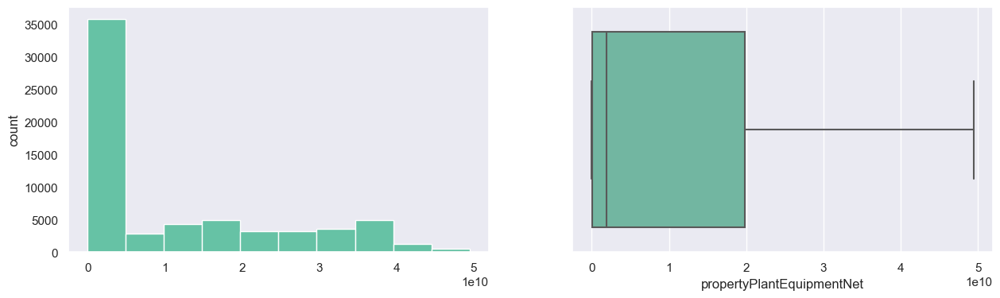

totalCurrentAssets
Skew : 1.12


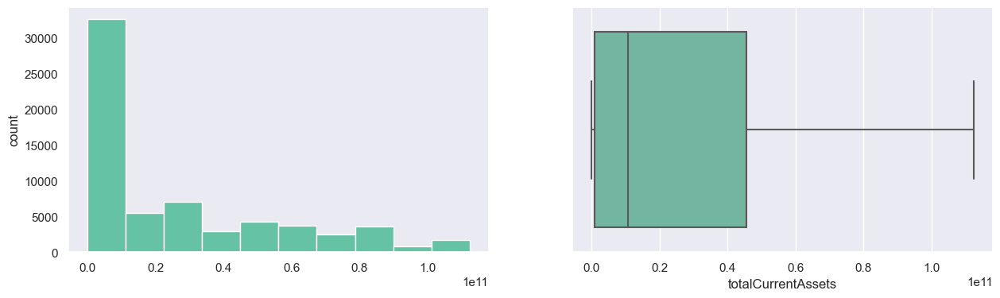

totalLiabilities
Skew : 1.08


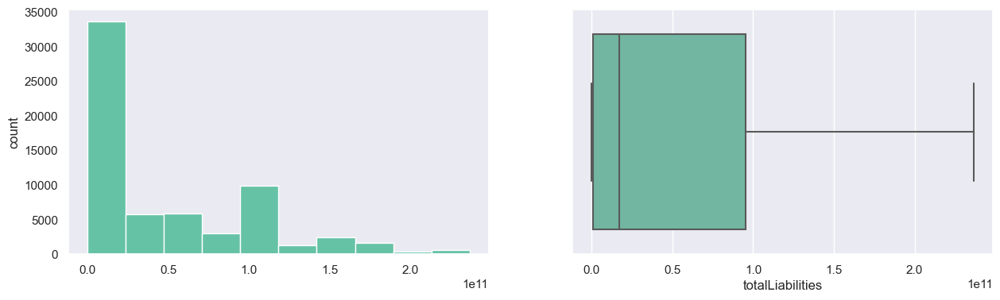

totalEquity
Skew : 1.1


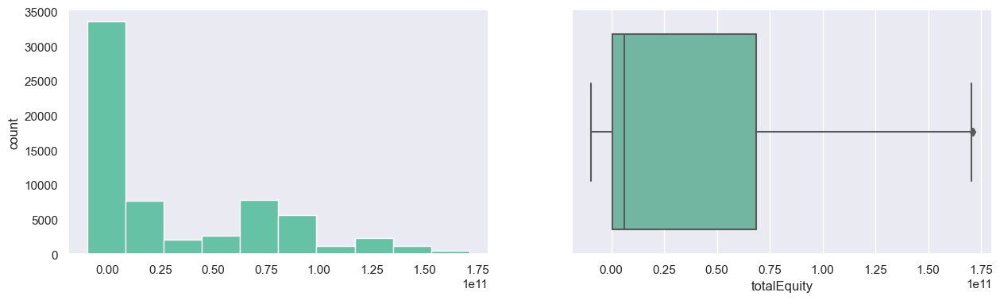

totalDebt
Skew : 1.01


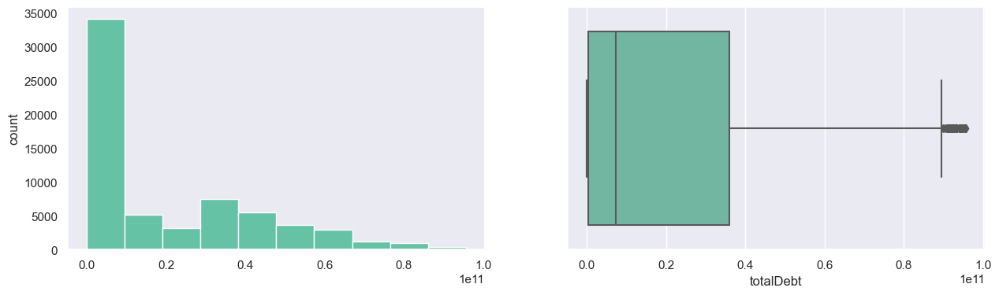

totalCurrentLiabilities
Skew : 1.0


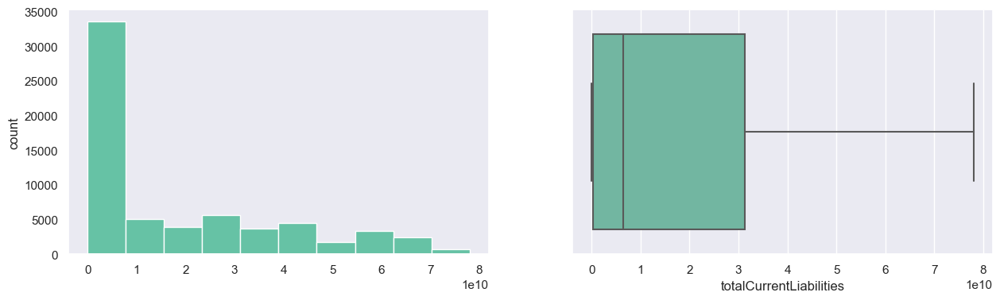

revenue
Skew : 1.17


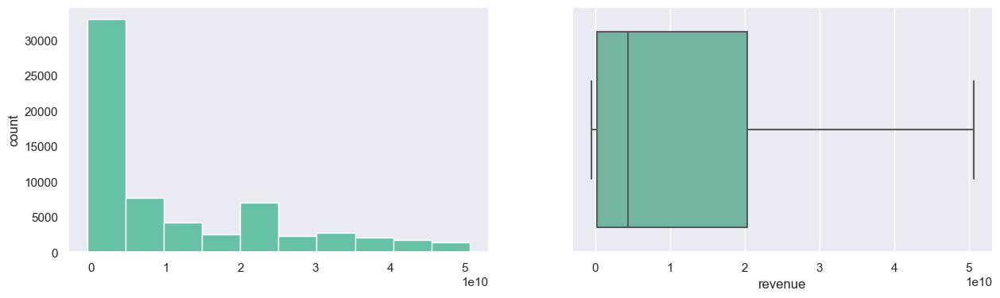

grossProfit
Skew : 1.15


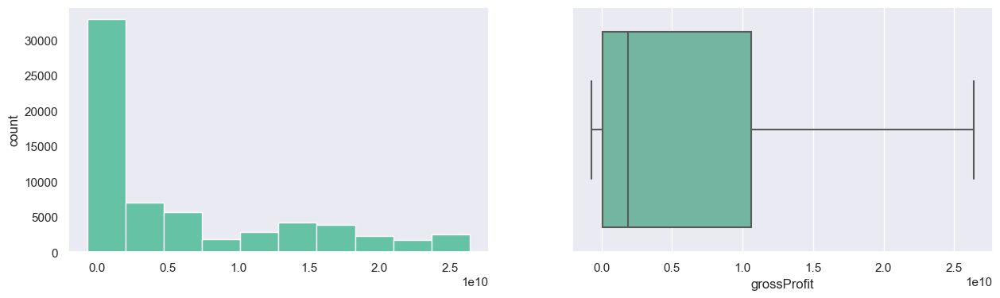

operatingExpenses
Skew : 1.14


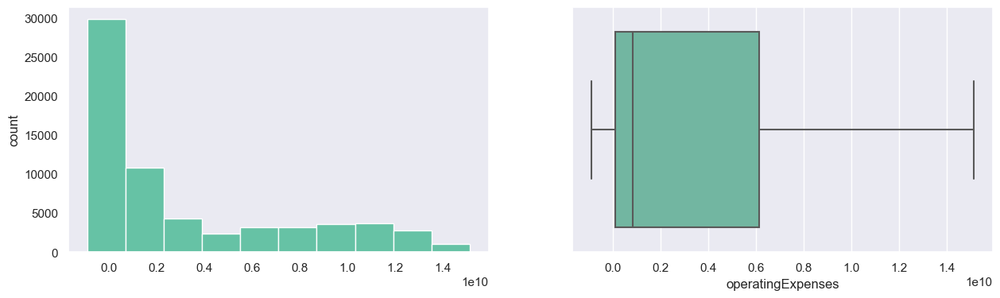

ebitda
Skew : 1.08


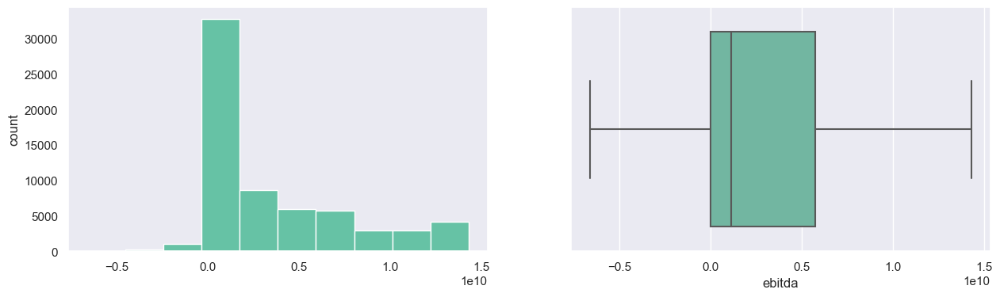

operatingIncome
Skew : 0.97


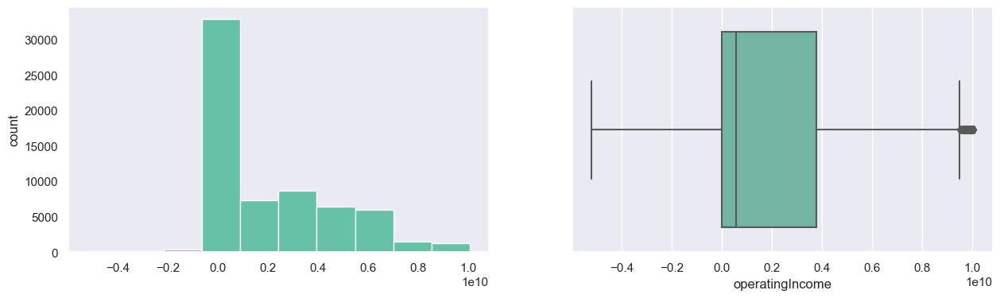

netIncome
Skew : 1.1


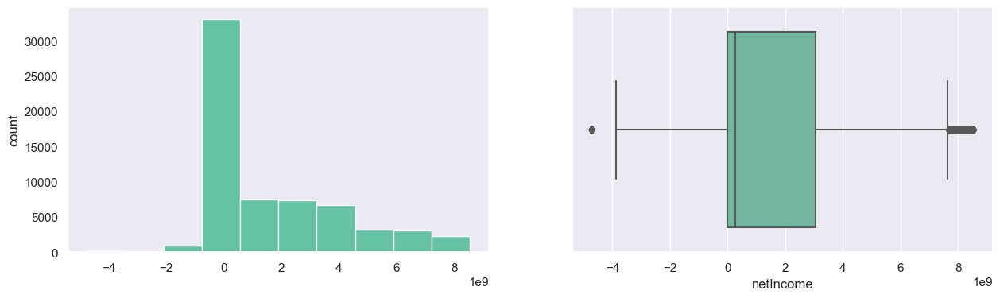

eps
Skew : 0.54


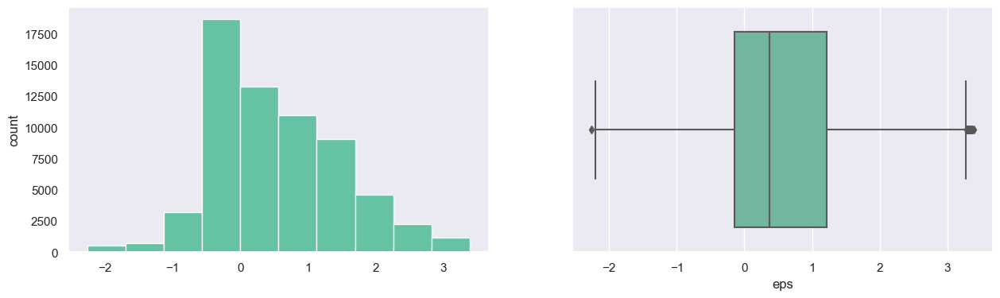

accountsReceivables
Skew : -0.4


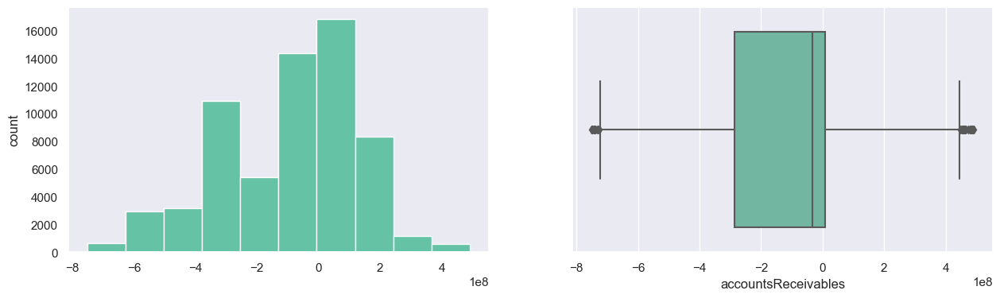

accountsPayables
Skew : 0.8


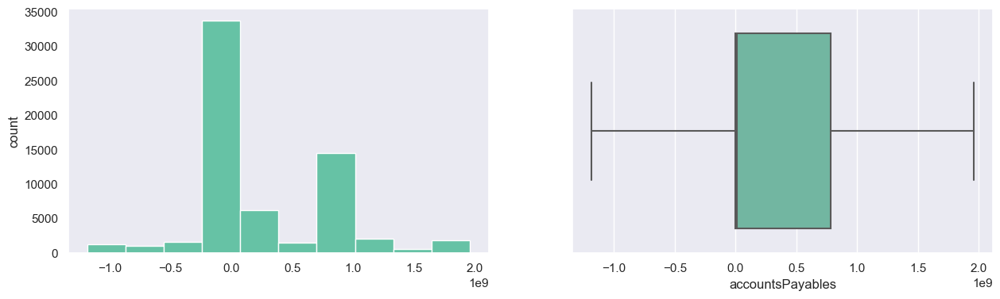

dividendsPaid
Skew : -0.93


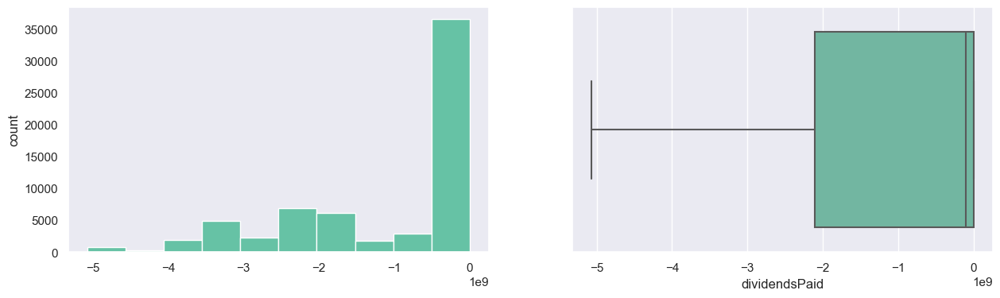

operatingCashFlow
Skew : 1.08


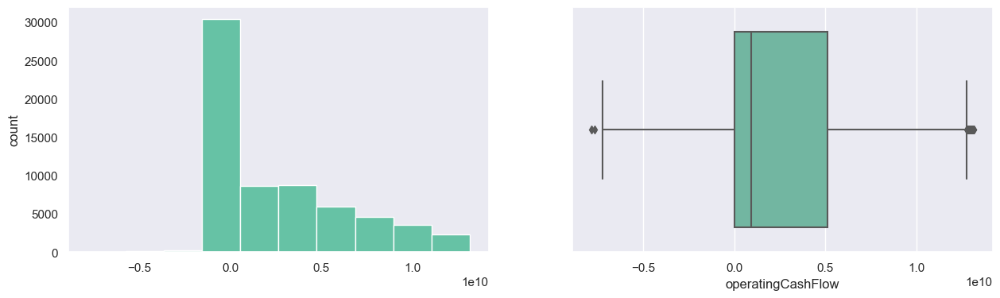

capitalExpenditure
Skew : -1.35


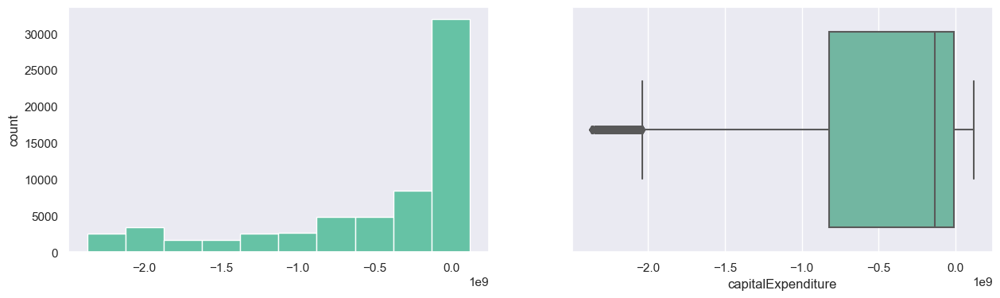

numberOfShares
Skew : 0.88


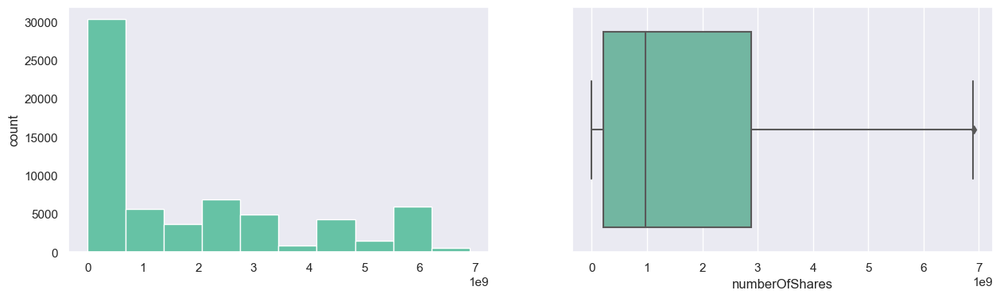

marketCapitalization
Skew : 1.01


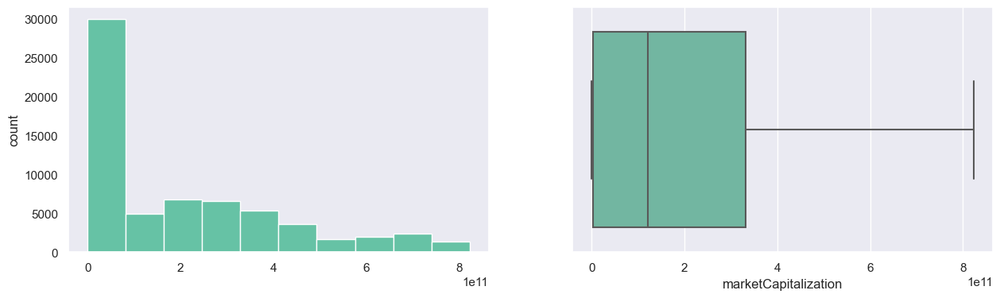

addTotalDebt
Skew : 1.01


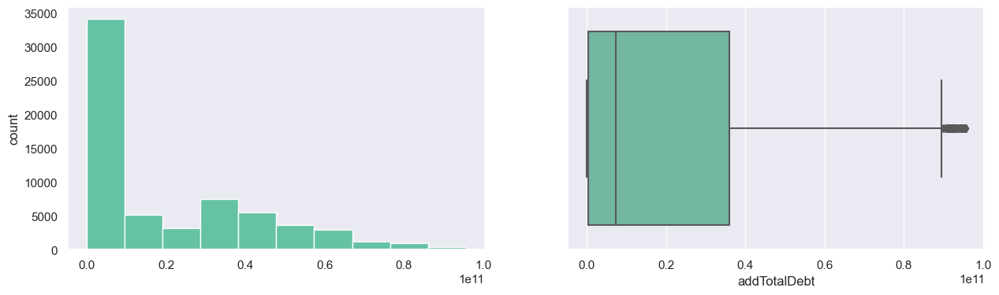

enterpriseValue
Skew : 0.98


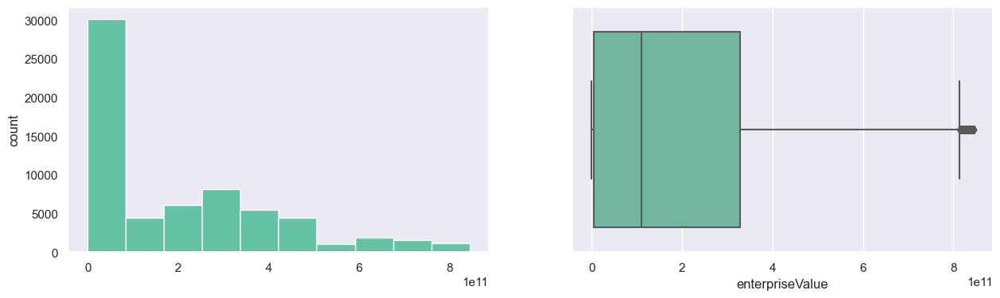

EnvironmentScore
Skew : 0.39


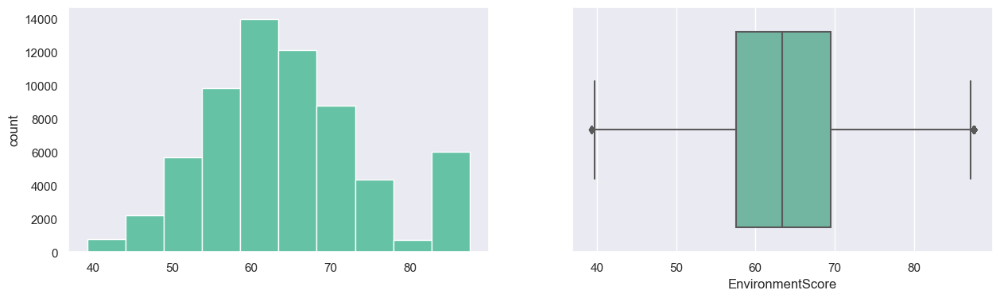

SocialScore
Skew : 0.35


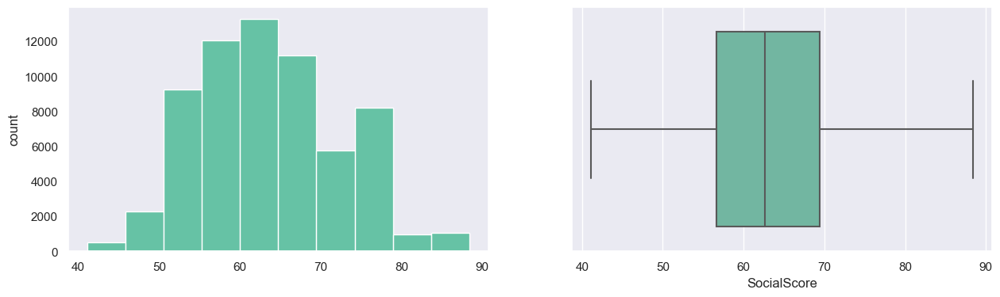

GovernanceScore
Skew : -0.21


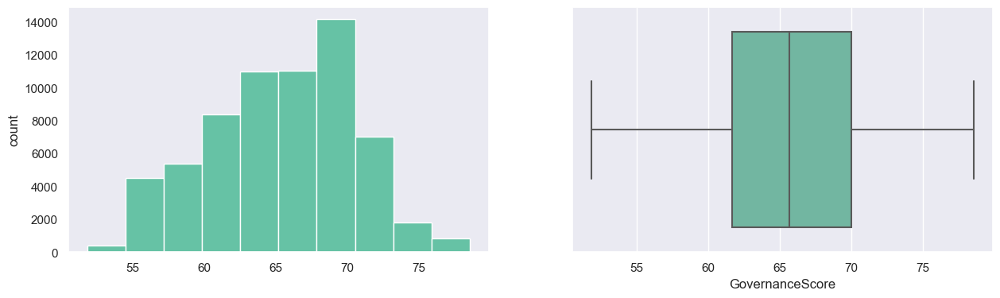

ESGscore
Skew : 0.33


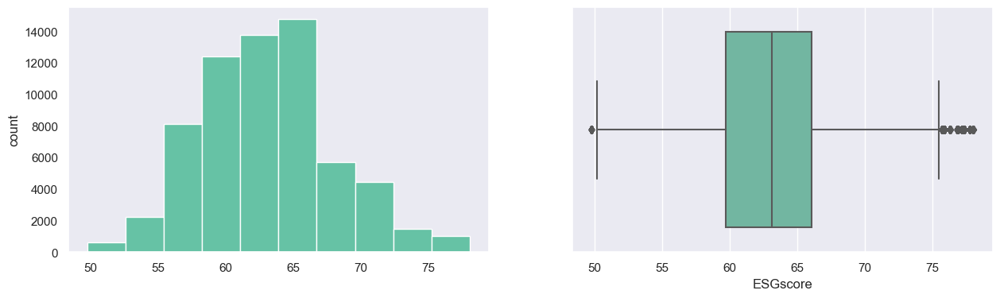

InflationRate
Skew : 0.34


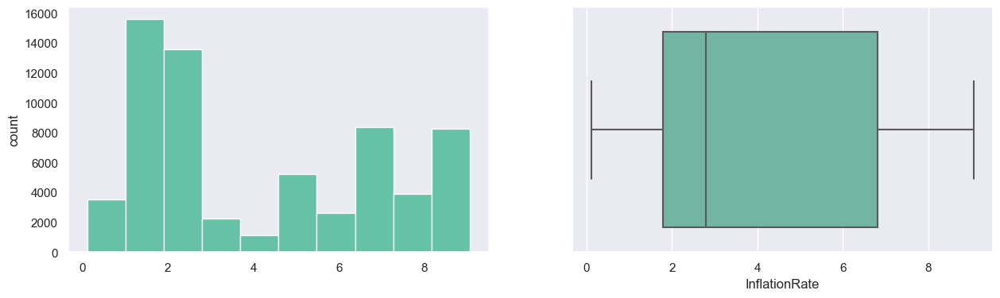

Value - T
Skew : 0.29


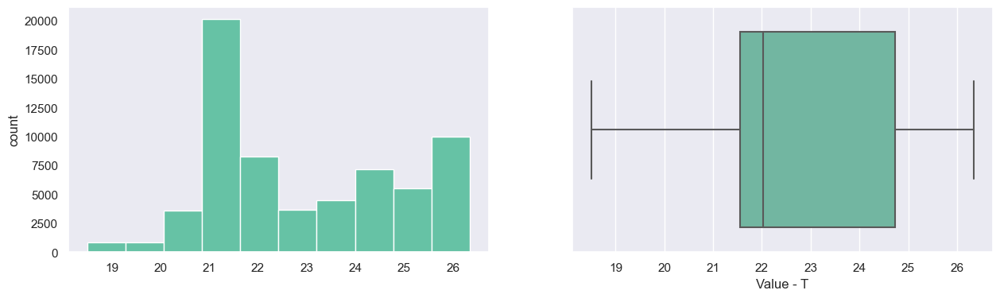

Year
Skew : -0.18


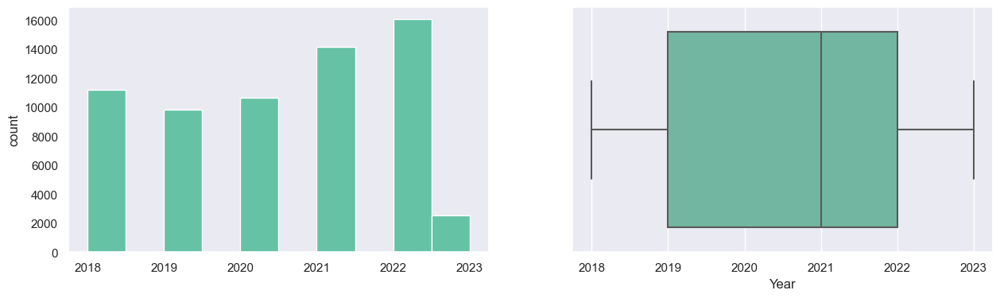

Quarter
Skew : -0.14


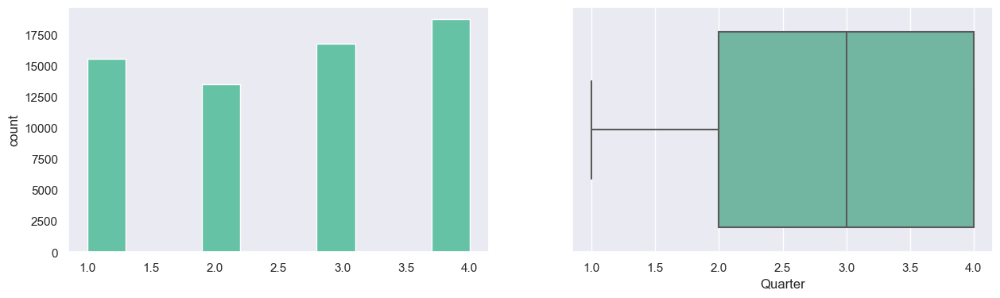

Day
Skew : 0.03


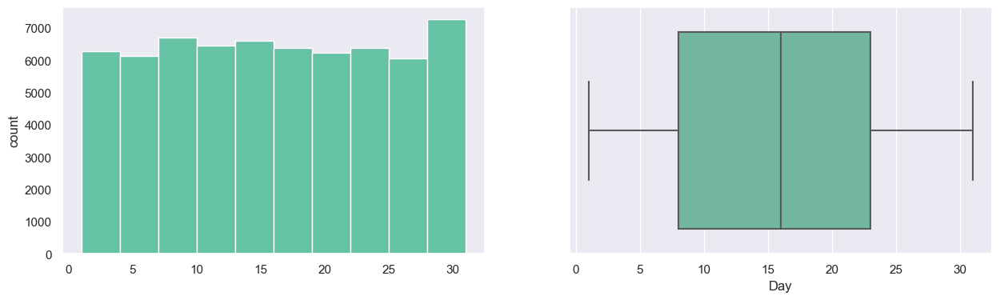

In [270]:
for col in num_cols:
    print(col)
    print('Skew :', round(df_numerical_imputed_trainset[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df_numerical_imputed_trainset[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_numerical_imputed_trainset[col])
    plt.show()

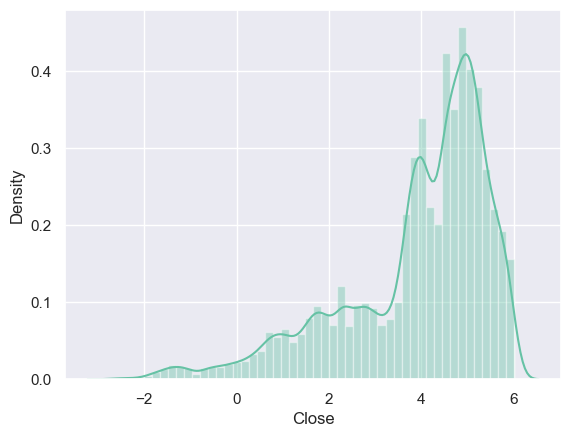

In [289]:
sns.distplot(df_numerical_imputed_trainset["Close"], axlabel="Close");

Close
Skew : -1.26


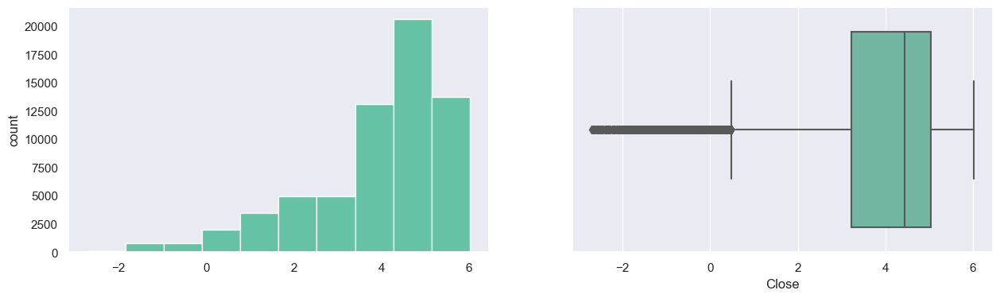

Previous Day Price
Skew : -1.25


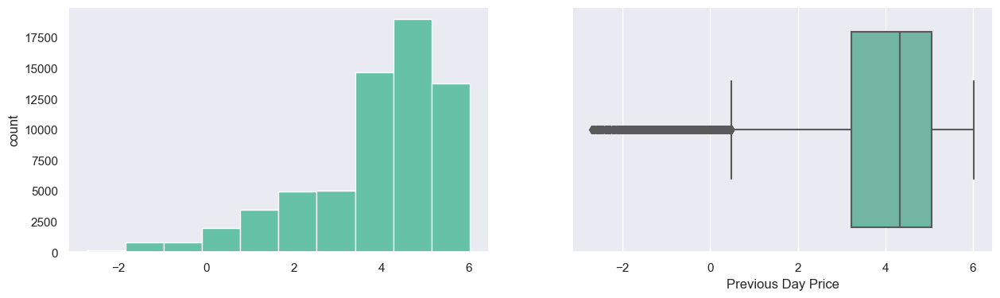

Volume
Skew : -2.5


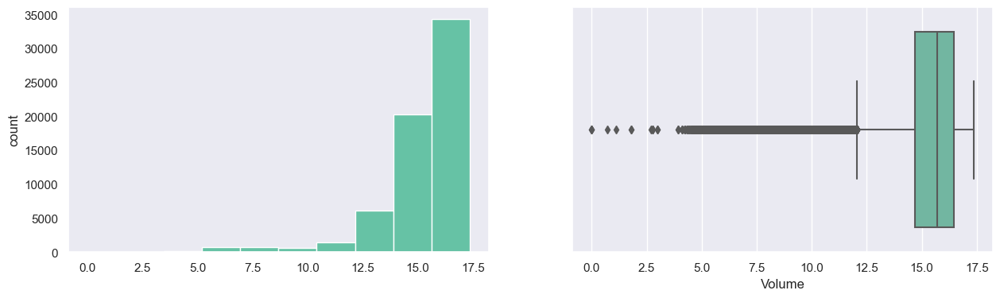

netReceivables
Skew : -1.11


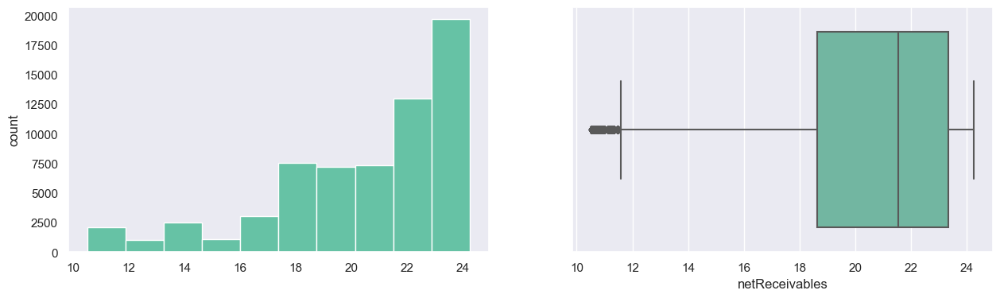

inventory
Skew : -0.43


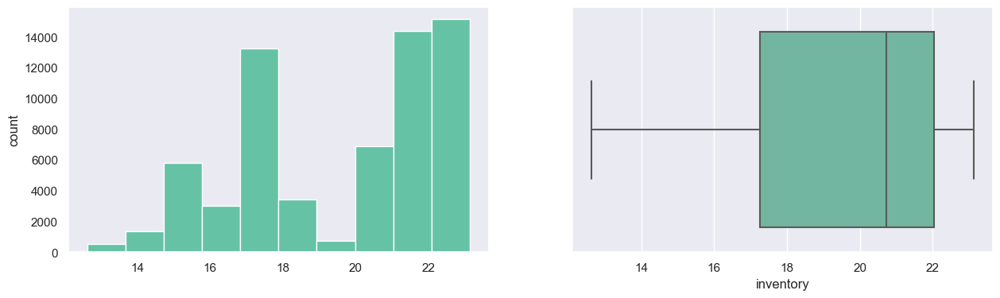

propertyPlantEquipmentNet
Skew : -0.77


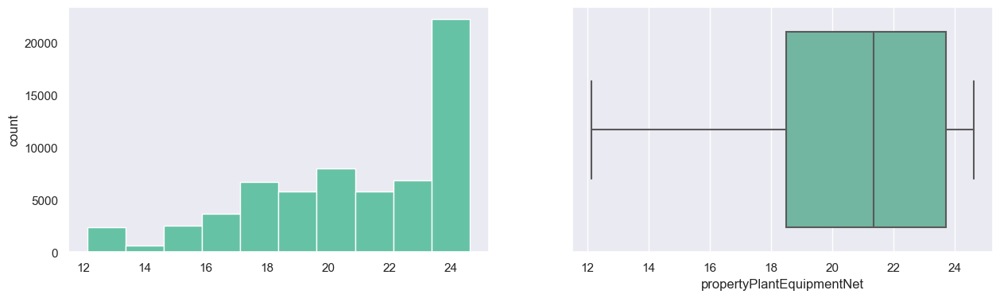

totalCurrentAssets
Skew : -0.91


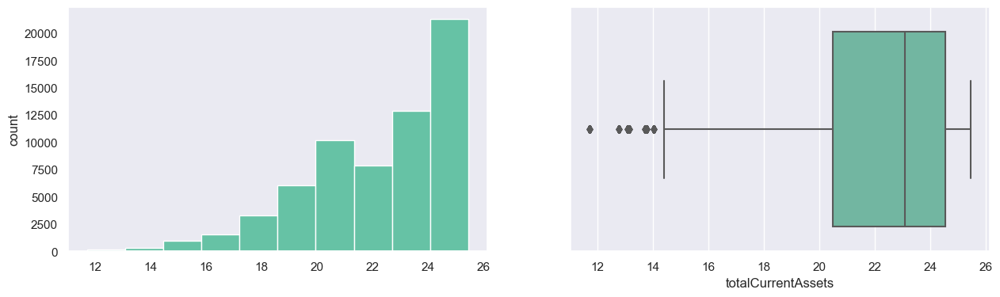

totalLiabilities
Skew : -0.75


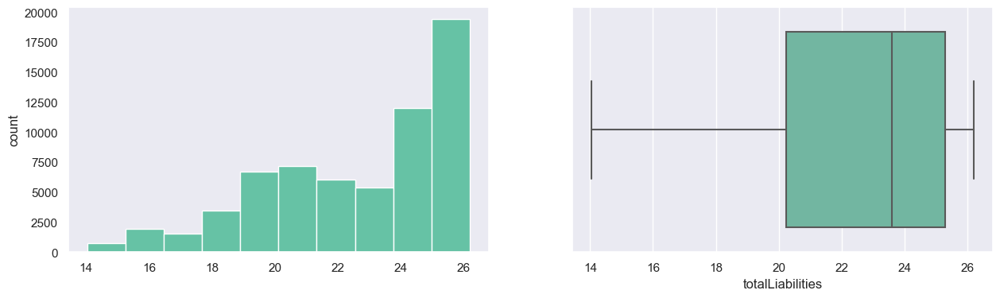

totalEquity
Skew : -0.7


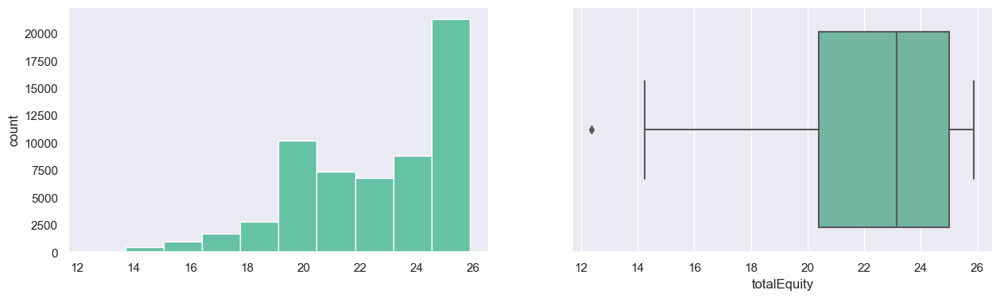

totalDebt
Skew : -0.99


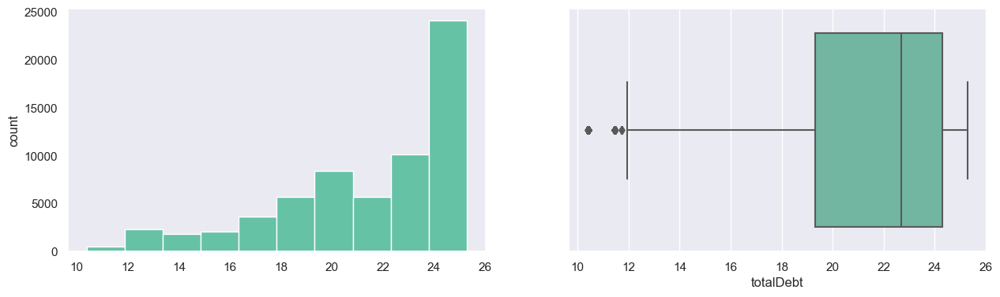

totalCurrentLiabilities
Skew : -0.76


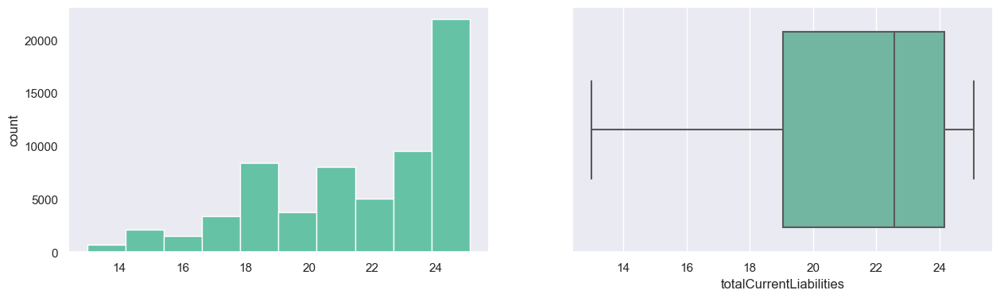

revenue
Skew : -1.18


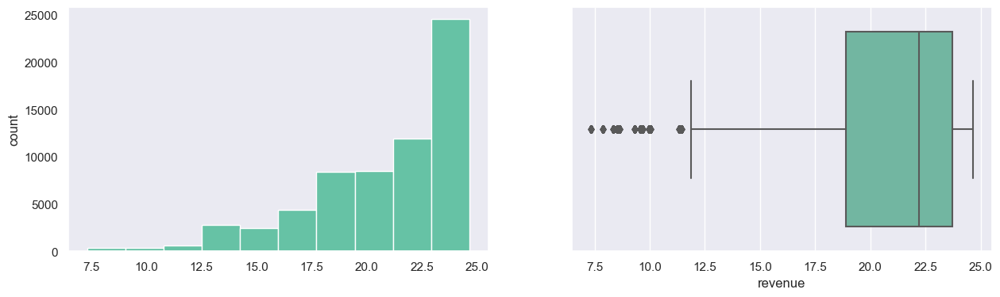

grossProfit
Skew : -0.98


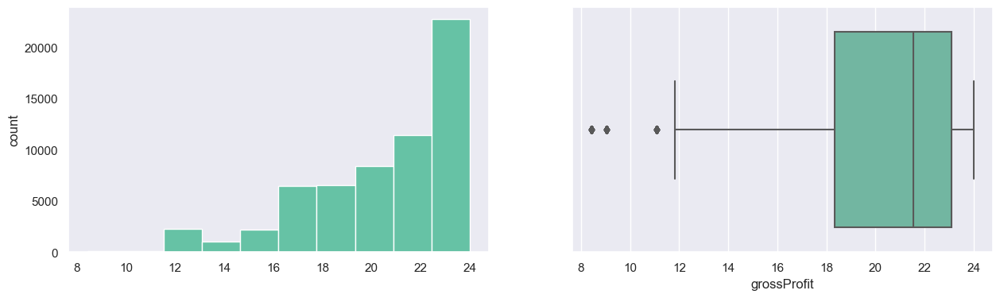

operatingExpenses
Skew : -0.71


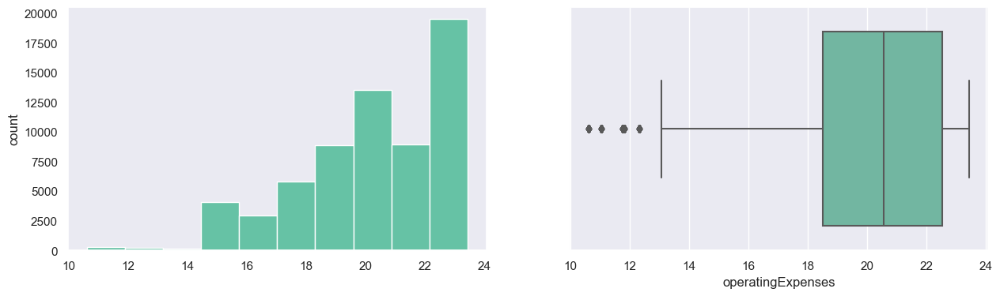

ebitda
Skew : -1.46


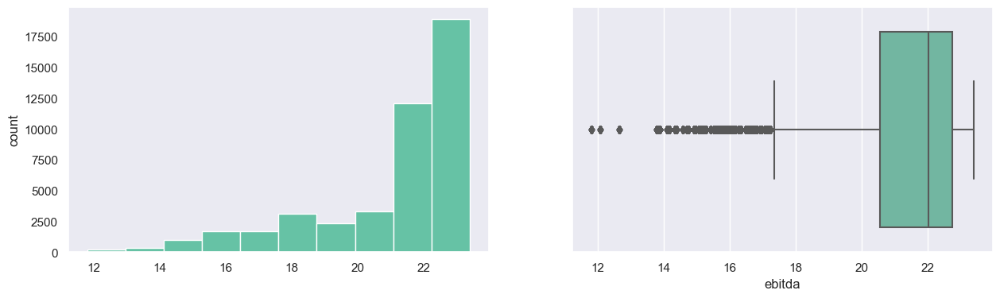

operatingIncome
Skew : -1.86


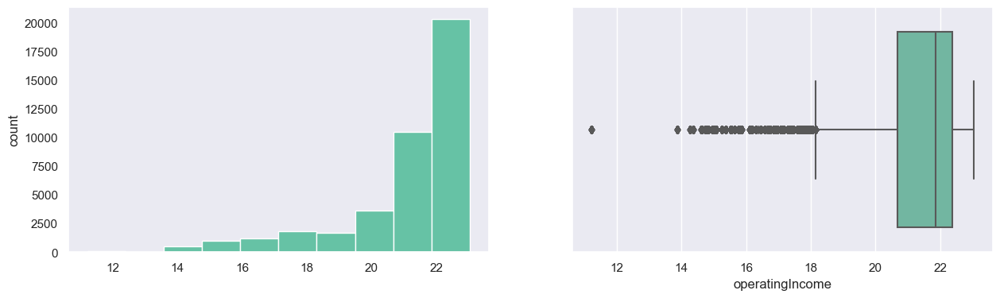

netIncome
Skew : -1.67


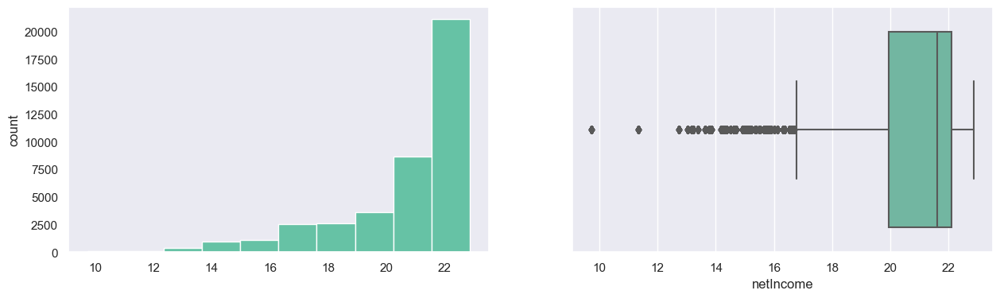

eps
Skew : -2.04


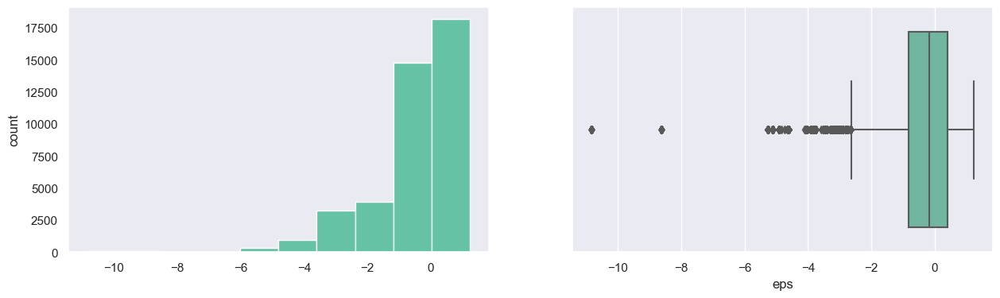

accountsReceivables
Skew : -1.06


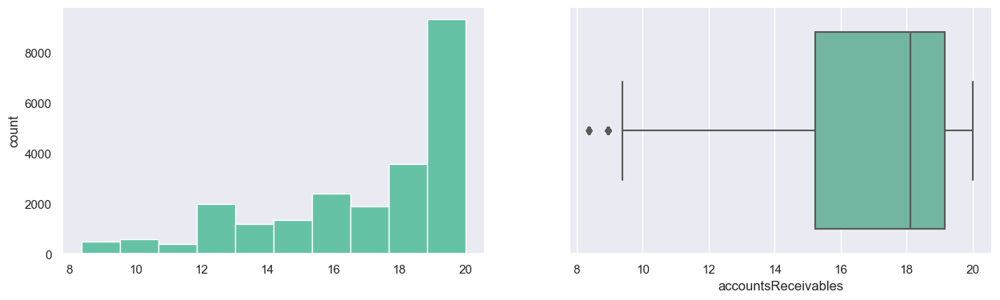

accountsPayables
Skew : -0.98


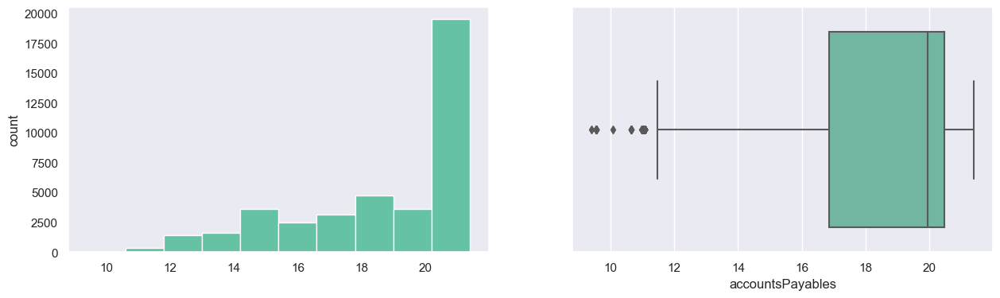

dividendsPaid
Skew : nan


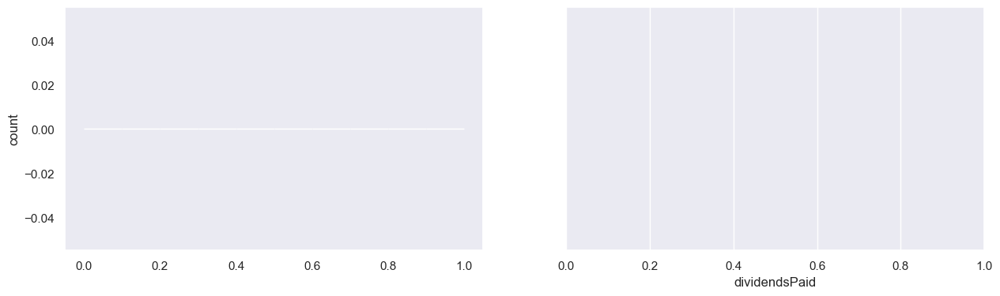

operatingCashFlow
Skew : -1.32


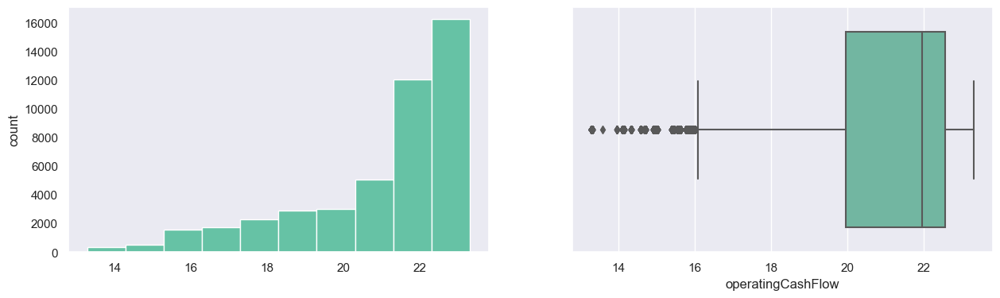

capitalExpenditure
Skew : -0.47


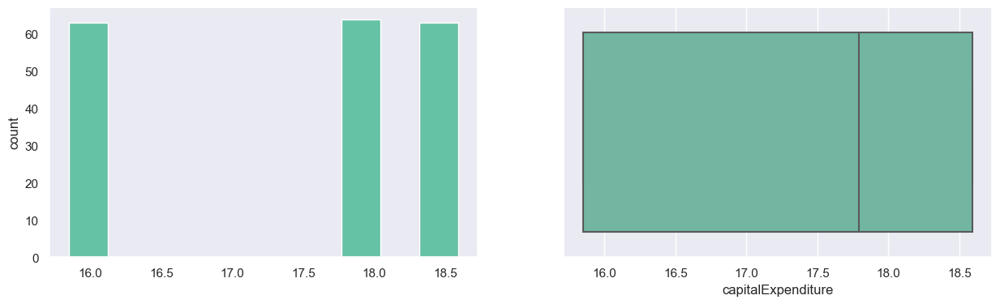

numberOfShares
Skew : -0.78


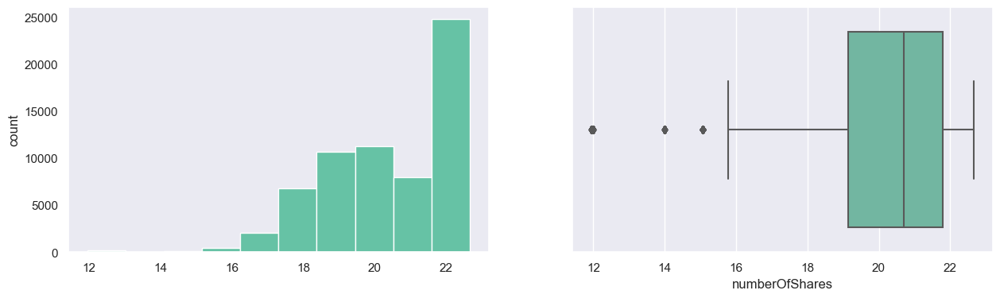

marketCapitalization
Skew : -0.88


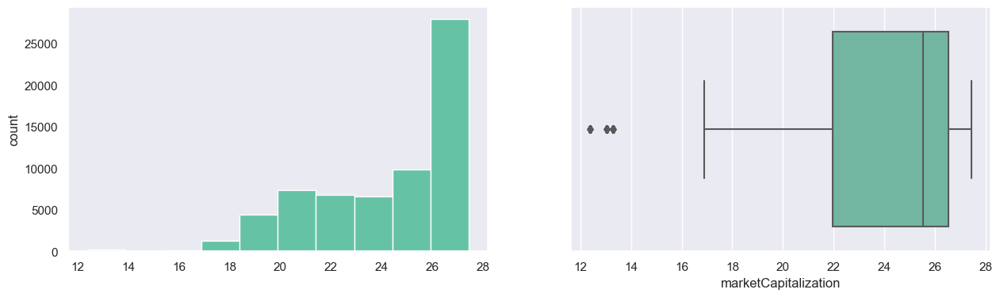

addTotalDebt
Skew : -0.98


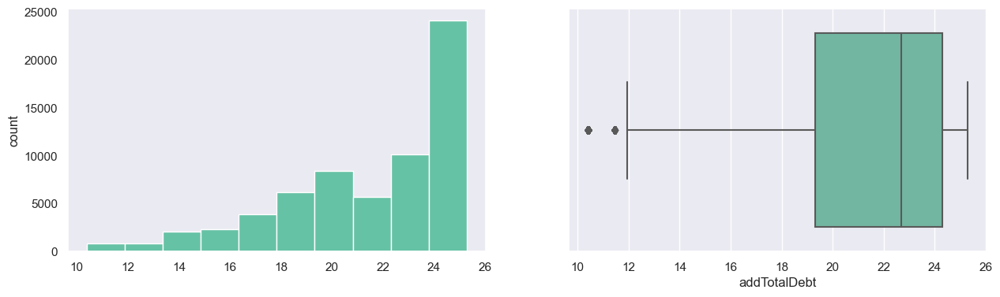

enterpriseValue
Skew : -0.85


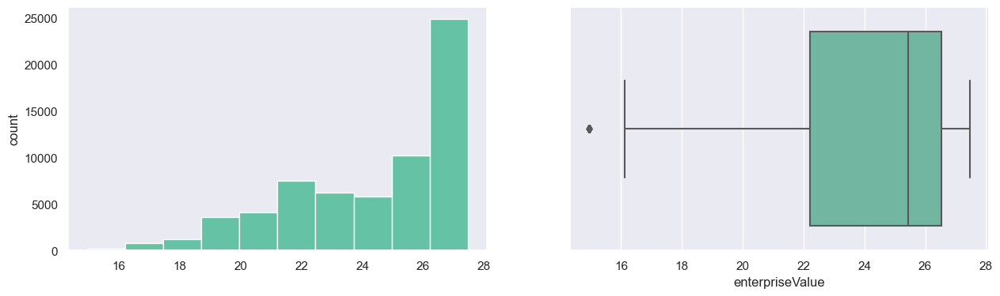

EnvironmentScore
Skew : -0.04


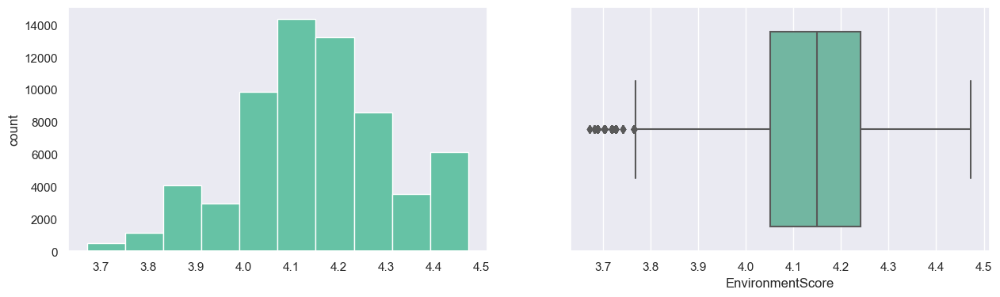

SocialScore
Skew : 0.06


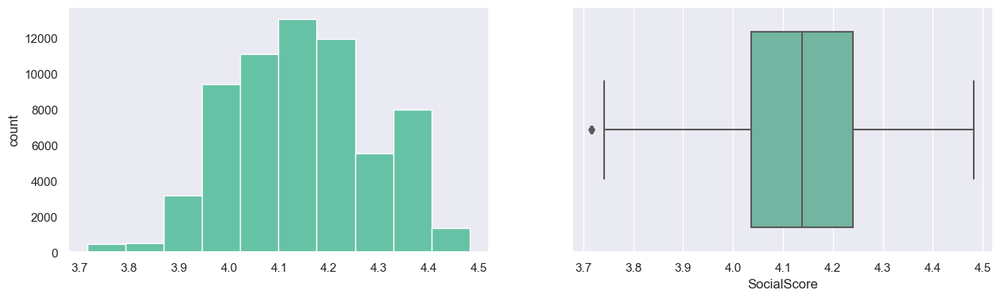

GovernanceScore
Skew : -0.36


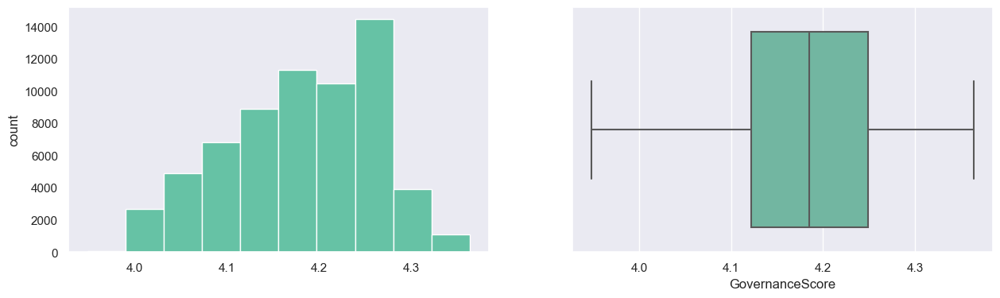

ESGscore
Skew : 0.1


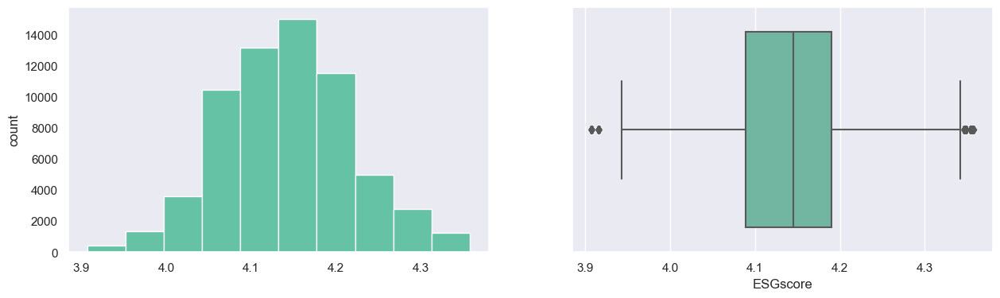

InflationRate
Skew : -0.94


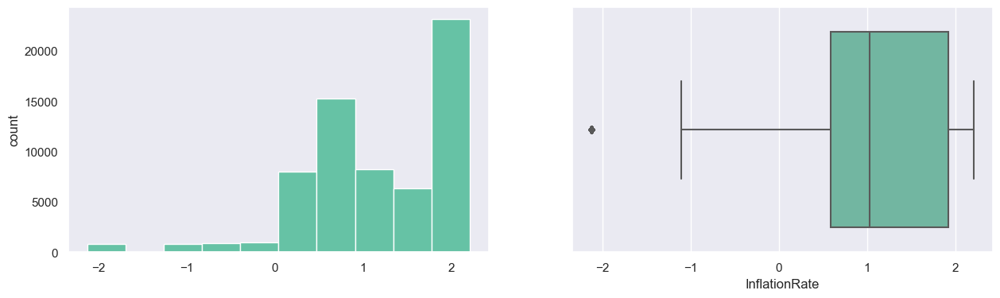

Value - T
Skew : 0.17


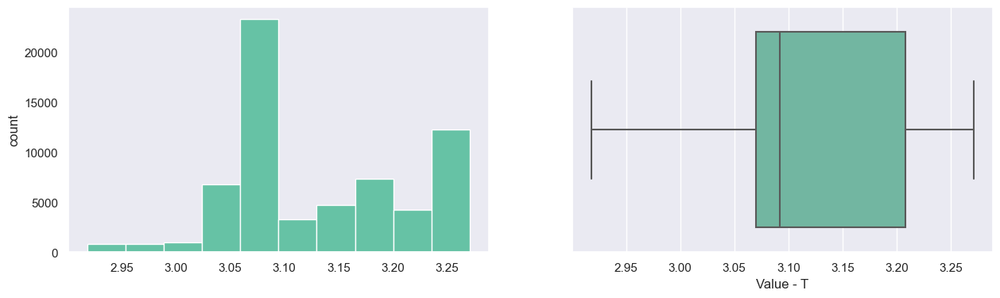

Year
Skew : -0.18


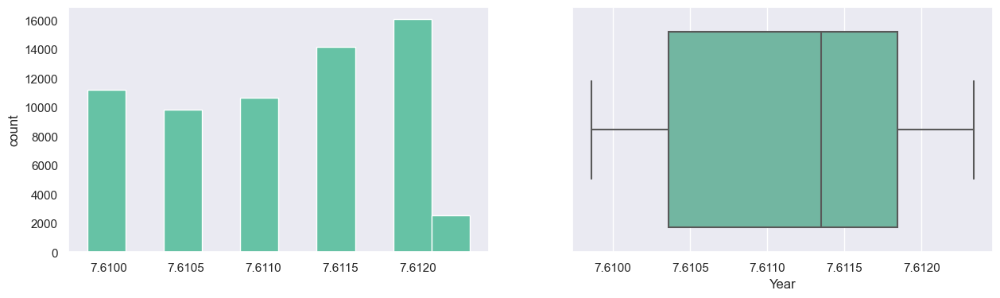

Quarter
Skew : -0.58


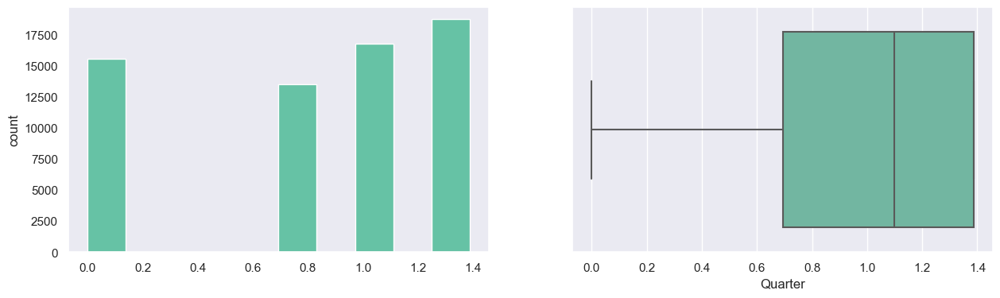

Day
Skew : -1.25


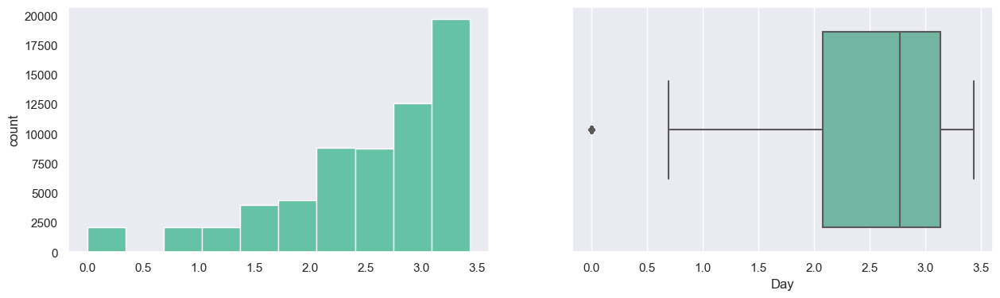

In [290]:
for col in num_cols:
    print(col)
    print('Skew :', round(df_numerical_imputed_trainset[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df_numerical_imputed_trainset[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_numerical_imputed_trainset[col])
    plt.show()

In [242]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64511 entries, 0 to 64510
Data columns (total 62 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Price Change                  64511 non-null  object        
 1   Ticker                        64511 non-null  object        
 2   Market Capitalization         64511 non-null  object        
 3   Industry                      64511 non-null  object        
 4   Sector                        64511 non-null  object        
 5   IsCovidYear                   64511 non-null  object        
 6   Date                          64511 non-null  datetime64[ns]
 7   Month                         64511 non-null  object        
 8   Day of Week                   64511 non-null  object        
 9   Close                         64511 non-null  float64       
 10  Previous Day Price            64511 non-null  float64       
 11  Volume                      

In [229]:
df_imputed.describe()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
count,64511.000000,64511.000000,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,64511.000000,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,6.451100e+04,64511.00000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,6.451100e+04,6.451100e+04,64511.000000,64511.000000,64511.000000,64511.000000,6.451100e+04,6.451100e+04,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000,64511.000000
mean,7562.917507,7562.915257,1.360951e+07,9.693370e+09,4.076660e+09,1.812470e+10,3.136110e+10,1.259974e+11,3.921187e+10,2.919060e+10,2.176029e+10,1.575852e+10,6.690282e+09,3.759633e+09,4.050613e+09,2.776821e+09,2.466806e+09,0.357541,-4.443048e+08,4.389700e+08,-1.061747e+09,3.664732e+09,-1.137974e+09,2.499903e+09,2.691278e+11,2.919199e+10,2.792739e+11,64.05049,64.004555,65.534611,64.529895,472.842673,0.602272,-0.778958,471.458573,289.344282,11.424977,2.585778e+07,5.244453e+05,84.004132,84.416609,94.147777,11.281585,5.319462e+06,6.920754e+05,177.721835,177.830703,192.962751,4.200799,22.985653,2020.336346,2.598844,15.671374
std,52195.145771,52195.146093,2.459511e+07,1.920077e+10,8.514235e+09,3.462326e+10,4.475626e+10,4.669607e+11,6.013789e+10,5.824818e+10,3.124741e+10,2.854421e+10,9.758060e+09,5.727209e+09,6.401953e+09,4.815156e+09,4.368315e+09,2.824998,3.671344e+09,4.058558e+09,1.322148e+09,1.019200e+10,2.444984e+09,3.629221e+09,4.309994e+11,5.824767e+10,4.443028e+11,11.08607,9.351319,5.128290,6.290035,1116.548911,0.178168,0.150576,513.760489,610.097000,22.805712,1.800239e+08,1.771290e+06,78.709378,75.272777,93.608354,11.868872,8.437915e+06,1.792796e+06,7513.788245,7492.237688,7542.166282,2.724230,1.951360,1.519317,1.141836,8.752785
min,0.067000,0.067000,1.000000e+00,3.774200e+04,3.096580e+05,1.870000e+05,1.227470e+05,-1.226844e+06,-9.463100e+09,3.300000e+04,4.432420e+05,-5.066550e+08,-6.865830e+08,-8.880000e+08,-6.605779e+09,-6.669379e+09,-6.674523e+09,-43.000000,-4.971900e+10,-2.780800e+10,-5.066000e+09,-1.207720e+11,-1.893500e+10,1.555150e+05,2.410360e+05,3.300000e+04,-1.574624e+08,12.47000,36.560000,51.860000,43.420000,1.000000,0.047552,-0.999999,1.000000,1.000000,1.000000,3.100000e+02,4.000000e+00,0.442067,0.402000,0.478000,1.000000,1.250000e+02,2.000000e+01,0.018975,0.110000,0.075900,0.120000,18.510000,2018.000000,1.000000,1.000000
25%,25.350000,25.340000,2.460154e+06,1.216300e+08,3.130200e+07,1.071560e+08,7.883530e+08,6.179010e+08,6.125170e+08,2.438670e+08,1.888620e+08,1.568100e+08,6.277100e+07,1.100770e+08,-5.514005e+06,-1.129400e+07,-1.235600e+07,-0.160000,-2.850000e+08,-3.228900e+06,-2.105000e+09,-4.078188e+06,-9.520000e+08,2.052330e+08,3.450538e+09,2.438670e+08,4.337522e+09,57.29000,56.600000,61.700000,60.220000,1.666667,0.452390,-0.889523,1.666667,2.000000,2.333333,3.904383e+05,2.967933e+04,30.813333,30.813333,31.793333,3.666667,5.052990e+05,6.073333e+04,6.907778,16.515000,18.280000,1.790000,21.5500

### Multivariate Analysis for numerical target against numerical variables

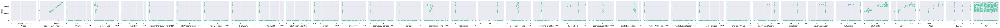

In [232]:
import seaborn as sns
import pandas as pd

# create sample dataframe
df = df_imputed

# create pair plot
sns.pairplot(df, y_vars=['Close'], x_vars=['Close',
 'Previous Day Price',
 'Volume',
 'netReceivables',
 'inventory',
 'propertyPlantEquipmentNet',
 'totalCurrentAssets',
 'totalLiabilities',
 'totalEquity',
 'totalDebt',
 'totalCurrentLiabilities',
 'revenue',
 'grossProfit',
 'operatingExpenses',
 'ebitda',
 'operatingIncome',
 'netIncome',
 'eps',
 'accountsReceivables',
 'accountsPayables',
 'dividendsPaid',
 'operatingCashFlow',
 'capitalExpenditure',
 'numberOfShares',
 'marketCapitalization',
 'addTotalDebt',
 'enterpriseValue',
 'EnvironmentScore',
 'SocialScore',
 'GovernanceScore',
 'ESGscore',
 'InflationRate',
 'Value - T',
 'Year',
 'Quarter',
 'Day'])



In [ ]:
for col in num_cols:
    print(col)
    print('Skew :', round(df_imputed[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    newstocks_df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_imputed[col])
    plt.show()

In [480]:
df_numerical_imputed_trainset

,Price Change,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
0,Decrease,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-17,March,Friday,5.043425,5.048894,17.014144,23.368109,21.318696,23.321886,24.346995,25.254491,23.682272,24.409592,24.491528,24.043725,23.206121,22.178983,22.904752,22.762908,22.591468,-1.249435,NaN,NaN,NaN,22.754987,NaN,22.411648,27.361107,24.409592,27.400549,4.314372,4.223324,4.263478,4.267737,2.437504,-0.468859,NaN,7.173703,6.198479,2.512306,15.116801,11.087535,4.602556,4.961809,4.762430,2.036882,12.674696,13.966607,2.123326,2.677820,2.293544,1.521699,3.140698,7.612337,0.0,2.833213
1,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-16,March,Thursday,5.048894,5.030373,17.048309,24.176854,21.939979,24.015792,25.145705,25.966511,24.367991,25.113019,24.721140,24.364497,23.920177,22.817466,23.187459,22.943266,22.629313,-0.210721,NaN,NaN,NaN,22.697594,NaN,22.272895,26.955950,25.113019,26.847052,4.199305,4.130141,4.181897,4.170894,2.036882,-0.267380,NaN,7.504759,1.098612,1.466337,14.996070,11.753634,3.915662,4.509540,4.003398,1.673976,15.160429,13.057772,2.101828,3.040228,2.979603,1.690096,3.158843,7.612337,0.0,2.772589
2,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-15,March,Wednesday,5.030373,5.027755,17.139131,13.663524,15.254635,12.572833,18.058376,19.149981,NaN,14.230926,16.841869,17.218806,16.841724,17.105292,NaN,NaN,NaN,NaN,15.939061,13.420985,NaN,NaN,NaN,17.359655,19.662240,14.230926,19.588532,4.467631,4.348858,4.242621,4.357222,1.299283,-0.272794,NaN,7.494245,0.287682,1.299283,14.907474,10.176145,4.605026,4.558568,4.737689,1.673976,13.016517,13.163562,2.645268,3.040228,3.393277,0.752987,3.067277,7.612337,0.0,2.708050
3,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-14,March,Tuesday,5.027755,5.013764,17.160643,13.663524,15.254635,12.572833,18.058376,19.149981,NaN,14.230926,16.841869,17.218806,16.841724,17.105292,NaN,NaN,NaN,NaN,NaN,13.420985,NaN,NaN,NaN,17.359655,19.662240,14.230926,19.588532,4.467631,4.348858,4.242621,4.357222,2.871680,-0.267380,NaN,7.504759,4.864967,3.060271,15.947264,12.596183,4.472859,4.676964,4.928340,1.466337,14.568618,12.740941,1.869963,1.003996,2.206716,0.752987,3.067277,7.612337,0.0,2.639057
4,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-13,March,Monday,5.013764,5.000585,16.948573,23.734440,21.224936,23.365119,24.533951,25.336727,23.544673,24.412745,24.661757,24.126751,23.265819,22.209004,22.968835,22.838781,22.655219,-1.149906,18.771338,NaN,NaN,22.807555,NaN,22.403448,27.412924,24.412745,27.452100,4.369743,4.235796,4.208913,4.273977,2.730029,-0.468859,NaN,7.173703,6.189860,2.564949,15.117881,11.235390,3.142758,3.894380,4.194977,2.120264,13.146539,13.816820,1.515016,-0.351924,1.984215,1.392939,3.127783,7.612337,0.0,2.564949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

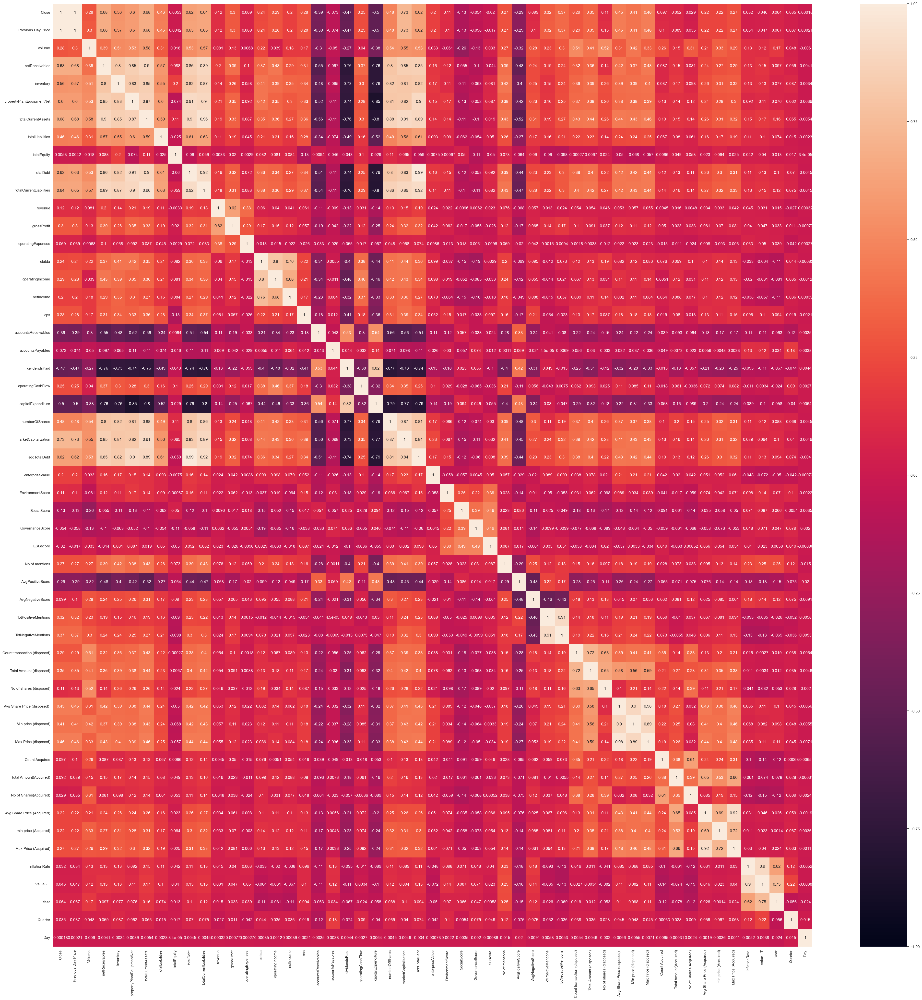

In [333]:
plt.figure(figsize=(50, 50))
sns.heatmap(df_numerical_imputed_trainset.corr(), annot = True, vmin = -1, vmax = 1)
plt.show()

creating dummies with label encoder 

In [171]:
df_numerical_imputed_trainset

,Price Change,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
0,Decrease,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-17,March,Friday,5.043425,5.048894,17.014144,23.368109,21.318696,23.321886,24.346995,25.254491,23.682272,24.409592,24.491528,24.043725,23.206121,22.178983,22.904752,22.762908,22.591468,-1.077055,-707.552388,-476.220316,-1361.999414,22.754987,-888.389969,22.411648,27.361107,24.409592,27.400549,4.314372,4.223324,4.263478,4.267737,2.437504,-0.776868,-0.896564,7.173703e+00,6.198479,2.512306e+00,15.116801,11.087535,4.602556,4.961809,4.762430,2.036882,12.674696,13.966607,2.123326,2.677820,2.293544,1.521699,3.140698,7.612337,1.000000e-10,2.833213
1,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-16,March,Thursday,5.048894,5.030373,17.048309,24.176854,21.939979,24.015792,25.145705,25.966511,24.367991,25.113019,24.721140,24.364497,23.920177,22.817466,23.187459,22.943266,22.629313,-0.595072,-783.999233,-1002.806929,-1355.439114,22.697594,-1215.141852,22.272895,26.955950,25.113019,26.847052,4.199305,4.130141,4.181897,4.170894,2.036882,-0.644233,-0.954212,7.504759e+00,1.098612,1.466337e+00,14.996070,11.753634,3.915662,4.509540,4.003398,1.673976,15.160429,13.057772,2.101828,3.040228,2.979603,1.690096,3.158843,7.612337,1.000000e-10,2.772589
2,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-15,March,Wednesday,5.030373,5.027755,17.139131,13.663524,15.254635,12.572833,18.058376,19.149981,-513.363644,14.230926,16.841869,17.218806,16.841724,17.105292,-179.752747,-183.886666,-182.044589,-0.553966,15.939061,13.420985,-1339.237704,-173.147813,-89.835089,17.359655,19.662240,14.230926,19.588532,4.467631,4.348858,4.242621,4.357222,1.299283,-0.648552,-0.954298,7.494245e+00,0.287682,1.299283e+00,14.907474,10.176145,4.605026,4.558568,4.737689,1.673976,13.016517,13.163562,2.645268,3.040228,3.393277,0.752987,3.067277,7.612337,1.000000e-10,2.708050
3,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-14,March,Tuesday,5.027755,5.013764,17.160643,13.663524,15.254635,12.572833,18.058376,19.149981,-513.363644,14.230926,16.841869,17.218806,16.841724,17.105292,-179.752747,-183.886666,-182.044589,-0.553966,-587.475032,13.420985,-1461.488859,-173.147813,-89.835089,17.359655,19.662240,14.230926,19.588532,4.467631,4.348858,4.242621,4.357222,2.871680,-0.644233,-0.954212,7.504759e+00,4.864967,3.060271e+00,15.947264,12.596183,4.472859,4.676964,4.928340,1.466337,14.568618,12.740941,1.869963,1.003996,2.206716,0.752987,3.067277,7.612337,1.000000e-10,2.639057
4,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,Covid,2023-03-13,March,Monday,5.013764,5.000585,16.948573,23.734440,21.224936,23.365119,24.533951,25.336727,23.544673,24.412745,24.661757,24.126751,23.265819,22.209004,22.968835,22.838781,22.655219,-1.047661,18.771338,-476.220316,-1533.044474,22.807555,-1031.283368,22.403448,27.412924,24.412745,27.452100,4.369743,4.235796,4.208913,4.273977,2.730029,-0.776868,-0.896564,7.173703e+00,6.189860,2.564949e+00,15.117881,11.235390,3.142758,3.894380,4.1

In [ ]:
# Select categorical columns
cat_cols = ['Sector', 'Industry', 'Tic']

# Perform one-hot encoding on categorical columns
df_encoded = pd.get_dummies(df_numerical_imputed_trainset, columns=cat_cols)

# Print the first five rows of the encoded dataset
print(df_encoded.head())


### Trainings and predictions with date

In [294]:
data = df_numerical_imputed_trainset.copy()
data =data.drop(columns=["Price Change","Previous Day Price"])
#data["Close"]
#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

In [308]:
import pandas as pd

# Disable exponentiation of values in pandas
pd.set_option('display.float_format', lambda x: f'{x:.2f}')


In [295]:
 from sklearn.preprocessing import MinMaxScaler
# One hot encode categorical data
data = pd.get_dummies(data)
#X_test_one_hot_encoded = pd.get_dummies(X_test)

# Initialize scaler
#scaler = MinMaxScaler()

# Fit scaler on training data and transform both train and test data
#X_train_scaled = scaler.fit_transform(X_train_one_hot_encoded)
#X_test_scaled = scaler.transform(X_test_one_hot_encoded)


In [293]:
data.corr()

,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day,Ticker_AAPL,Ticker_ABNB,Ticker_AMC,Ticker_AMD,Ticker_AMZN,Ticker_APPN,Ticker_AYTU,Ticker_BRK.A,Ticker_CDMO,Ticker_CLNE,Ticker_CLOV,Ticker_COIN,Ticker_DIS,Ticker_FB,Ticker_GME,Ticker_GOOGL,Ticker_HIMS,Ticker_JNJ,Ticker_JPM,Ticker_KO,Ticker_LMND,Ticker_MA,Ticker_MCD,Ticker_META,Ticker_MRNA,Ticker_MSFT,Ticker_NFLX,Ticker_NVAX,Ticker_NVDA,Ticker_PFE,Ticker_PG,Ticker_PYPL,Ticker_RBLX,Ticker_ROKU,Ticker_RUN,Ticker_SLQT,Ticker_SNOW,Ticker_SPCE,Ticker_SQ,Ticker_TDOC,Ticker_TSLA,Ticker_TTD,Ticker_UPST,Ticker_V,Ticker_WISH,Ticker_WKHS,Ticker_WMT,Ticker_XAIR,Ticker_ZM,Ticker_ZOM,Market Capitalization_Large-Cap,Market Capitalization_Large-cap,Market Capitalization_Mid-cap,Market Capitalization_Small-cap,Industry_Communication Services,Industry_Consumer Discretionary,Industry_Consumer Staples,Industry_Energy,Industry_Financials,Industry_Health Care,Industry_Industrials,Industry_Information Technology,Industry_Utilities,Sector_Advertising & Marketing,Sector_Aerospace & Defense,Sector_Application Software,Sector_Auto Manufacturers,Sector_Auto Manufacturers - Major,Sector_Banks - Diversified,Sector_Beverages - Non-Alcoholic,Sector_Biotechnology,Sector_Capital Markets,Sector_Consumer Electronics,Sector_Credit Services,Sector_Diagnostics & Research,"Sector_Discount, Variety Stores",Sector_Drug Manufacturers - General,Sector_Electronic Gaming & Multimedia,Sector_Entertainment,Sector_Entertainment - Diversified,Sector_Health Care Plans,Sector_Healthcare Services,Sector_Household & Personal Products,Sector_Insurance - Diversified,Sector_Insurance - Life,Sector_Insurance - Property & Casualty,Sector_Internet Content & Information,Sector_Internet Retail,Sector_Lodging,Sector_Medical Devices,Sector_Medical Instruments & Supplies,Sector_Oil & Gas Refining & Marketing,Sector_Pharmaceutical,Sector_Restaurants,Sector_Semiconductor - Broad Line,Sector_Semiconductor - Specialized,Sector_Social Media,Sector_Software - Application,Sector_Software - Infrastructure,Sector_Solar,Sector_Specialty Retail,"Sector_Specialty Retail, Other",IsCovidYear_Covid,IsCovidYear_NonCovid,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Day of Week_Friday,Day of Week_Monday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
Close,1.000000,0.284734,0.679572,0.562357,0.596591,0.675277,0.460742,0.005265,0.624383,0.644967,0.121209,0.300246,0.069319,0.237016,0.287313,0.195737,0.278111,-0.389808,-0.072766,-0.468766,0.252712,-0.495802,0.478770,0.727495,0.622726,0.201401,0.110243,-0.125459,-0.053853,-0.020458,0.267375,-0.290315,0.098559,0.320181,0.371222,0.289173,0.349476,0.114866,0.449535,0.410702,0.460597,0.096687,0.091649,0.028953,0.219290,0.220660,0.265489,0.032451,0.045892,0.064486,0.034858,0.000181,0.114627,0.060627,-0.136597,-0.001832,0.041475,0.002473,-0.333746,0.053864,-0.154724,-0.233521,-0.155397,0.050463,0.096639,0.022471,-0.072841,0.046960,-1.329078e-01,0.157675,0.080090,0.015714,-0.009541,0.157348,0.129420,0.127744,0.034748,0.116071,0.163090,-0.098101,0.129256,-0.021230,0.078408,0.081501,0.004113,0.069617,-0.070219,-0.134994,0.092281

In [296]:


from sklearn.model_selection import train_test_split
X = data.drop(columns=["Close"])
y = data["Close"]

# Sort the data by date
sorted_df = data.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2021-12-31'
test_start_date = '2022-01-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Close"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Close"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


In [297]:
X_train

,Date,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day,Ticker_AAPL,Ticker_ABNB,Ticker_AMC,Ticker_AMD,Ticker_AMZN,Ticker_APPN,Ticker_AYTU,Ticker_BRK.A,Ticker_CDMO,Ticker_CLNE,Ticker_CLOV,Ticker_COIN,Ticker_DIS,Ticker_FB,Ticker_GME,Ticker_GOOGL,Ticker_HIMS,Ticker_JNJ,Ticker_JPM,Ticker_KO,Ticker_LMND,Ticker_MA,Ticker_MCD,Ticker_META,Ticker_MRNA,Ticker_MSFT,Ticker_NFLX,Ticker_NVAX,Ticker_NVDA,Ticker_PFE,Ticker_PG,Ticker_PYPL,Ticker_RBLX,Ticker_ROKU,Ticker_RUN,Ticker_SLQT,Ticker_SNOW,Ticker_SPCE,Ticker_SQ,Ticker_TDOC,Ticker_TSLA,Ticker_TTD,Ticker_UPST,Ticker_V,Ticker_WISH,Ticker_WKHS,Ticker_WMT,Ticker_XAIR,Ticker_ZM,Ticker_ZOM,Market Capitalization_Large-Cap,Market Capitalization_Large-cap,Market Capitalization_Mid-cap,Market Capitalization_Small-cap,Industry_Communication Services,Industry_Consumer Discretionary,Industry_Consumer Staples,Industry_Energy,Industry_Financials,Industry_Health Care,Industry_Industrials,Industry_Information Technology,Industry_Utilities,Sector_Advertising & Marketing,Sector_Aerospace & Defense,Sector_Application Software,Sector_Auto Manufacturers,Sector_Auto Manufacturers - Major,Sector_Banks - Diversified,Sector_Beverages - Non-Alcoholic,Sector_Biotechnology,Sector_Capital Markets,Sector_Consumer Electronics,Sector_Credit Services,Sector_Diagnostics & Research,"Sector_Discount, Variety Stores",Sector_Drug Manufacturers - General,Sector_Electronic Gaming & Multimedia,Sector_Entertainment,Sector_Entertainment - Diversified,Sector_Health Care Plans,Sector_Healthcare Services,Sector_Household & Personal Products,Sector_Insurance - Diversified,Sector_Insurance - Life,Sector_Insurance - Property & Casualty,Sector_Internet Content & Information,Sector_Internet Retail,Sector_Lodging,Sector_Medical Devices,Sector_Medical Instruments & Supplies,Sector_Oil & Gas Refining & Marketing,Sector_Pharmaceutical,Sector_Restaurants,Sector_Semiconductor - Broad Line,Sector_Semiconductor - Specialized,Sector_Social Media,Sector_Software - Application,Sector_Software - Infrastructure,Sector_Solar,Sector_Specialty Retail,"Sector_Specialty Retail, Other",IsCovidYear_Covid,IsCovidYear_NonCovid,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Day of Week_Friday,Day of Week_Monday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
64510,2018-01-02,10.025307,11.147368,15.974225,12.408491,15.205583,14.051629,15.104532,12.605318,14.051629,15.859843,14.533350,14.590166,-128.744180,-129.462157,-129.491664,-0.271442,9.891111,12.941985,-102.661850,-119.530433,-23.644649,18.321056,19.109513,11.440355,19.093646,4.069710,4.096343,4.215677,4.129229,0.510826,-0.522196,-0.900140,1.000000e-10,5.108256e-01,1.000000e-10,12.599587,10.791297,1.808289,1.808289,1.808289,6.931472e-01,10.709963,12.319401,-1.171902,-1.171902,-1.171902,0.741937,3.036394,7.609862,1.000000e-10,0.693147,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
36726,2018-01-02,15.348237,17.070371,16.298248,17.

In [299]:
X_train['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

In [300]:
X_train

,Date,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day,Ticker_AAPL,Ticker_ABNB,Ticker_AMC,Ticker_AMD,Ticker_AMZN,Ticker_APPN,Ticker_AYTU,Ticker_BRK.A,Ticker_CDMO,Ticker_CLNE,Ticker_CLOV,Ticker_COIN,Ticker_DIS,Ticker_FB,Ticker_GME,Ticker_GOOGL,Ticker_HIMS,Ticker_JNJ,Ticker_JPM,Ticker_KO,Ticker_LMND,Ticker_MA,Ticker_MCD,Ticker_META,Ticker_MRNA,Ticker_MSFT,Ticker_NFLX,Ticker_NVAX,Ticker_NVDA,Ticker_PFE,Ticker_PG,Ticker_PYPL,Ticker_RBLX,Ticker_ROKU,Ticker_RUN,Ticker_SLQT,Ticker_SNOW,Ticker_SPCE,Ticker_SQ,Ticker_TDOC,Ticker_TSLA,Ticker_TTD,Ticker_UPST,Ticker_V,Ticker_WISH,Ticker_WKHS,Ticker_WMT,Ticker_XAIR,Ticker_ZM,Ticker_ZOM,Market Capitalization_Large-Cap,Market Capitalization_Large-cap,Market Capitalization_Mid-cap,Market Capitalization_Small-cap,Industry_Communication Services,Industry_Consumer Discretionary,Industry_Consumer Staples,Industry_Energy,Industry_Financials,Industry_Health Care,Industry_Industrials,Industry_Information Technology,Industry_Utilities,Sector_Advertising & Marketing,Sector_Aerospace & Defense,Sector_Application Software,Sector_Auto Manufacturers,Sector_Auto Manufacturers - Major,Sector_Banks - Diversified,Sector_Beverages - Non-Alcoholic,Sector_Biotechnology,Sector_Capital Markets,Sector_Consumer Electronics,Sector_Credit Services,Sector_Diagnostics & Research,"Sector_Discount, Variety Stores",Sector_Drug Manufacturers - General,Sector_Electronic Gaming & Multimedia,Sector_Entertainment,Sector_Entertainment - Diversified,Sector_Health Care Plans,Sector_Healthcare Services,Sector_Household & Personal Products,Sector_Insurance - Diversified,Sector_Insurance - Life,Sector_Insurance - Property & Casualty,Sector_Internet Content & Information,Sector_Internet Retail,Sector_Lodging,Sector_Medical Devices,Sector_Medical Instruments & Supplies,Sector_Oil & Gas Refining & Marketing,Sector_Pharmaceutical,Sector_Restaurants,Sector_Semiconductor - Broad Line,Sector_Semiconductor - Specialized,Sector_Social Media,Sector_Software - Application,Sector_Software - Infrastructure,Sector_Solar,Sector_Specialty Retail,"Sector_Specialty Retail, Other",IsCovidYear_Covid,IsCovidYear_NonCovid,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Day of Week_Friday,Day of Week_Monday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
64510,1514851200000000000,10.025307,11.147368,15.974225,12.408491,15.205583,14.051629,15.104532,12.605318,14.051629,15.859843,14.533350,14.590166,-128.744180,-129.462157,-129.491664,-0.271442,9.891111,12.941985,-102.661850,-119.530433,-23.644649,18.321056,19.109513,11.440355,19.093646,4.069710,4.096343,4.215677,4.129229,0.510826,-0.522196,-0.900140,1.000000e-10,5.108256e-01,1.000000e-10,12.599587,10.791297,1.808289,1.808289,1.808289,6.931472e-01,10.709963,12.319401,-1.171902,-1.171902,-1.171902,0.741937,3.036394,7.609862,1.000000e-10,0.693147,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
36726,1514851200000000000,15.348237,17.07

Model 1  - df_numerical_imputed_trainset dropping multicollinearity;no dimension reduction
data['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

In [ ]:
Dimensionality Reduction 

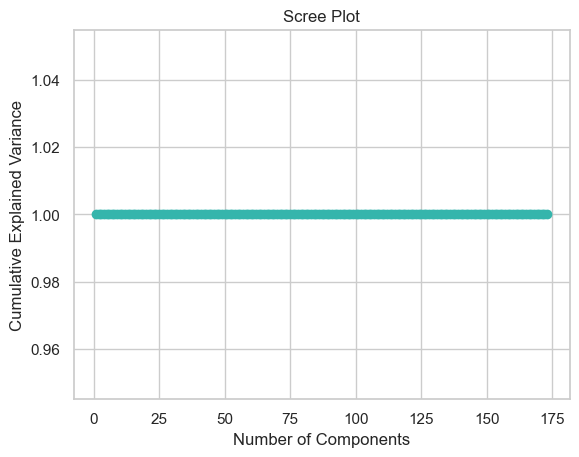

In [302]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' is your input data

# Perform PCA
pca = PCA()
pca.fit(X_train)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()


If your screeplot appears as a straight line, it suggests that all the principal components are explaining an equal amount of variance in the data. This can happen when the dataset doesn't exhibit clear dominant patterns or when the variables have a high degree of multicollinearity.

In such cases, it becomes more challenging to determine the optimal number of principal components to retain. One approach is to consider retaining a subset of the principal components that capture a significant amount of variance, such as those above a certain threshold (e.g., components with eigenvalues greater than 1).

However, it's important to note that PCA may not be the most suitable technique for dimensionality reduction in cases where the screeplot is a straight line. In such situations, you could explore other dimensionality reduction techniques, such as feature selection methods or nonlinear dimensionality reduction methods like t-SNE or UMAP, which may better capture the underlying structure of the data.

In [309]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest classifier
rf_regressor = RandomForestRegressor()

# Fit the model to the training data
rf_regressor.fit(X_train_one_hot_encoded, y_train)

# Get feature importances
importances = rf_regressor.feature_importances_

# Create a DataFrame to store feature importances
feature_importances = pd.DataFrame({'Feature': X_train_one_hot_encoded.columns, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances)


                                    Feature  Importance
11                        operatingExpenses        0.55
22                     marketCapitalization        0.19
21                           numberOfShares        0.05
1                            netReceivables        0.03
13                          operatingIncome        0.02
125           Sector_Diagnostics & Research        0.01
100                              Ticker_ZOM        0.01
9                                   revenue        0.01
8                   totalCurrentLiabilities        0.01
2                                 inventory        0.01
25                         EnvironmentScore        0.01
24                          enterpriseValue        0.01
7                                 totalDebt        0.00
23                             addTotalDebt        0.00
5                          totalLiabilities        0.00
57                              Ticker_AYTU        0.00
141   Sector_Medical Instruments & Supplies     

In [544]:
#PCA

from sklearn.decomposition import PCA

# Create PCA object with desired number of components
n_components = 1  # Choose the number of principal components
pca = PCA(n_components=n_components)

# Fit PCA on the one-hot encoded training data
pca.fit(X_train_one_hot_encoded)

# Transform the training data to its principal components
X_train_pca = pca.transform(X_train_one_hot_encoded)

# Print the explained variance ratio of each principal component
print("Explained Variance Ratio:")
for i in range(n_components):
    print("PC{}: {:.2f}%".format(i+1, pca.explained_variance_ratio_[i] * 100))

# Print the shape of the transformed data
print("Shape of X_train_pca:", X_train_pca.shape)


Explained Variance Ratio:
PC1: 100.00%
Shape of X_train_pca: (51608, 1)


In [238]:
from sklearn.decomposition import PCA

# Perform PCA with 50 components
pca = PCA(n_components=25)
X_pca = pca.fit_transform(X_train_one_hot_encoded)

# Retrieve the loadings
loadings = pca.components_

# Associate loadings with feature names
feature_names = X_train_one_hot_encoded.columns  # Assuming X is a DataFrame
loadings_with_names = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(25)], index=feature_names)


In [239]:
loadings_with_names

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100,PC101,PC102,PC103,PC104,PC105,PC106,PC107,PC108,PC109,PC110,PC111,PC112,PC113,PC114,PC115,PC116,PC117,PC118,PC119,PC120,PC121,PC122,PC123,PC124,PC125,PC126,PC127,PC128,PC129,PC130,PC131,PC132,PC133,PC134,PC135,PC136,PC137,PC138,PC139,PC140,PC141,PC142,PC143,PC144,PC145,PC146,PC147,PC148,PC149,PC150,PC151,PC152,PC153,PC154,PC155,PC156,PC157,PC158,PC159,PC160,PC161,PC162,PC163,PC164,PC165,PC166,PC167,PC168,PC169,PC170,PC171,PC172
Volume,-1.034479e-03,4.337523e-05,-1.324222e-04,-3.805053e-04,1.727219e-03,2.565635e-03,6.191927e-04,3.168940e-03,-4.964984e-03,5.929552e-04,1.552633e-03,6.820435e-04,-0.154400,0.166552,-0.249143,0.029217,0.282037,3.565044e-01,0.081992,0.222182,-0.165879,-0.268965,0.348028,-0.343990,0.370915,-0.026556,7.341091e-02,-0.097586,-0.094870,0.233297,0.070208,-0.068876,-0.081704,-0.053803,0.031969,-0.089141,-0.068866,-0.069488,-0.039518,-0.039201,-0.004187,-5.539802e-04,-0.009517,-4.116270e-03,-5.457418e-03,0.058242,0.040470,0.038531,-0.050838,-0.013011,-0.025528,0.017795,-0.000660,0.007463,-0.022098,-0.009496,-0.025201,0.013048,-0.005698,4.541776e-03,-3.252299e-03,-1.022815e-02,5.845631e-03,0.010101,0.019858,3.023473e-02,-0.025608,2.197688e-02,-0.012148,-0.013919,0.024273,0.017576,-9.140768e-03,0.003165,0.031055,-0.003791,0.015069,-0.040170,0.011267,-0.024280,-0.004088,0.011364,1.397460e-02,-0.001359,-3.060809e-03,0.023973,-0.017477,0.030743,0.021116,0.009162,0.001560,-2.680828e-02,0.016457,6.594632e-03,-0.001547,-0.018304,-0.010663,-0.006019,0.001999,0.012850,0.009246,-0.005805,-0.011736,-0.009458,-0.016659,-3.620657e-02,-0.000450,0.010546,-0.000953,-1.845083e-03,-4.892502e-04,1.014916e-05,3.170996e-04,5.423216e-04,9.582068e-08,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00
netReceivables,-3.946091e-03,1.307295e-04,6.297020e-04,-4.906384e-04,1.032743e-03,-8.037071e-05,-6.222923e-04,2.256036e-04,-2.506826e-04,-9.405142e-03,7.094961e-03,1.798220e-02,-0.185911,0.104066,-0.069067,-0.274130,-0.195295,-1.442653e-01,-0.335891,-0.382579,0.376728,0.223030,0.085561,-0.205404,0.374684,-0.149901,2.434824e-01,0.096492,0.028856,0.089272,0.041257,-0.002589,0.095450,-0.080966,-0.040218,0.032899,-0.048818,-0.085679,-0.079880,0.039382,-0.053265,-2.304455e-03,-0.007827,-2.314003e-03,-1.067224e-03,0.027449,0.078676,0.036852,0.008653,0.007479,-0.047967,0.011871,0.010759,0.018038,0.024169,-0.019108,0.030900,0.024929,0.000169,7.230787e-04,8.492894e-04,2.063060e-03,3.324174e-03,-0.028661,0.009621,2.329734e-02,-0.023266,2.741486e-02,0.007834,-0.033857,0.038421,-0.006640,-7.966428e-03,0.001642,0.015749,0.018178,0.017057,-0.007779,-0.005502,-0.020687,0.013231,0.007511,1.150073e-02,-0.006388,-5.782825e-03,0.023202,0.004220,-0.001413,-0.014184,-0.015266,-0.012299,6.033583e-03,-0.007365,1.794725e-02,0.028822,-0.013405,-0.023399,-0.000567,-0.003586,

In [310]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Step 1: Fit the PCA on the one-hot encoded training data
n_components = 50
pca = PCA(n_components=n_components)
pca.fit(X_train)

# Step 2: Get the explained variance ratio and cumulative explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Step 3: Get the original column headers
column_headers = X_train.columns

# Step 4: Transform the training data to its principal components
X_train_pca = pca.transform(X_train)

# Step 5: Create a DataFrame with the transformed data and corresponding column headers
column_headers_pca = [f"PC{i+1}" for i in range(n_components)]
X_train_pca_df = pd.DataFrame(X_train_pca, columns=column_headers_pca)

# Step 6: Map the principal components to the original column headers
component_mapping = pd.DataFrame(pca.components_.T, columns=column_headers_pca, index=column_headers)


In [311]:
component_mapping

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
Date,-1.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00
Volume,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.03,0.09,-0.19,-0.14,0.23,0.43,-0.13,0.03,0.41,0.29,0.22,0.04,-0.17,0.08,0.01,0.01,-0.30,-0.25,-0.01,0.05,-0.07,0.00,-0.08,0.13,-0.13,-0.04,0.10,0.12,-0.05,-0.03,-0.04,0.01,0.00,0.06,0.04,0.05,-0.10
netReceivables,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.01,0.01,0.02,-0.13,-0.02,-0.30,-0.16,-0.49,-0.13,0.10,0.10,-0.02,-0.13,0.32,-0.09,-0.28,-0.22,0.39,-0.09,0.11,0.02,0.06,0.17,-0.08,0.12,0.10,0.00,-0.16,-0.09,-0.00,0.05,-0.06,-0.08,-0.08,-0.02,0.03,0.01,-0.04,0.01,-0.03
inventory,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,0.07,0.24,-0.05,-0.18,0.18,0.06,0.05,-0.07,-0.01,-0.21,-0.30,-0.74,-0.14,-0.16,-0.15,0.15,0.05,0.01,0.11,0.10,-0.09,0.07,-0.00,-0.01,-0.07,-0.08,0.03,0.02,0.05,0.04,-0.00,0.05,-0.01,0.04,0.02,0.01,-0.05
propertyPlantEquipmentNet,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.01,-0.01,0.01,0.01,-0.01,0.16,-0.11,-0.12,-0.22,-0.15,0.03,-0.11,-0.11,-0.12,-0.30,-0.00,-0.16,0.50,0.11,-0.28,-0.29,-0.37,0.16,0.02,0.03,-0.07,-0.08,0.05,0.13,0.06,-0.04,0.02,0.01,0.02,0.06,0.01,-0.02,-0.06,-0.04,-0.03,0.10
totalCurrentAssets,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.01,0.16,0.37,0.02,-0.04,-0.12,-0.04,-0.06,0.08,0.10,0.03,-0.03,0.07,-0.03,-0.14,0.17,0.15,-0.06,0.12,-0.29,-0.29,0.19,0.08,-0.13,0.05,0.23,-0.07,0.06,0.22,-0.04,0.05,-0.02,0.05,-0.06,-0.08,-0.14,-0.11,0.12
totalLiabilities,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.02,-0.87,0.38,0.20,0.03,0.06,0.03,-0.03,-0.01,0.01,-0.00,0.02,0.01,-0.01,-0.01,0.00,0.02,-0.00,-0.00,0.01,-0.01,0.01,-0.01,-0.00,-0.00,-0.00,-0.00,0.00,0.01,-0.01,-0.01,0.00,-0.00,0.01,-0.01,-0.00,-0.00,0.00
totalEquity,-0.00,-0.02,-0.76,0.60,-0.23,0.05,0.08,0.02,-0.01,0.01,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00
totalDebt,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.01,0.01,0.01,0.01,0.25,-0.19,-0.27,-0.20,0.04,0.08,0.14,-0.06,-0.07,-0.01,0.19,0.13,0.14,-0.39,0.14,0.15,0.01,0.04,-0.11,-0.02,0.12,-0.08,-0.01,0.15,-0.14,-0.06,0.16,-0.06,0.02,0.05,-0.03,-0.03,0.00,-0.09,-0.17,-0.05
totalCurrentLiabilities,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.01,0.13,0.38,-0.01,-0.07,-0.06,-0.20,-0.04,0.03,-0.03,0.13,0.08,-0.10,-0.04,-0.02,0.08,-0.07,-0.18,0.11,-0.43,-0.11,-0.03,-0.06,0.11,-0.02,-0.01,0.21,0.02,-0.26,0.12,0.12,0.05,0.02,-0.08,0.19,0.29,0.13,-0.06


In [312]:
# Initialize scaler

#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date']))
scaler = MinMaxScaler()

#Fit scaler on training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [318]:
X_train

,Date,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day,Ticker_AAPL,Ticker_ABNB,Ticker_AMC,Ticker_AMD,Ticker_AMZN,Ticker_APPN,Ticker_AYTU,Ticker_BRK.A,Ticker_CDMO,Ticker_CLNE,Ticker_CLOV,Ticker_COIN,Ticker_DIS,Ticker_FB,Ticker_GME,Ticker_GOOGL,Ticker_HIMS,Ticker_JNJ,Ticker_JPM,Ticker_KO,Ticker_LMND,Ticker_MA,Ticker_MCD,Ticker_META,Ticker_MRNA,Ticker_MSFT,Ticker_NFLX,Ticker_NVAX,Ticker_NVDA,Ticker_PFE,Ticker_PG,Ticker_PYPL,Ticker_RBLX,Ticker_ROKU,Ticker_RUN,Ticker_SLQT,Ticker_SNOW,Ticker_SPCE,Ticker_SQ,Ticker_TDOC,Ticker_TSLA,Ticker_TTD,Ticker_UPST,Ticker_V,Ticker_WISH,Ticker_WKHS,Ticker_WMT,Ticker_XAIR,Ticker_ZM,Ticker_ZOM,Market Capitalization_Large-Cap,Market Capitalization_Large-cap,Market Capitalization_Mid-cap,Market Capitalization_Small-cap,Industry_Communication Services,Industry_Consumer Discretionary,Industry_Consumer Staples,Industry_Energy,Industry_Financials,Industry_Health Care,Industry_Industrials,Industry_Information Technology,Industry_Utilities,Sector_Advertising & Marketing,Sector_Aerospace & Defense,Sector_Application Software,Sector_Auto Manufacturers,Sector_Auto Manufacturers - Major,Sector_Banks - Diversified,Sector_Beverages - Non-Alcoholic,Sector_Biotechnology,Sector_Capital Markets,Sector_Consumer Electronics,Sector_Credit Services,Sector_Diagnostics & Research,"Sector_Discount, Variety Stores",Sector_Drug Manufacturers - General,Sector_Electronic Gaming & Multimedia,Sector_Entertainment,Sector_Entertainment - Diversified,Sector_Health Care Plans,Sector_Healthcare Services,Sector_Household & Personal Products,Sector_Insurance - Diversified,Sector_Insurance - Life,Sector_Insurance - Property & Casualty,Sector_Internet Content & Information,Sector_Internet Retail,Sector_Lodging,Sector_Medical Devices,Sector_Medical Instruments & Supplies,Sector_Oil & Gas Refining & Marketing,Sector_Pharmaceutical,Sector_Restaurants,Sector_Semiconductor - Broad Line,Sector_Semiconductor - Specialized,Sector_Social Media,Sector_Software - Application,Sector_Software - Infrastructure,Sector_Solar,Sector_Specialty Retail,"Sector_Specialty Retail, Other",IsCovidYear_Covid,IsCovidYear_NonCovid,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Day of Week_Friday,Day of Week_Monday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
64510,1514851200000000000,10.03,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,-0.27,9.89,12.94,-102.66,-119.53,-23.64,18.32,19.11,11.44,19.09,4.07,4.10,4.22,4.13,0.51,-0.52,-0.90,0.00,0.51,0.00,12.60,10.79,1.81,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,-1.17,0.74,3.04,7.61,0.00,0.69,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
36726,1514851200000000000,15.35,17.07,16.30,17.29,19.01,19.74,-463.18,19.67,17.62,16.08,17.06,17.79,-345.45,-351.73,-359.22,-0.83,15.83,-236.89,-102.66,-404.28,-53.13,16.64,20.38,19.67,20.66,4.23,4.05,4.19,4.16,0.51,-1.03,-0.97,0.00,0.00,2.12,16.92,12.12,4.82,4.79,

In [313]:
def evaluation(y, predictions):
    """calculate different metrics"""
    mae = mean_absolute_error(y, predictions)
    mse = mean_squared_error(y, predictions)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    r_squared = r2_score(y, predictions)
    return mae, mse, rmse, r_squared

In [314]:
def get_model_result(model, model_name, x_train=X_train_scaled, x_test=X_test_scaled,
                     y_train=y_train, y_test=y_test):
    
    train_pred = model.predict(x_train)
    test_pred = model.predict(x_test)
    
    train_mae, train_mse, train_rmse, train_r_squared = evaluation(y_train, train_pred)
    test_mae, test_mse, test_rmse, test_r_squared = evaluation(y_test, test_pred)
    
    train_result = {"Model": f"{model_name} Train",
            "MAE": round(train_mae, 2),
            "MSE": round(train_mse, 2),
            "RMSE": round(train_rmse, 2),
            "R2 Score": round(train_r_squared, 4)}
    print(train_result)


    test_result = {"Model": f"{model_name} Test",
            "MAE": round(test_mae, 2),
            "MSE": round(test_mse, 2),
            "RMSE": round(test_rmse, 2),
            "R2 Score": round(test_r_squared, 4)}
    print(test_result)
    return train_result, test_result
    
    
    
    

In [315]:
models_2 = []

In [320]:
# Linear Regression
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train_scaled, y_train)

LinearRegression(normalize=True)

In [321]:
lin_train_result, lin_test_result = get_model_result(model=lin_reg, model_name="Linear Regression")
models.append(lin_train_result)
models.append(lin_test_result)

{'Model': 'Linear Regression Train', 'MAE': 0.25, 'MSE': 0.14, 'RMSE': 0.38, 'R2 Score': 0.9426}
{'Model': 'Linear Regression Test', 'MAE': 1.06, 'MSE': 22.58, 'RMSE': 4.75, 'R2 Score': -7.8395}


In [322]:
# Ridge 
ridge = Ridge(normalize=True)
ridge.fit(X_train_scaled, y_train)

Ridge(normalize=True)

In [323]:
ridge_train_result, ridge_test_result = get_model_result(model=ridge, model_name="Ridge Regression")
models.append(ridge_train_result)
models.append(ridge_test_result)


{'Model': 'Ridge Regression Train', 'MAE': 0.4, 'MSE': 0.32, 'RMSE': 0.57, 'R2 Score': 0.873}
{'Model': 'Ridge Regression Test', 'MAE': 0.88, 'MSE': 4.54, 'RMSE': 2.13, 'R2 Score': -0.7758}


In [280]:
#Lasso algorithm
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

Lasso()

In [281]:
lasso_train_result, lasso_test_result = get_model_result(model=lasso, model_name="Lasso Regression")
models.append(lasso_train_result)
models.append(lasso_test_result)


{'Model': 'Lasso Regression Train', 'MAE': 1.25, 'MSE': 2.52, 'RMSE': 1.59, 'R2 Score': 0.0}
{'Model': 'Lasso Regression Test', 'MAE': 1.18, 'MSE': 2.56, 'RMSE': 1.6, 'R2 Score': -0.002}


In [324]:
#Gradient Boosting Regressor 
gbr = GradientBoostingRegressor()
gbr.fit(X_train_scaled, y_train)

GradientBoostingRegressor()

In [325]:
gbr_train_result, gbr_test_result = get_model_result(model=gbr, model_name="Gradient Boosting Regression")
models.append(gbr_train_result)
models.append(gbr_test_result)

{'Model': 'Gradient Boosting Regression Train', 'MAE': 0.19, 'MSE': 0.07, 'RMSE': 0.27, 'R2 Score': 0.9719}
{'Model': 'Gradient Boosting Regression Test', 'MAE': 0.52, 'MSE': 0.81, 'RMSE': 0.9, 'R2 Score': 0.6818}


In [287]:
# Elastic net regresor 
elastic = ElasticNet()
elastic.fit(X_train_scaled, y_train)

ElasticNet()

In [288]:
elastic_train_result, elastic_test_result = get_model_result(model=elastic, model_name="Elastic Regression")
models.append(elastic_train_result)
models.append(elastic_test_result)


{'Model': 'Elastic Regression Train', 'MAE': 1.25, 'MSE': 2.52, 'RMSE': 1.59, 'R2 Score': 0.0}
{'Model': 'Elastic Regression Test', 'MAE': 1.18, 'MSE': 2.56, 'RMSE': 1.6, 'R2 Score': -0.002}


In [332]:
# Support Vector Machine regressor 
svr = SVR(C=100)
svr.fit(X_train_scaled, y_train)

KeyboardInterrupt: 

In [ ]:
svr_train_result, svr_test_result = get_model_result(model=svr, model_name="SVR Regression")
models.append(svr_train_result)
models.append(svr_test_result)


In [326]:
# Random forest regressor 
rf = RandomForestRegressor(n_estimators=10)
rf.fit(X_train_scaled, y_train)

RandomForestRegressor(n_estimators=10)

In [327]:
rf_train_result, rf_test_result = get_model_result(model=rf, model_name="Random Forest Regression")
models.append(rf_train_result)
models.append(rf_test_result)


{'Model': 'Random Forest Regression Train', 'MAE': 0.01, 'MSE': 0.0, 'RMSE': 0.03, 'R2 Score': 0.9997}
{'Model': 'Random Forest Regression Test', 'MAE': 0.57, 'MSE': 0.83, 'RMSE': 0.91, 'R2 Score': 0.6746}


In [328]:
# Decision Tree Regressor 
dtr = DecisionTreeRegressor(min_samples_split=10)
dtr.fit(X_train_scaled, y_train)

DecisionTreeRegressor(min_samples_split=10)

In [329]:
dtr_train_result, dtr_test_result = get_model_result(model=dtr, model_name="Decision Tree Regression")
models.append(dtr_train_result)
models.append(dtr_test_result)

{'Model': 'Decision Tree Regression Train', 'MAE': 0.01, 'MSE': 0.0, 'RMSE': 0.03, 'R2 Score': 0.9997}
{'Model': 'Decision Tree Regression Test', 'MAE': 0.58, 'MSE': 0.91, 'RMSE': 0.96, 'R2 Score': 0.6429}


In [330]:
 # Ada Boost Regressor 
ada = AdaBoostRegressor(random_state=0, n_estimators=100)
ada.fit(X_train_scaled, y_train)

AdaBoostRegressor(n_estimators=100, random_state=0)

In [331]:
ada_train_result, ada_test_result = get_model_result(model=ada, model_name="AdaBoost Regression")
models.append(ada_train_result)
models.append(ada_test_result)

{'Model': 'AdaBoost Regression Train', 'MAE': 0.55, 'MSE': 0.41, 'RMSE': 0.64, 'R2 Score': 0.8361}
{'Model': 'AdaBoost Regression Test', 'MAE': 0.73, 'MSE': 1.17, 'RMSE': 1.08, 'R2 Score': 0.543}


In [129]:
result_df = pd.DataFrame(models)
result_df


,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.31,0.21,0.46,0.92
1,Linear Regression Test,0.31,0.21,0.46,0.92
2,Ridge Regression Train,0.45,0.43,0.65,0.83
3,Ridge Regression Test,0.46,0.44,0.66,0.83
4,Lasso Regression Train,1.23,2.53,1.59,0.00
5,Lasso Regression Test,1.23,2.55,1.60,-0.00
6,Gradient Boosting Regression Train,0.23,0.11,0.33,0.96
7,Gradient Boosting Regression Test,0.24,0.11,0.33,0.96
8,Elastic Regression Train,1.23,2.52,1.59,0.00
9,Elastic Regression Test,1.23,2.54,1.59,0.00


### Trainings and predictions without date

In [264]:
data = df_numerical_imputed_trainset.copy()
data =data.drop(columns=["Price Change","Previous Day Price"])
#data["Close"]
#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

In [265]:
 from sklearn.preprocessing import MinMaxScaler
# One hot encode categorical data
data = pd.get_dummies(data)
#X_test_one_hot_encoded = pd.get_dummies(X_test)

# Initialize scaler
#scaler = MinMaxScaler()

# Fit scaler on training data and transform both train and test data
#X_train_scaled = scaler.fit_transform(X_train_one_hot_encoded)
#X_test_scaled = scaler.transform(X_test_one_hot_encoded)


In [293]:
data.corr()

,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day,Ticker_AAPL,Ticker_ABNB,Ticker_AMC,Ticker_AMD,Ticker_AMZN,Ticker_APPN,Ticker_AYTU,Ticker_BRK.A,Ticker_CDMO,Ticker_CLNE,Ticker_CLOV,Ticker_COIN,Ticker_DIS,Ticker_FB,Ticker_GME,Ticker_GOOGL,Ticker_HIMS,Ticker_JNJ,Ticker_JPM,Ticker_KO,Ticker_LMND,Ticker_MA,Ticker_MCD,Ticker_META,Ticker_MRNA,Ticker_MSFT,Ticker_NFLX,Ticker_NVAX,Ticker_NVDA,Ticker_PFE,Ticker_PG,Ticker_PYPL,Ticker_RBLX,Ticker_ROKU,Ticker_RUN,Ticker_SLQT,Ticker_SNOW,Ticker_SPCE,Ticker_SQ,Ticker_TDOC,Ticker_TSLA,Ticker_TTD,Ticker_UPST,Ticker_V,Ticker_WISH,Ticker_WKHS,Ticker_WMT,Ticker_XAIR,Ticker_ZM,Ticker_ZOM,Market Capitalization_Large-Cap,Market Capitalization_Large-cap,Market Capitalization_Mid-cap,Market Capitalization_Small-cap,Industry_Communication Services,Industry_Consumer Discretionary,Industry_Consumer Staples,Industry_Energy,Industry_Financials,Industry_Health Care,Industry_Industrials,Industry_Information Technology,Industry_Utilities,Sector_Advertising & Marketing,Sector_Aerospace & Defense,Sector_Application Software,Sector_Auto Manufacturers,Sector_Auto Manufacturers - Major,Sector_Banks - Diversified,Sector_Beverages - Non-Alcoholic,Sector_Biotechnology,Sector_Capital Markets,Sector_Consumer Electronics,Sector_Credit Services,Sector_Diagnostics & Research,"Sector_Discount, Variety Stores",Sector_Drug Manufacturers - General,Sector_Electronic Gaming & Multimedia,Sector_Entertainment,Sector_Entertainment - Diversified,Sector_Health Care Plans,Sector_Healthcare Services,Sector_Household & Personal Products,Sector_Insurance - Diversified,Sector_Insurance - Life,Sector_Insurance - Property & Casualty,Sector_Internet Content & Information,Sector_Internet Retail,Sector_Lodging,Sector_Medical Devices,Sector_Medical Instruments & Supplies,Sector_Oil & Gas Refining & Marketing,Sector_Pharmaceutical,Sector_Restaurants,Sector_Semiconductor - Broad Line,Sector_Semiconductor - Specialized,Sector_Social Media,Sector_Software - Application,Sector_Software - Infrastructure,Sector_Solar,Sector_Specialty Retail,"Sector_Specialty Retail, Other",IsCovidYear_Covid,IsCovidYear_NonCovid,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Day of Week_Friday,Day of Week_Monday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
Close,1.000000,0.284734,0.679572,0.562357,0.596591,0.675277,0.460742,0.005265,0.624383,0.644967,0.121209,0.300246,0.069319,0.237016,0.287313,0.195737,0.278111,-0.389808,-0.072766,-0.468766,0.252712,-0.495802,0.478770,0.727495,0.622726,0.201401,0.110243,-0.125459,-0.053853,-0.020458,0.267375,-0.290315,0.098559,0.320181,0.371222,0.289173,0.349476,0.114866,0.449535,0.410702,0.460597,0.096687,0.091649,0.028953,0.219290,0.220660,0.265489,0.032451,0.045892,0.064486,0.034858,0.000181,0.114627,0.060627,-0.136597,-0.001832,0.041475,0.002473,-0.333746,0.053864,-0.154724,-0.233521,-0.155397,0.050463,0.096639,0.022471,-0.072841,0.046960,-1.329078e-01,0.157675,0.080090,0.015714,-0.009541,0.157348,0.129420,0.127744,0.034748,0.116071,0.163090,-0.098101,0.129256,-0.021230,0.078408,0.081501,0.004113,0.069617,-0.070219,-0.134994,0.092281

In [258]:


from sklearn.model_selection import train_test_split

X = data.drop(columns=["Price Change", "Close", "Previous Day Price"])
y = data["Close"]

# Sort the data by date
sorted_df = data.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2021-12-31'
test_start_date = '2022-01-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Date", "Close", "Previous Day Price"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Date","Price Change", "Close", "Previous Day Price"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


KeyError: "['Price Change'] not found in axis"

In [271]:


from sklearn.model_selection import train_test_split
X = data.drop(columns=["Close"])
y = data["Close"]

# Sort the data by date
sorted_df = data.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2021-12-31'
test_start_date = '2022-01-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Date","Close"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Date","Close"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


In [272]:
X_train

,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day,Ticker_AAPL,Ticker_ABNB,Ticker_AMC,Ticker_AMD,Ticker_AMZN,Ticker_APPN,Ticker_AYTU,Ticker_BRK.A,Ticker_CDMO,Ticker_CLNE,Ticker_CLOV,Ticker_COIN,Ticker_DIS,Ticker_FB,Ticker_GME,Ticker_GOOGL,Ticker_HIMS,Ticker_JNJ,Ticker_JPM,Ticker_KO,Ticker_LMND,Ticker_MA,Ticker_MCD,Ticker_META,Ticker_MRNA,Ticker_MSFT,Ticker_NFLX,Ticker_NVAX,Ticker_NVDA,Ticker_PFE,Ticker_PG,Ticker_PYPL,Ticker_RBLX,Ticker_ROKU,Ticker_RUN,Ticker_SLQT,Ticker_SNOW,Ticker_SPCE,Ticker_SQ,Ticker_TDOC,Ticker_TSLA,Ticker_TTD,Ticker_UPST,Ticker_V,Ticker_WISH,Ticker_WKHS,Ticker_WMT,Ticker_XAIR,Ticker_ZM,Ticker_ZOM,Market Capitalization_Large-Cap,Market Capitalization_Large-cap,Market Capitalization_Mid-cap,Market Capitalization_Small-cap,Industry_Communication Services,Industry_Consumer Discretionary,Industry_Consumer Staples,Industry_Energy,Industry_Financials,Industry_Health Care,Industry_Industrials,Industry_Information Technology,Industry_Utilities,Sector_Advertising & Marketing,Sector_Aerospace & Defense,Sector_Application Software,Sector_Auto Manufacturers,Sector_Auto Manufacturers - Major,Sector_Banks - Diversified,Sector_Beverages - Non-Alcoholic,Sector_Biotechnology,Sector_Capital Markets,Sector_Consumer Electronics,Sector_Credit Services,Sector_Diagnostics & Research,"Sector_Discount, Variety Stores",Sector_Drug Manufacturers - General,Sector_Electronic Gaming & Multimedia,Sector_Entertainment,Sector_Entertainment - Diversified,Sector_Health Care Plans,Sector_Healthcare Services,Sector_Household & Personal Products,Sector_Insurance - Diversified,Sector_Insurance - Life,Sector_Insurance - Property & Casualty,Sector_Internet Content & Information,Sector_Internet Retail,Sector_Lodging,Sector_Medical Devices,Sector_Medical Instruments & Supplies,Sector_Oil & Gas Refining & Marketing,Sector_Pharmaceutical,Sector_Restaurants,Sector_Semiconductor - Broad Line,Sector_Semiconductor - Specialized,Sector_Social Media,Sector_Software - Application,Sector_Software - Infrastructure,Sector_Solar,Sector_Specialty Retail,"Sector_Specialty Retail, Other",IsCovidYear_Covid,IsCovidYear_NonCovid,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Day of Week_Friday,Day of Week_Monday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
64510,10.025307,11.147368,15.974225,12.408491,15.205583,14.051629,15.104532,12.605318,14.051629,15.859843,14.533350,14.590166,-128.744180,-129.462157,-129.491664,-0.271442,9.891111,12.941985,-102.661850,-119.530433,-23.644649,18.321056,19.109513,11.440355,19.093646,4.069710,4.096343,4.215677,4.129229,0.510826,-0.522196,-0.900140,1.000000e-10,5.108256e-01,1.000000e-10,12.599587,10.791297,1.808289,1.808289,1.808289,6.931472e-01,10.709963,12.319401,-1.171902,-1.171902,-1.171902,0.741937,3.036394,7.609862,1.000000e-10,0.693147,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
36726,15.348237,17.070371,16.298248,17.294348,19.014195,19.743599,

In [227]:
#X_test['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 
X_train.drop('Date', axis = 1)

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
64510,ZOM,Small-cap,Health Care,Diagnostics & Research,NonCovid,January,Tuesday,10.025307,11.147368,15.974225,12.408491,15.205583,14.051629,15.104532,12.605318,14.051629,15.859843,14.533350,14.590166,-128.744180,-129.462157,-129.491664,-0.271442,9.891111,12.941985,-102.661850,-119.530433,-23.644649,18.321056,19.109513,11.440355,19.093646,4.069710,4.096343,4.215677,4.129229,0.510826,-0.522196,-0.900140,1.000000e-10,5.108256e-01,1.000000e-10,12.599587,10.791297,1.808289,1.808289,1.808289,6.931472e-01,10.709963,12.319401,-1.171902,-1.171902,-1.171902,0.741937,3.036394,7.609862,1.000000e-10,0.693147
36726,NVAX,Small-cap,Health Care,Biotechnology,NonCovid,January,Tuesday,15.348237,17.070371,16.298248,17.294348,19.014195,19.743599,-463.180542,19.669083,17.620037,16.082779,17.060522,17.788930,-345.454138,-351.727514,-359.216403,-0.833955,15.825334,-236.886877,-102.661850,-404.277021,-53.132928,16.639778,20.377448,19.669083,20.664276,4.226104,4.052307,4.187076,4.157945,0.510826,-1.026305,-0.972524,1.000000e-10,1.000000e-10,2.120264e+00,16.920608,12.124788,4.821844,4.785690,4.843755,2.961831e+00,14.268039,12.786560,3.146929,3.635567,3.385796,0.741937,3.036394,7.609862,1.000000e-10,0.693147
8435,AYTU,Small-cap,Health Care,Medical Instruments & Supplies,NonCovid,January,Tuesday,10.063691,13.504186,13.692009,12.472276,16.496189,16.178663,16.361067,12.605318,15.283824,13.316284,-80.918223,15.452514,-125.373772,-195.957352,-141.242545,-0.574890,13.376944,-53.937399,-106.589571,-159.767736,-39.687566,13.985709,21.828773,15.248689,21.824790,4.088829,4.186620,4.170534,4.149622,0.510826,-0.719521,-0.966947,6.862409e+00,5.439528e+00,1.000000e-10,12.290732,9.692849,2.915426,2.915426,2.915426,1.000000e-10,12.688736,11.225243,0.848456,0.812411,0.949081,0.741937,3.036394,7.609862,1.000000e-10,0.693147
57725,V,Large-cap,Information Technology,Credit Services,NonCovid,January,Tuesday,15.614154,22.047685,21.060452,21.584467,23.642981,24.276870,24.252651,23.728998,22.979912,22.347198,22.129363,20.427552,21.982579,21.928038,21.680699,0.113329,17.312018,17.034386,-788.373516,21.760003,-597.209262,21.443542,26.227862,23.728998,26.275753,4.032469,3.956231,4.167905,4.056123,0.510826,-0.719521,-0.961728,6.862409e+00,6.600777e+00,2.159484e+00,17.379660,12.204136,5.228364,5.228302,5.228427,2.197225e+00,15.432782,12.635676,4.383692,4.321480,4.442259,0.741937,3.036394,7.609862,1.000000e-10,0.693147
35415,NFLX,Large-cap,Communication Services,Entertainment - Diversified,NonCovid,January,Tuesday,16.200086,21.524819,21.366172,19.650122,22.779640,23.504075,22.114729,22.601566,22.515956,22.031830,21.131913,20.779838,21.523291,19.917125,19.485819,-0.737099,19.162618,18.120697,-449.794145,-618.634699,-363.338290,19.888956,25.577117,22.601566,25.607446,4.132764,4.226396,4.231930,4.198104,0.510826,-0.719521,-0.945104,6.862409e+00,6.056784e+00,1.098612e+00,15.209568,12.298786,4.053464,4.385790,5.066606,2.926739e+00,15.509023,11.431730,3.165252,3.426486,3.572899,0.741937,3.036394,7.609862,1.000000e-10,0.693147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [228]:
X_train

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
64510,ZOM,Small-cap,Health Care,Diagnostics & Research,NonCovid,1514851200000000000,January,Tuesday,10.025307,11.147368,15.974225,12.408491,15.205583,14.051629,15.104532,12.605318,14.051629,15.859843,14.533350,14.590166,-128.744180,-129.462157,-129.491664,-0.271442,9.891111,12.941985,-102.661850,-119.530433,-23.644649,18.321056,19.109513,11.440355,19.093646,4.069710,4.096343,4.215677,4.129229,0.510826,-0.522196,-0.900140,1.000000e-10,5.108256e-01,1.000000e-10,12.599587,10.791297,1.808289,1.808289,1.808289,6.931472e-01,10.709963,12.319401,-1.171902,-1.171902,-1.171902,0.741937,3.036394,7.609862,1.000000e-10,0.693147
36726,NVAX,Small-cap,Health Care,Biotechnology,NonCovid,1514851200000000000,January,Tuesday,15.348237,17.070371,16.298248,17.294348,19.014195,19.743599,-463.180542,19.669083,17.620037,16.082779,17.060522,17.788930,-345.454138,-351.727514,-359.216403,-0.833955,15.825334,-236.886877,-102.661850,-404.277021,-53.132928,16.639778,20.377448,19.669083,20.664276,4.226104,4.052307,4.187076,4.157945,0.510826,-1.026305,-0.972524,1.000000e-10,1.000000e-10,2.120264e+00,16.920608,12.124788,4.821844,4.785690,4.843755,2.961831e+00,14.268039,12.786560,3.146929,3.635567,3.385796,0.741937,3.036394,7.609862,1.000000e-10,0.693147
8435,AYTU,Small-cap,Health Care,Medical Instruments & Supplies,NonCovid,1514851200000000000,January,Tuesday,10.063691,13.504186,13.692009,12.472276,16.496189,16.178663,16.361067,12.605318,15.283824,13.316284,-80.918223,15.452514,-125.373772,-195.957352,-141.242545,-0.574890,13.376944,-53.937399,-106.589571,-159.767736,-39.687566,13.985709,21.828773,15.248689,21.824790,4.088829,4.186620,4.170534,4.149622,0.510826,-0.719521,-0.966947,6.862409e+00,5.439528e+00,1.000000e-10,12.290732,9.692849,2.915426,2.915426,2.915426,1.000000e-10,12.688736,11.225243,0.848456,0.812411,0.949081,0.741937,3.036394,7.609862,1.000000e-10,0.693147
57725,V,Large-cap,Information Technology,Credit Services,NonCovid,1514851200000000000,January,Tuesday,15.614154,22.047685,21.060452,21.584467,23.642981,24.276870,24.252651,23.728998,22.979912,22.347198,22.129363,20.427552,21.982579,21.928038,21.680699,0.113329,17.312018,17.034386,-788.373516,21.760003,-597.209262,21.443542,26.227862,23.728998,26.275753,4.032469,3.956231,4.167905,4.056123,0.510826,-0.719521,-0.961728,6.862409e+00,6.600777e+00,2.159484e+00,17.379660,12.204136,5.228364,5.228302,5.228427,2.197225e+00,15.432782,12.635676,4.383692,4.321480,4.442259,0.741937,3.036394,7.609862,1.000000e-10,0.693147
35415,NFLX,Large-cap,Communication Services,Entertainment - Diversified,NonCovid,1514851200000000000,January,Tuesday,16.200086,21.524819,21.366172,19.650122,22.779640,23.504075,22.114729,22.601566,22.515956,22.031830,21.131913,20.779838,21.523291,19.917125,19.485819,-0.737099,19.162618,18.120697,-449.794145,-618.634699,-363.338290,19.888956,25.577117,22.601566,25.607446,4.132764,4.226396,4.231930,4.198104,0.510826,-0.719521,-0.945104,6.862409e+00,6.056784e+00,1.098612e+00,15.209568,12.298786,4.053464,4.385790,5.066606,2.926739e+00,15.509023,11.431730,3.165252,3.426486,3.572899,0.741937,3.036394,7.60

Model 1  - df_numerical_imputed_trainset dropping multicollinearity;no dimension reduction
data['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

In [172]:
import copy
data_to_use = copy.deepcopy(data) 

In [173]:
# split your data to training and test set 
X = data_to_use.drop(columns=["Price Change", "Close", "Previous Day Price"])
y = data_to_use["Close"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [180]:
# split your data to training and test set 
X = data_to_use.drop(columns=["Price Change", "Close", "Previous Day Price", "Volume"])
y = data_to_use["Close"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [232]:
X_train.corr()

,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
Volume,1.000000,0.399125,0.526659,0.541012,0.589048,0.279347,0.022002,0.544931,0.586458,0.069339,0.129674,-0.004147,0.260788,0.041354,0.203630,0.169039,-0.324608,-0.061138,-0.271294,0.038379,-0.382149,0.569375,0.594774,0.556305,0.602906,-0.058965,-0.307674,-0.148332,0.025389,0.270326,-0.335017,0.321553,0.262893,0.326733,0.567374,0.463521,0.586814,0.344322,0.469867,0.366064,0.334690,0.155589,0.418378,0.218519,0.364507,0.318306,0.076345,0.050751,0.140065,0.046476,-0.005427
netReceivables,0.399125,1.000000,0.787453,0.850629,0.892412,0.527997,0.065066,0.845585,0.895079,0.194607,0.424679,0.100575,0.371963,0.415334,0.301705,0.300486,-0.570261,-0.119905,-0.773698,0.390062,-0.754704,0.815843,0.853355,0.842961,0.860831,0.200995,-0.032902,-0.078437,-0.030778,0.395085,-0.547578,0.295392,0.219541,0.266214,0.384102,0.410402,0.178845,0.433198,0.390816,0.445708,0.134508,0.143193,0.130092,0.216731,0.268564,0.283101,0.082152,0.089377,-0.006703,0.056401,-0.001021
inventory,0.526659,0.787453,1.000000,0.814615,0.840628,0.505067,0.195879,0.810936,0.865185,0.133451,0.279435,0.048688,0.394322,0.351111,0.333752,0.324676,-0.497804,-0.075737,-0.741110,0.276689,-0.748446,0.837077,0.787233,0.805558,0.794159,0.184777,-0.061710,-0.009253,0.101878,0.462340,-0.456981,0.335499,0.168561,0.236902,0.430612,0.439847,0.321579,0.388198,0.399254,0.404507,0.133534,0.160572,0.156349,0.233117,0.299470,0.312707,0.108238,0.089619,-0.009792,0.078690,-0.001451
propertyPlantEquipmentNet,0.541012,0.850629,0.814615,1.000000,0.861975,0.560766,-0.098065,0.899508,0.900072,0.205916,0.385811,0.088891,0.384919,0.300674,0.269038,0.332955,-0.535080,-0.130961,-0.749524,0.283473,-0.846258,0.822685,0.801379,0.889291,0.828613,0.262450,-0.113216,-0.010877,0.102708,0.387221,-0.484654,0.343707,0.180447,0.253565,0.427203,0.417256,0.309181,0.387288,0.400074,0.400334,0.163070,0.117049,0.175692,0.212265,0.273875,0.281120,0.056109,0.043617,0.000439,0.048330,-0.001297
totalCurrentAssets,0.589048,0.892412,0.840628,0.861975,1.000000,0.543492,0.084288,0.896074,0.962415,0.175801,0.357011,0.078576,0.346004,0.352900,0.276048,0.358984,-0.585893,-0.130884,-0.783267,0.320897,-0.795257,0.899979,0.919704,0.896727,0.921482,0.213303,-0.083804,-0.056617,0.051943,0.442084,-0.593743,0.371301,0.219822,0.287579,0.493744,0.486801,0.316469,0.459885,0.457427,0.476589,0.180914,0.142031,0.206239,0.237672,0.306946,0.318726,0.100580,0.115575,0.083678,0.070472,-0.002028
totalLiabilities,0.279347,0.527997,0.505067,0.560766,0.543492,1.000000,-0.035611,0.568119,0.587579,0.093850,0.185766,0.035328,0.184517,0.186218,0.135372,0.273959,-0.318222,-0.083913,-0.458566,0.156752,-0.476347,0.448582,0.525101,0.570757,0.543229,0.127874,-0.053060,-0.030425,0.056120,0.246617,-0.280516,0.191209,0.171308,0.210266,0.234236,0.232769,0.153022,0.226629,0.230472,0.233793,0.091804,0.067254,0.091914,0.131663,0.146279,0.163205,0.070568,0.048236,0.000730,0.005881,0.000408
totalEquity,0.022002,0.065066,0.195879,-0.098065,0.084288,-0.035611,1.000000,-0.087197,0.042546,-0.006606,-0.005209,-0.005907,0.094520,0.079627,0.083582,-0.158294,0.046544,-0.056346,-0.031683,0.098180,-0.002904,0.099101,0.054786,-0.085449,0.017666,-0.021786,0.130325,-0

In [104]:
print(f"Skewness is = {y_train.skew()}")
print(f"Kurtosis: {y_train.kurt()}")

Skewness is = -1.2263265231530063
Kurtosis: 0.9964980025320234


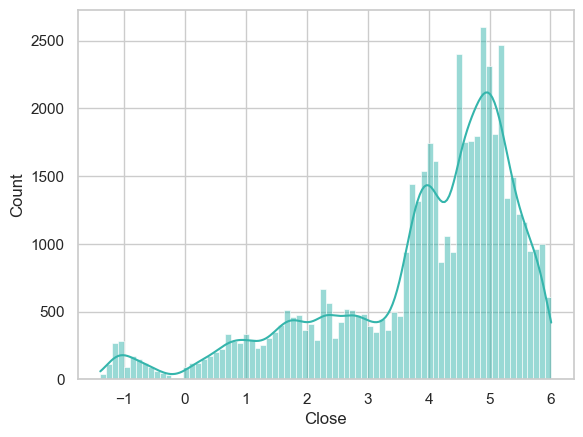

In [105]:
y_train_dist_ = sns.histplot(y_train, kde=True)

In [245]:
from sklearn.preprocessing import MinMaxScaler
# One hot encode categorical data
X_train_one_hot_encoded = pd.get_dummies(X_train)
X_test_one_hot_encoded = pd.get_dummies(X_test)

# Initialize scaler
#scaler = MinMaxScaler()

# Fit scaler on training data and transform both train and test data
#X_train_scaled = scaler.fit_transform(X_train_one_hot_encoded)
#X_test_scaled = scaler.transform(X_test_one_hot_encoded)


In [248]:
X_test

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
10049,CDMO,Small-cap,Health Care,Biotechnology,Covid,January,Monday,13.553314,17.260821,16.862601,18.487432,19.131127,19.366608,17.851078,19.024133,18.163230,17.265752,16.022355,15.576467,15.199302,14.999995,14.625551,-1.476504,-214.520293,-123.332522,-106.589571,15.462630,-271.536733,17.936676,20.874249,19.024133,20.902133,4.022490,4.178073,4.056470,4.087991,5.108256e-01,-0.421292,-0.953140,1.000000e-10,2.876821e-01,1.000000e-10,8.932609,5.860786,3.071711,3.071711,3.071711,1.000000e-10,10.699883,6.546785,1.375402,1.190888,1.541159,2.012233,3.199489,7.611842,1.000000e-10,1.098612
32020,MRNA,Large-cap,Health Care,Biotechnology,Covid,January,Monday,16.290864,21.936397,21.386984,21.110567,23.517494,23.077874,23.560881,20.668810,22.946591,22.504975,22.317184,20.360860,22.185131,22.164758,22.019909,0.641854,13.815511,-327.106631,-461.043629,21.739583,-509.164337,19.811963,24.960968,20.668810,24.899920,4.213756,4.220830,4.102313,4.180369,2.007468e+00,-0.719521,-0.961728,6.862409e+00,6.600777e+00,1.734601e+00,15.610985,11.406857,4.353310,4.318871,4.377103,1.609438e+00,14.301155,11.340855,2.696427,3.266077,3.539848,2.012233,3.199489,7.611842,1.000000e-10,1.098612
48255,SLQT,Small-cap,Financials,Insurance - Life,Covid,January,Monday,13.935597,19.320407,15.565406,18.127329,19.943466,20.660030,20.023279,20.431625,18.633338,19.432692,18.863146,18.842996,16.093905,14.948524,-186.126557,-0.341995,-268.579647,-147.803550,-102.630213,16.877920,-207.622466,18.915883,19.941925,20.431625,20.728721,3.885268,4.306629,4.307842,4.185403,1.000000e-10,-0.719521,-0.994300,6.862409e+00,1.000000e-10,1.098612e+00,12.473595,10.518871,2.227766,2.194629,2.256402,1.386294e+00,10.184900,12.111762,0.281412,2.804269,0.974560,2.012233,3.199489,7.611842,1.000000e-10,1.098612
61216,XAIR,Small-cap,Health Care,Medical Devices,Covid,January,Monday,12.509819,13.311329,12.765688,15.252973,18.347518,16.859557,18.101907,15.064552,16.186875,11.888811,-40.816551,16.111172,-269.807819,-273.377777,-271.455333,-0.932170,-154.500648,-147.803550,-102.661850,-199.163170,-69.658198,17.060765,18.959883,15.064552,18.366317,4.101155,4.040944,4.077537,4.073632,1.386294e+00,-0.385390,-0.964060,1.000000e-10,1.000000e-10,1.000000e-10,12.599587,10.791297,1.808289,1.808289,1.808289,1.000000e-10,12.628077,11.330612,1.297463,1.297463,1.297463,2.012233,3.199489,7.611842,1.000000e-10,1.098612
14794,DIS,Large-cap,Communication Services,Entertainment - Diversified,Covid,January,Monday,16.140665,23.423418,21.019660,24.210060,24.217134,25.325612,25.221563,24.714691,24.125696,23.806047,22.704543,22.343841,21.893268,21.509903,20.822206,-0.790671,-810.622225,-772.317003,-1309.399332,-585.776600,-993.626127,21.321553,26.364268,24.714691,26.496055,4.186012,4.284689,4.341725,4.272770,5.108256e-01,-0.719521,-0.945104,6.862409e+00,6.056784e+00,5.108256e-01,14.548077,9.995489,4.077802,4.057104,4.098079,1.299283e+00,13.913961,12.474486,2.963553,2.963553,2.963553,2.012233,3.199489,7.611842,1.000000e-10,1.098612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [247]:
X_test_one_hot_encoded

,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day,Ticker_AAPL,Ticker_ABNB,Ticker_AMC,Ticker_AMD,Ticker_AMZN,Ticker_APPN,Ticker_AYTU,Ticker_BRK.A,Ticker_CDMO,Ticker_CLNE,Ticker_CLOV,Ticker_COIN,Ticker_DIS,Ticker_GME,Ticker_GOOGL,Ticker_HIMS,Ticker_JNJ,Ticker_JPM,Ticker_KO,Ticker_LMND,Ticker_MA,Ticker_MCD,Ticker_META,Ticker_MRNA,Ticker_MSFT,Ticker_NFLX,Ticker_NVAX,Ticker_NVDA,Ticker_PFE,Ticker_PG,Ticker_PYPL,Ticker_RBLX,Ticker_ROKU,Ticker_RUN,Ticker_SLQT,Ticker_SNOW,Ticker_SPCE,Ticker_SQ,Ticker_TDOC,Ticker_TSLA,Ticker_TTD,Ticker_UPST,Ticker_V,Ticker_WISH,Ticker_WKHS,Ticker_WMT,Ticker_XAIR,Ticker_ZM,Ticker_ZOM,Market Capitalization_Large-Cap,Market Capitalization_Large-cap,Market Capitalization_Mid-cap,Market Capitalization_Small-cap,Industry_Communication Services,Industry_Consumer Discretionary,Industry_Consumer Staples,Industry_Energy,Industry_Financials,Industry_Health Care,Industry_Industrials,Industry_Information Technology,Industry_Utilities,Sector_Advertising & Marketing,Sector_Aerospace & Defense,Sector_Application Software,Sector_Auto Manufacturers,Sector_Auto Manufacturers - Major,Sector_Banks - Diversified,Sector_Beverages - Non-Alcoholic,Sector_Biotechnology,Sector_Capital Markets,Sector_Consumer Electronics,Sector_Credit Services,Sector_Diagnostics & Research,"Sector_Discount, Variety Stores",Sector_Drug Manufacturers - General,Sector_Electronic Gaming & Multimedia,Sector_Entertainment,Sector_Entertainment - Diversified,Sector_Health Care Plans,Sector_Healthcare Services,Sector_Household & Personal Products,Sector_Insurance - Diversified,Sector_Insurance - Life,Sector_Insurance - Property & Casualty,Sector_Internet Content & Information,Sector_Internet Retail,Sector_Lodging,Sector_Medical Devices,Sector_Medical Instruments & Supplies,Sector_Oil & Gas Refining & Marketing,Sector_Pharmaceutical,Sector_Restaurants,Sector_Semiconductor - Broad Line,Sector_Semiconductor - Specialized,Sector_Social Media,Sector_Software - Application,Sector_Software - Infrastructure,Sector_Solar,Sector_Specialty Retail,"Sector_Specialty Retail, Other",IsCovidYear_Covid,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Day of Week_Friday,Day of Week_Monday,Day of Week_Thursday,Day of Week_Tuesday,Day of Week_Wednesday
10049,13.553314,17.260821,16.862601,18.487432,19.131127,19.366608,17.851078,19.024133,18.163230,17.265752,16.022355,15.576467,15.199302,14.999995,14.625551,-1.476504,-214.520293,-123.332522,-106.589571,15.462630,-271.536733,17.936676,20.874249,19.024133,20.902133,4.022490,4.178073,4.056470,4.087991,5.108256e-01,-0.421292,-0.953140,1.000000e-10,2.876821e-01,1.000000e-10,8.932609,5.860786,3.071711,3.071711,3.071711,1.000000e-10,10.699883,6.546785,1.375402,1.190888,1.541159,2.012233,3.199489,7.611842,1.000000e-10,1.098612,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
32020,16.290864,21.936397,21.386984,21.110567,23.517494,23.077874,23.560881,20.668810,22.946591,22.504975

In [183]:
x_train_scaled

NameError: name 'x_train_scaled' is not defined

In [532]:
y_train

5653    3.26
41193   3.77
53777   5.63
23745   4.64
9730    4.52
        ... 
62570   5.58
38158   3.95
860     5.46
15795   4.71
56422   5.40
Name: Close, Length: 51608, dtype: float64

In [ ]:
Dimensionality Reduction 

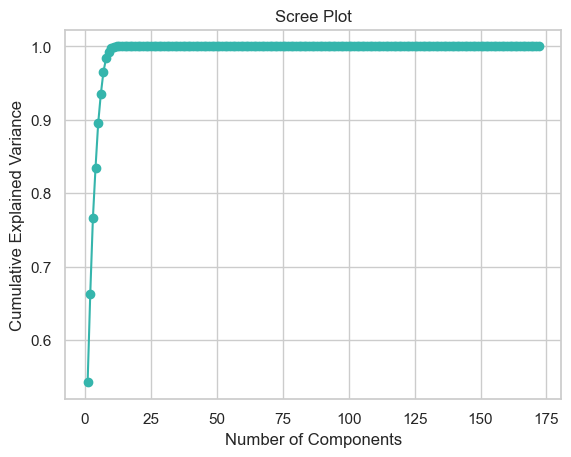

In [235]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' is your input data

# Perform PCA
pca = PCA()
pca.fit(X_train_one_hot_encoded)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()


If your screeplot appears as a straight line, it suggests that all the principal components are explaining an equal amount of variance in the data. This can happen when the dataset doesn't exhibit clear dominant patterns or when the variables have a high degree of multicollinearity.

In such cases, it becomes more challenging to determine the optimal number of principal components to retain. One approach is to consider retaining a subset of the principal components that capture a significant amount of variance, such as those above a certain threshold (e.g., components with eigenvalues greater than 1).

However, it's important to note that PCA may not be the most suitable technique for dimensionality reduction in cases where the screeplot is a straight line. In such situations, you could explore other dimensionality reduction techniques, such as feature selection methods or nonlinear dimensionality reduction methods like t-SNE or UMAP, which may better capture the underlying structure of the data.

In [536]:
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest regressor
rf_regressor = RandomForestRegressor()

# Fit the model to the training data
rf_regressor.fit(X_train_one_hot_encoded, y_train)

# Get feature importances
importances = rf_regressor.feature_importances_


In [236]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest classifier
rf_regressor = RandomForestRegressor()

# Fit the model to the training data
rf_regressor.fit(X_train_one_hot_encoded, y_train)

# Get feature importances
importances = rf_regressor.feature_importances_

# Create a DataFrame to store feature importances
feature_importances = pd.DataFrame({'Feature': X_train_one_hot_encoded.columns, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances)


                                    Feature    Importance
11                        operatingExpenses  5.494465e-01
22                     marketCapitalization  1.868328e-01
21                           numberOfShares  4.668590e-02
13                          operatingIncome  2.354111e-02
1                            netReceivables  2.346485e-02
9                                   revenue  1.568978e-02
100                              Ticker_ZOM  1.541869e-02
125           Sector_Diagnostics & Research  1.316009e-02
8                   totalCurrentLiabilities  1.070978e-02
2                                 inventory  1.030527e-02
24                          enterpriseValue  8.231678e-03
25                         EnvironmentScore  7.406629e-03
23                             addTotalDebt  4.851080e-03
5                          totalLiabilities  4.360855e-03
16                      accountsReceivables  4.251451e-03
7                                 totalDebt  4.120555e-03
112         In

In [544]:
#PCA

from sklearn.decomposition import PCA

# Create PCA object with desired number of components
n_components = 1  # Choose the number of principal components
pca = PCA(n_components=n_components)

# Fit PCA on the one-hot encoded training data
pca.fit(X_train_one_hot_encoded)

# Transform the training data to its principal components
X_train_pca = pca.transform(X_train_one_hot_encoded)

# Print the explained variance ratio of each principal component
print("Explained Variance Ratio:")
for i in range(n_components):
    print("PC{}: {:.2f}%".format(i+1, pca.explained_variance_ratio_[i] * 100))

# Print the shape of the transformed data
print("Shape of X_train_pca:", X_train_pca.shape)


Explained Variance Ratio:
PC1: 100.00%
Shape of X_train_pca: (51608, 1)


In [546]:
from sklearn.decomposition import PCA
import pandas as pd

# Create PCA object with desired number of components
n_components = 1
pca = PCA(n_components=n_components)

# Fit PCA on the one-hot encoded training data
pca.fit(X_train_one_hot_encoded)

# Transform the training data to its principal components
X_train_pca = pca.transform(X_train_one_hot_encoded)

# Create column names for the principal components
pc_column_names = ['PC{}'.format(i+1) for i in range(n_components)]

# Create a DataFrame with the transformed data and column names
X_train_pca_df = pd.DataFrame(X_train_pca, columns=pc_column_names)

# Print the DataFrame with column headers
print(X_train_pca_df.head())


                   PC1
0 70127858812587264.00
1 67622258812587264.00
2 -5126541187412736.00
3 74361458812587264.00
4 88099058812587264.00


In [527]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Step 1: Fit the PCA on the one-hot encoded training data
n_components = 50
pca = PCA(n_components=n_components)
pca.fit(X_train_one_hot_encoded)

# Step 2: Get the explained variance ratio and cumulative explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Step 3: Get the original column headers
column_headers = X_train_one_hot_encoded.columns

# Step 4: Transform the training data to its principal components
X_train_pca = pca.transform(X_train_one_hot_encoded)

# Step 5: Create a DataFrame with the transformed data and corresponding column headers
column_headers_pca = [f"PC{i+1}" for i in range(n_components)]
X_train_pca_df = pd.DataFrame(X_train_pca, columns=column_headers_pca)

# Step 6: Map the principal components to the original column headers
component_mapping = pd.DataFrame(pca.components_.T, columns=column_headers_pca, index=column_headers)


In [238]:
from sklearn.decomposition import PCA

# Perform PCA with 50 components
pca = PCA(n_components=172)
X_pca = pca.fit_transform(X_train_one_hot_encoded)

# Retrieve the loadings
loadings = pca.components_

# Associate loadings with feature names
feature_names = X_train_one_hot_encoded.columns  # Assuming X is a DataFrame
loadings_with_names = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(172)], index=feature_names)


In [239]:
loadings_with_names

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100,PC101,PC102,PC103,PC104,PC105,PC106,PC107,PC108,PC109,PC110,PC111,PC112,PC113,PC114,PC115,PC116,PC117,PC118,PC119,PC120,PC121,PC122,PC123,PC124,PC125,PC126,PC127,PC128,PC129,PC130,PC131,PC132,PC133,PC134,PC135,PC136,PC137,PC138,PC139,PC140,PC141,PC142,PC143,PC144,PC145,PC146,PC147,PC148,PC149,PC150,PC151,PC152,PC153,PC154,PC155,PC156,PC157,PC158,PC159,PC160,PC161,PC162,PC163,PC164,PC165,PC166,PC167,PC168,PC169,PC170,PC171,PC172
Volume,-1.034479e-03,4.337523e-05,-1.324222e-04,-3.805053e-04,1.727219e-03,2.565635e-03,6.191927e-04,3.168940e-03,-4.964984e-03,5.929552e-04,1.552633e-03,6.820435e-04,-0.154400,0.166552,-0.249143,0.029217,0.282037,3.565044e-01,0.081992,0.222182,-0.165879,-0.268965,0.348028,-0.343990,0.370915,-0.026556,7.341091e-02,-0.097586,-0.094870,0.233297,0.070208,-0.068876,-0.081704,-0.053803,0.031969,-0.089141,-0.068866,-0.069488,-0.039518,-0.039201,-0.004187,-5.539802e-04,-0.009517,-4.116270e-03,-5.457418e-03,0.058242,0.040470,0.038531,-0.050838,-0.013011,-0.025528,0.017795,-0.000660,0.007463,-0.022098,-0.009496,-0.025201,0.013048,-0.005698,4.541776e-03,-3.252299e-03,-1.022815e-02,5.845631e-03,0.010101,0.019858,3.023473e-02,-0.025608,2.197688e-02,-0.012148,-0.013919,0.024273,0.017576,-9.140768e-03,0.003165,0.031055,-0.003791,0.015069,-0.040170,0.011267,-0.024280,-0.004088,0.011364,1.397460e-02,-0.001359,-3.060809e-03,0.023973,-0.017477,0.030743,0.021116,0.009162,0.001560,-2.680828e-02,0.016457,6.594632e-03,-0.001547,-0.018304,-0.010663,-0.006019,0.001999,0.012850,0.009246,-0.005805,-0.011736,-0.009458,-0.016659,-3.620657e-02,-0.000450,0.010546,-0.000953,-1.845083e-03,-4.892502e-04,1.014916e-05,3.170996e-04,5.423216e-04,9.582068e-08,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00
netReceivables,-3.946091e-03,1.307295e-04,6.297020e-04,-4.906384e-04,1.032743e-03,-8.037071e-05,-6.222923e-04,2.256036e-04,-2.506826e-04,-9.405142e-03,7.094961e-03,1.798220e-02,-0.185911,0.104066,-0.069067,-0.274130,-0.195295,-1.442653e-01,-0.335891,-0.382579,0.376728,0.223030,0.085561,-0.205404,0.374684,-0.149901,2.434824e-01,0.096492,0.028856,0.089272,0.041257,-0.002589,0.095450,-0.080966,-0.040218,0.032899,-0.048818,-0.085679,-0.079880,0.039382,-0.053265,-2.304455e-03,-0.007827,-2.314003e-03,-1.067224e-03,0.027449,0.078676,0.036852,0.008653,0.007479,-0.047967,0.011871,0.010759,0.018038,0.024169,-0.019108,0.030900,0.024929,0.000169,7.230787e-04,8.492894e-04,2.063060e-03,3.324174e-03,-0.028661,0.009621,2.329734e-02,-0.023266,2.741486e-02,0.007834,-0.033857,0.038421,-0.006640,-7.966428e-03,0.001642,0.015749,0.018178,0.017057,-0.007779,-0.005502,-0.020687,0.013231,0.007511,1.150073e-02,-0.006388,-5.782825e-03,0.023202,0.004220,-0.001413,-0.014184,-0.015266,-0.012299,6.033583e-03,-0.007365,1.794725e-02,0.028822,-0.013405,-0.023399,-0.000567,-0.003586,

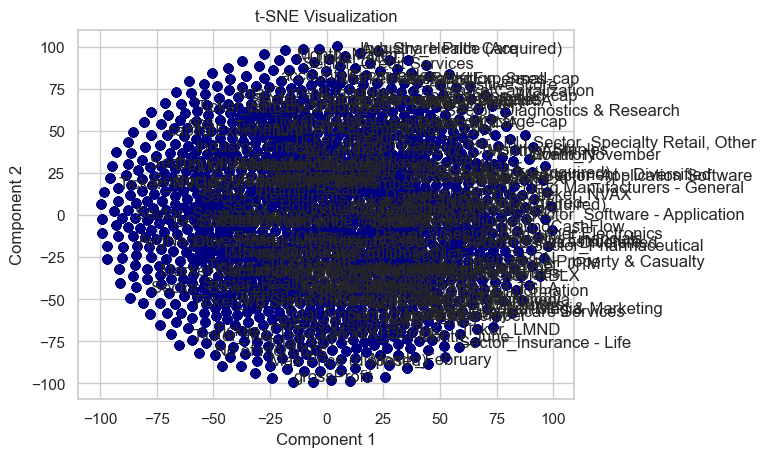

In [553]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Assuming your dataset is stored in X, with shape (n_samples, n_features)
# Assuming your original feature names are stored in feature_names as a list
feature_names= X_train_one_hot_encoded.columns.tolist()

# Instantiate the t-SNE model
tsne = TSNE(n_components=2, random_state=42)

# Perform t-SNE dimensionality reduction
X_tsne = tsne.fit_transform(X_train_one_hot_encoded)

# Plot the t-SNE results
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.title('t-SNE Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

# Annotate the data points with feature names
for i, txt in enumerate(feature_names):
    plt.annotate(txt, (X_tsne[i, 0], X_tsne[i, 1]))

plt.show()


In [554]:
from sklearn.manifold import TSNE

# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=50, random_state=42)
X_tsne = tsne.fit_transform(X_train_one_hot_encoded)

# Create a DataFrame to store the reduced features
reduced_df = pd.DataFrame(X_tsne, columns=["Feature 1", "Feature 2"])

# Print the reduced features along with their original feature names
reduced_features = reduced_df.columns.tolist()
original_features = X.columns.tolist()
for feature, original_feature in zip(reduced_features, original_features):
    print(f"{feature}: {original_feature}")


Feature 1: Ticker
Feature 2: Market Capitalization


In [528]:
component_mapping

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
Date,-1.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00
Volume,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.06,0.02,0.13,0.03,-0.30,0.24,-0.12,-0.20,-0.12,0.30,0.48,0.19,0.19,0.06,0.22,0.22,-0.20,0.13,0.00,0.00,0.10,-0.13,-0.02,0.15,0.02,-0.15,-0.13,-0.01,-0.05,0.10,0.01,0.07,0.00,0.00,0.00,0.03
netReceivables,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.01,0.01,-0.01,0.01,-0.15,0.09,-0.03,-0.16,0.11,0.23,0.29,-0.09,0.36,-0.40,0.02,0.16,-0.16,-0.24,0.23,0.08,0.17,-0.10,0.08,0.11,0.06,0.15,0.24,0.20,0.06,-0.14,-0.12,0.04,0.01,0.03,0.05,0.05,0.03,0.03,0.02,0.07
inventory,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.01,0.00,-0.10,0.09,-0.11,0.06,-0.06,0.07,-0.17,0.00,-0.04,0.09,0.08,0.16,-0.39,0.00,-0.54,-0.43,-0.01,0.19,-0.00,0.02,0.07,0.04,0.13,0.25,0.11,0.01,0.00,0.01,0.04,-0.05,0.11,0.07,-0.02,-0.02,0.03,0.01
propertyPlantEquipmentNet,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.01,0.01,-0.01,0.01,-0.15,0.11,-0.09,-0.06,0.03,0.08,-0.16,-0.08,0.02,-0.32,0.02,0.39,-0.08,0.33,-0.04,0.06,0.10,-0.20,-0.06,-0.01,0.08,-0.29,-0.34,-0.31,-0.11,0.06,0.05,0.01,0.18,-0.16,-0.11,-0.10,0.03,-0.04,-0.08,-0.09
totalCurrentAssets,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.01,-0.01,0.01,-0.20,0.14,0.01,-0.14,0.10,-0.04,-0.03,0.03,-0.11,-0.00,0.05,-0.03,-0.06,-0.24,0.14,-0.01,-0.08,0.09,-0.22,-0.16,-0.10,0.12,-0.01,-0.14,-0.02,0.09,-0.05,-0.16,-0.23,0.09,-0.03,-0.12,0.12,-0.22,0.04,-0.34
totalLiabilities,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.01,-0.01,0.01,-0.35,-0.66,-0.50,-0.31,-0.28,-0.13,0.04,-0.02,-0.01,0.02,0.02,0.00,0.00,-0.00,0.00,0.01,-0.02,0.01,0.01,0.02,0.02,0.01,0.01,-0.01,0.00,0.01,0.01,-0.00,-0.01,0.01,0.00,0.01,-0.00,0.00,0.00,-0.01
totalEquity,-0.00,-0.03,-0.42,-0.89,-0.17,0.01,0.08,0.01,-0.01,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00
totalDebt,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.01,0.01,-0.01,0.01,-0.26,0.19,-0.11,-0.10,0.08,0.17,0.06,0.13,-0.03,0.06,-0.14,-0.22,0.41,0.16,-0.17,0.02,0.13,0.05,0.07,-0.10,0.10,0.05,0.06,-0.09,0.08,0.02,-0.09,0.16,-0.06,-0.01,0.21,-0.14,-0.13,-0.14,0.11,-0.23
totalCurrentLiabilities,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.01,-0.01,0.01,-0.31,0.19,-0.06,-0.11,0.10,-0.05,-0.18,-0.04,-0.01,-0.01,0.04,0.04,-0.07,-0.17,0.04,-0.04,-0.05,-0.00,-0.11,-0.35,-0.45,-0.03,-0.09,-0.02,-0.09,-0.00,0.11,-0.08,-0.25,0.14,-0.03,0.07,-0.09,0.16,-0.07,0.27


In [273]:
# Initialize scaler

#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date']))
scaler = MinMaxScaler()

#Fit scaler on training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [274]:
def evaluation(y, predictions):
    """calculate different metrics"""
    mae = mean_absolute_error(y, predictions)
    mse = mean_squared_error(y, predictions)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    r_squared = r2_score(y, predictions)
    return mae, mse, rmse, r_squared

In [275]:
def get_model_result(model, model_name, x_train=X_train_scaled, x_test=X_test_scaled,
                     y_train=y_train, y_test=y_test):
    
    train_pred = model.predict(x_train)
    test_pred = model.predict(x_test)
    
    train_mae, train_mse, train_rmse, train_r_squared = evaluation(y_train, train_pred)
    test_mae, test_mse, test_rmse, test_r_squared = evaluation(y_test, test_pred)
    
    train_result = {"Model": f"{model_name} Train",
            "MAE": round(train_mae, 2),
            "MSE": round(train_mse, 2),
            "RMSE": round(train_rmse, 2),
            "R2 Score": round(train_r_squared, 4)}
    print(train_result)


    test_result = {"Model": f"{model_name} Test",
            "MAE": round(test_mae, 2),
            "MSE": round(test_mse, 2),
            "RMSE": round(test_rmse, 2),
            "R2 Score": round(test_r_squared, 4)}
    print(test_result)
    return train_result, test_result
    
    
    
    

In [175]:
def get_model_result(model, model_name, x_train=X_train_scaled, x_test=X_test_scaled,
                     y_train=y_train, y_test=y_test):
  """Use model to predict train and test set, then evaluate the predictions"""

  train_pred = model.predict(x_train)
  test_pred = model.predict(x_test)


  train_mae, train_mse, train_rmse, train_r_squared = evaluation(y_train, train_pred)
  test_mae, test_mse, test_rmse, test_r_squared = evaluation(y_test, test_pred)


  train_result = {"Model": f"{model_name} Train",
            "MAE": round(train_mae, 2),
            "MSE": round(train_mse, 2),
            "RMSE": round(train_rmse, 2),
            "R2 Score": round(train_r_squared, 4)}
  print(train_result)


  test_result = {"Model": f"{model_name} Test",
            "MAE": round(test_mae, 2),
            "MSE": round(test_mse, 2),
            "RMSE": round(test_rmse, 2),
            "R2 Score": round(test_r_squared, 4)}
  print(test_result)
  return train_result, test_result

In [112]:
models = []

In [289]:
# Linear Regression
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train_scaled, y_train)

LinearRegression(normalize=True)

In [290]:
lin_train_result, lin_test_result = get_model_result(model=lin_reg, model_name="Linear Regression")
models.append(lin_train_result)
models.append(lin_test_result)

{'Model': 'Linear Regression Train', 'MAE': 0.25, 'MSE': 0.14, 'RMSE': 0.38, 'R2 Score': 0.9426}
{'Model': 'Linear Regression Test', 'MAE': 1.06, 'MSE': 22.59, 'RMSE': 4.75, 'R2 Score': -7.844}


In [291]:
# Ridge 
ridge = Ridge(normalize=True)
ridge.fit(X_train_scaled, y_train)

Ridge(normalize=True)

In [292]:
ridge_train_result, ridge_test_result = get_model_result(model=ridge, model_name="Ridge Regression")
models.append(ridge_train_result)
models.append(ridge_test_result)


{'Model': 'Ridge Regression Train', 'MAE': 0.4, 'MSE': 0.32, 'RMSE': 0.57, 'R2 Score': 0.8725}
{'Model': 'Ridge Regression Test', 'MAE': 0.86, 'MSE': 4.54, 'RMSE': 2.13, 'R2 Score': -0.7789}


In [280]:
#Lasso algorithm
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

Lasso()

In [281]:
lasso_train_result, lasso_test_result = get_model_result(model=lasso, model_name="Lasso Regression")
models.append(lasso_train_result)
models.append(lasso_test_result)


{'Model': 'Lasso Regression Train', 'MAE': 1.25, 'MSE': 2.52, 'RMSE': 1.59, 'R2 Score': 0.0}
{'Model': 'Lasso Regression Test', 'MAE': 1.18, 'MSE': 2.56, 'RMSE': 1.6, 'R2 Score': -0.002}


In [119]:
#Gradient Boosting Regressor 
gbr = GradientBoostingRegressor()
gbr.fit(X_train_scaled, y_train)

GradientBoostingRegressor()

In [120]:
gbr_train_result, gbr_test_result = get_model_result(model=gbr, model_name="Gradient Boosting Regression")
models.append(gbr_train_result)
models.append(gbr_test_result)

{'Model': 'Gradient Boosting Regression Train', 'MAE': 0.23, 'MSE': 0.11, 'RMSE': 0.33, 'R2 Score': 0.96}
{'Model': 'Gradient Boosting Regression Test', 'MAE': 0.24, 'MSE': 0.11, 'RMSE': 0.33, 'R2 Score': 0.96}


In [287]:
# Elastic net regresor 
elastic = ElasticNet()
elastic.fit(X_train_scaled, y_train)

ElasticNet()

In [288]:
elastic_train_result, elastic_test_result = get_model_result(model=elastic, model_name="Elastic Regression")
models.append(elastic_train_result)
models.append(elastic_test_result)


{'Model': 'Elastic Regression Train', 'MAE': 1.25, 'MSE': 2.52, 'RMSE': 1.59, 'R2 Score': 0.0}
{'Model': 'Elastic Regression Test', 'MAE': 1.18, 'MSE': 2.56, 'RMSE': 1.6, 'R2 Score': -0.002}


In [ ]:
# Support Vector Machine regressor 
svr = SVR(C=100000)
svr.fit(X_train_scaled, y_train)

In [ ]:
svr_train_result, svr_test_result = get_model_result(model=svr, model_name="SVR Regression")
models.append(svr_train_result)
models.append(svr_test_result)


In [283]:
# Random forest regressor 
rf = RandomForestRegressor(n_estimators=10)
rf.fit(X_train_scaled, y_train)

RandomForestRegressor(n_estimators=10)

In [284]:
rf_train_result, rf_test_result = get_model_result(model=rf, model_name="Random Forest Regression")
models.append(rf_train_result)
models.append(rf_test_result)


{'Model': 'Random Forest Regression Train', 'MAE': 0.01, 'MSE': 0.0, 'RMSE': 0.03, 'R2 Score': 0.9996}
{'Model': 'Random Forest Regression Test', 'MAE': 0.56, 'MSE': 0.86, 'RMSE': 0.93, 'R2 Score': 0.6635}


In [285]:
# Decision Tree Regressor 
dtr = DecisionTreeRegressor(min_samples_split=10)
dtr.fit(X_train_scaled, y_train)

DecisionTreeRegressor(min_samples_split=10)

In [286]:
dtr_train_result, dtr_test_result = get_model_result(model=dtr, model_name="Decision Tree Regression")
models.append(dtr_train_result)
models.append(dtr_test_result)

{'Model': 'Decision Tree Regression Train', 'MAE': 0.02, 'MSE': 0.0, 'RMSE': 0.04, 'R2 Score': 0.9995}
{'Model': 'Decision Tree Regression Test', 'MAE': 0.65, 'MSE': 1.06, 'RMSE': 1.03, 'R2 Score': 0.5853}


In [127]:
 # Ada Boost Regressor 
ada = AdaBoostRegressor(random_state=0, n_estimators=100)
ada.fit(X_train_scaled, y_train)

AdaBoostRegressor(n_estimators=100, random_state=0)

In [128]:
ada_train_result, ada_test_result = get_model_result(model=ada, model_name="AdaBoost Regression")
models.append(ada_train_result)
models.append(ada_test_result)

{'Model': 'AdaBoost Regression Train', 'MAE': 0.53, 'MSE': 0.45, 'RMSE': 0.67, 'R2 Score': 0.82}
{'Model': 'AdaBoost Regression Test', 'MAE': 0.53, 'MSE': 0.44, 'RMSE': 0.67, 'R2 Score': 0.83}


In [129]:
result_df = pd.DataFrame(models)
result_df


,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.31,0.21,0.46,0.92
1,Linear Regression Test,0.31,0.21,0.46,0.92
2,Ridge Regression Train,0.45,0.43,0.65,0.83
3,Ridge Regression Test,0.46,0.44,0.66,0.83
4,Lasso Regression Train,1.23,2.53,1.59,0.00
5,Lasso Regression Test,1.23,2.55,1.60,-0.00
6,Gradient Boosting Regression Train,0.23,0.11,0.33,0.96
7,Gradient Boosting Regression Test,0.24,0.11,0.33,0.96
8,Elastic Regression Train,1.23,2.52,1.59,0.00
9,Elastic Regression Test,1.23,2.54,1.59,0.00


In [131]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

# specify the hyperparameters and their values
# n_estimators = indicates the number of decision trees used in the random forest model
# max depth = maximum number of levels in the decision trees
# min_samples_Split = Minimum number of samples required to split a node
param_grid = {'n_estimators': [3, 5, 10], 'max_depth': [2, 4, 6, 8]}
forest_reg = RandomForestRegressor()

# start a new timer
rf_start=time.time()

# we'll use 10-fold cross-validation with 10 random combinations to try
# we also want to get the train score for later
rf_random_grid_search = RandomizedSearchCV(forest_reg, param_grid, cv=10, n_iter=10, scoring='neg_mean_squared_error', random_state=8, return_train_score=True)

# fit the estimator on the training set
rf_random_grid_search.fit(X_train_scaled, y_train)

RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(),
                   param_distributions={'max_depth': [2, 4, 6, 8],
                                        'n_estimators': [3, 5, 10]},
                   random_state=8, return_train_score=True,
                   scoring='neg_mean_squared_error')

In [132]:
# the best random forest model
best_rf = rf_random_grid_search.best_estimator_
best_rf

RandomForestRegressor(max_depth=8, n_estimators=10)

In [134]:
#Create a function to display the RMSE scores
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())



In [136]:
#Use cross-validation to find the average score for this model.
rf_cv_scores= cross_val_score(best_rf, X_train_scaled, y_train, scoring="neg_mean_squared_error", cv=10)
rf_cv_rmse_scores = np.sqrt(-rf_cv_scores)
display_scores(rf_cv_rmse_scores)

Scores: [0.30107293 0.28439438 0.29006232 0.31493919 0.28230202 0.26180312
 0.296173   0.31378766 0.28147644 0.29337672]
Mean: 0.29193877741747587
Standard deviation: 0.015102140302988917


In [137]:
#training and validation RMSE
val_scores = rf_random_grid_search.cv_results_["mean_test_score"]
train_scores = rf_random_grid_search.cv_results_["mean_train_score"]
params = rf_random_grid_search.cv_results_["params"]
for val_score, train_score, param in zip(val_scores, train_scores, params):
    print(np.sqrt(-val_score), np.sqrt(-train_score), param)

0.45838945729560865 0.4558550353344533 {'n_estimators': 5, 'max_depth': 6}
0.30415053597027836 0.2994506257416343 {'n_estimators': 3, 'max_depth': 8}
0.29654269705391856 0.2908875798317188 {'n_estimators': 5, 'max_depth': 8}
0.4478743147256778 0.4453725057496438 {'n_estimators': 10, 'max_depth': 6}
0.464267713686373 0.46191293927149946 {'n_estimators': 3, 'max_depth': 6}
0.2896448812212296 0.28511803275350805 {'n_estimators': 10, 'max_depth': 8}
0.9127247074400983 0.90991645401231 {'n_estimators': 3, 'max_depth': 2}
0.8650479247679637 0.8640901756556453 {'n_estimators': 10, 'max_depth': 2}
0.6498767140934715 0.6481195592025029 {'n_estimators': 10, 'max_depth': 4}
0.8848504579209613 0.8854312408430081 {'n_estimators': 5, 'max_depth': 2}


In [138]:
# the best model's RMSE
rf_rmse_score=np.sqrt(-rf_random_grid_search.best_score_)
print(f'The best Random Forest model has a RMSE of: {rf_rmse_score}')

The best Random Forest model has a RMSE of: 0.2896448812212296


In [139]:
# make predictions
rf_yhat = best_rf.predict(X_train_scaled)

# Calculate how much time it took to tune the hyperparameters and train the model
rf_duration = time.time() - rf_start
print(f'The Random Forest model took {rf_duration:.3f} seconds')

The Random Forest model took 631.458 seconds


<AxesSubplot:title={'center':'Actual vs Predicted- Random Forest'}>

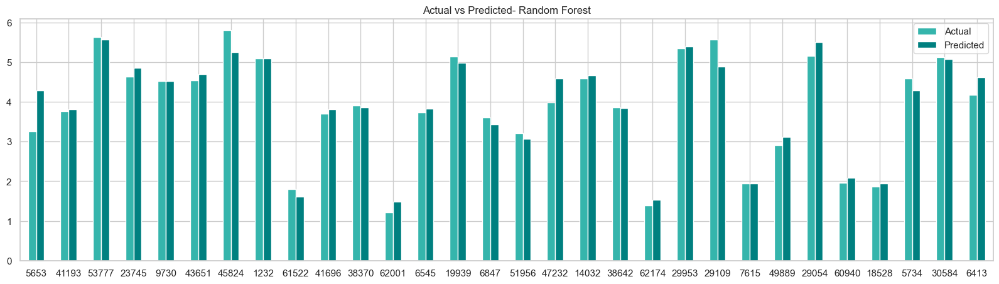

In [140]:
# create a temporary dataframe containing two columns
rf_df_tmp = pd.DataFrame({"Actual": y_train[:30], "Predicted": rf_yhat[:30]})
# plot the dataframe
rf_df_tmp.plot(figsize=(20,5), kind="bar", rot=0,title = 'Actual vs Predicted- Random Forest' )

In [143]:
r2 = r2_score(y_train, rf_yhat)
print("R2 Score:", r2)

R2 Score: 0.9716209542529474


In [153]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Train the Random Forest Regressor
model = RandomForestRegressor()
model.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = model.predict(X_test_scaled)

# Calculate RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)

# Calculate MAE
mae = mean_absolute_error(y_test, y_pred)

# Calculate MSE
mse = mean_squared_error(y_test, y_pred)

# Calculate R2 score
r2 = r2_score(y_test, y_pred)

# Print the results
print("Test Data Results:")
print("RMSE:", rmse)
print("MAE:", mae)
print("MSE:", mse)
print("R2 Score:", r2)

# Perform cross-validation
scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='r2')

# Print the cross-validation results
print("Cross-Validation Results:")
print("R2 Scores:", scores)
print("Mean R2 Score:", scores.mean())


Test Data Results:
RMSE: 0.06660739964229262
MAE: 0.030831859847699088
MSE: 0.004436545687108083
R2 Score: 0.998258192901486
Cross-Validation Results:
R2 Scores: [0.99768586 0.99717912 0.9979564  0.99709406 0.99754459]
Mean R2 Score: 0.9974920054808066


In [157]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define the parameter grid
param_grid = {
    'n_estimators': [3, 5, 10],
    'max_depth': [None, 5, 10]
}

# Create the Random Forest Regressor
model = RandomForestRegressor()

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)

# Get the best model and its hyperparameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# Predict on the test data using the best model
y_pred = best_model.predict(X_test_scaled)

# Calculate evaluation metrics
rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the results
print("Best Hyperparameters:", best_params)
print("Test Data Results:")
print("RMSE:", rmse)
print("MAE:", mae)
print("MSE:", mse)
print("R2 Score:", r2)


Best Hyperparameters: {'max_depth': None, 'n_estimators': 10}
Test Data Results:
RMSE: 0.07347126215998923
MAE: 0.03340587852019982
MSE: 0.005398026363381864
R2 Score: 0.9978807114136058


In [159]:
# Predict on the training data using the best model
y_train_pred = best_model.predict(X_train_scaled)

# Calculate evaluation metrics for training data
train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Print the results for training data
print("\nTraining Data Results:")
print("RMSE:", train_rmse)
print("MAE:", train_mae)
print("MSE:", train_mse)
print("R2 Score:", train_r2)



Training Data Results:
RMSE: 0.034353698311304526
MAE: 0.013915915412409217
MSE: 0.0011801765876641272
R2 Score: 0.9995329736141406


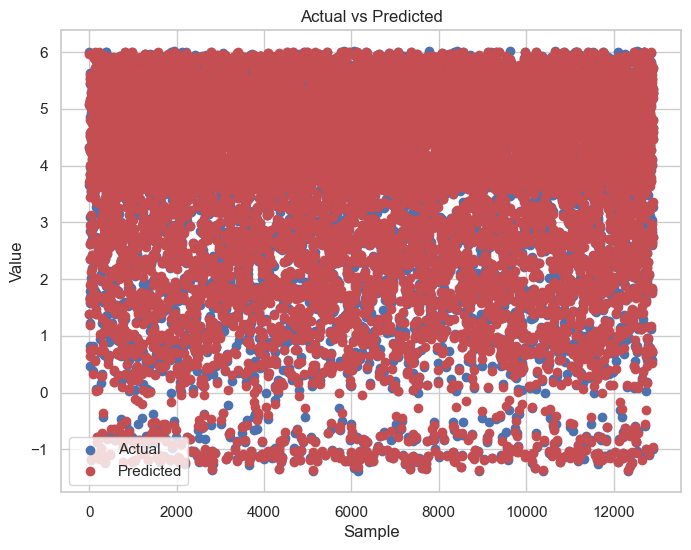

In [158]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(8, 6))
plt.scatter(range(len(y_test)), y_test, color='b', label='Actual')
plt.scatter(range(len(y_test)), y_pred, color='r', label='Predicted')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Actual vs Predicted')
plt.legend()
plt.show()


<AxesSubplot:title={'center':'Actual vs Predicted- Random Forest'}>

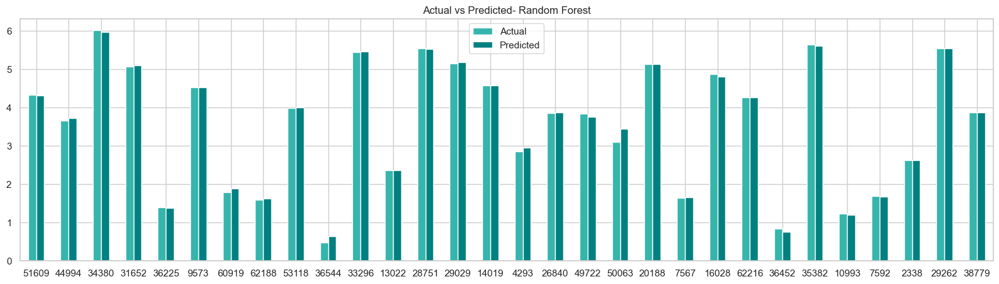

In [161]:
# create a temporary dataframe containing two columns
rf_df_tmp = pd.DataFrame({"Actual": y_test[:30], "Predicted": y_pred[:30]})
# plot the dataframe
rf_df_tmp.plot(figsize=(20,5), kind="bar", rot=0,title = 'Actual vs Predicted- Random Forest' )

<AxesSubplot:title={'center':'Actual vs Predicted- Random Forest'}>

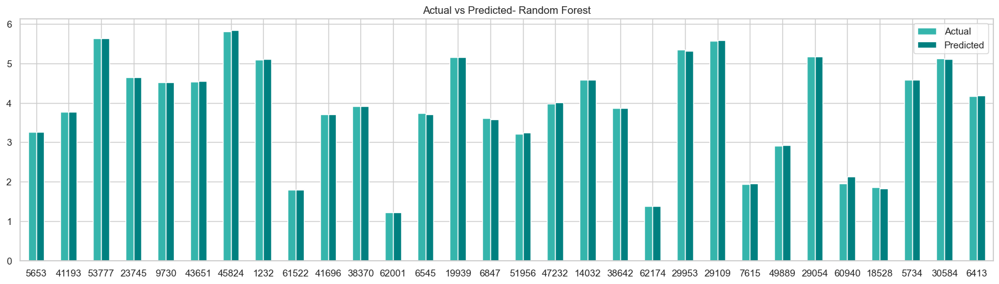

In [162]:
# create a temporary dataframe containing two columns
rf_df_tmp = pd.DataFrame({"Actual": y_train[:30], "Predicted": y_train_pred[:30]})
# plot the dataframe
rf_df_tmp.plot(figsize=(20,5), kind="bar", rot=0,title = 'Actual vs Predicted- Random Forest' )

If the R-squared (R2) score is 0 for both Lasso and Elastic Net regression models, it means that the models are not able to explain any of the variance in the target variable based on the provided predictor variables.

An R2 score of 0 indicates that the models are unable to capture any meaningful relationship between the predictor variables and the target variable. It suggests that the chosen predictor variables do not have a significant impact on the target variable, and the models cannot accurately predict or explain the variability in the target variable.

In such cases, it is important to reevaluate the choice of predictor variables, consider other potential factors that may influence the target variable, or explore alternative regression techniques to improve the model's performance and ability to explain the variance in the data.